# Analysis of DNA-MERFISH for CTP11,12,13

by Pu Zheng

2022.07.07

analysis for dataset:

dna_data_folder = r'\\10.245.74.158\Chromatin_NAS_4\20220316-P_brain_CTP11-12-13_from_0304'

rna_data_folder = r'\\10.245.74.158\Chromatin_NAS_0\20220304-P_brain_M1_nonclear_adaptors'

save_folder = r'\\10.245.74.158\Chromatin_NAS_8\Analyzed_data\20220316-P_brain_CTP11-12-13_from_0304'

In [1]:
%run "..\..\Startup_py3.py"
sys.path.append(r"..\..\..\..\Documents")

import ImageAnalysis3 as ia
%matplotlib notebook

from ImageAnalysis3 import *
print(os.getpid())

import h5py
from ImageAnalysis3.classes import _allowed_kwds
import ast

19556


## 0.1 Folders

In [2]:
save_folder = r'\\10.245.74.158\Chromatin_NAS_8\Analyzed_data\20220316-P_brain_CTP11-12-13_from_0304'
save_filenames = [os.path.join(save_folder, _fl) for _fl in os.listdir(save_folder)
                  if _fl.split(os.extsep)[-1]=='hdf5']
# extract fov_id
save_fov_ids = [int(os.path.basename(_fl).split('.hdf5')[0].split('_')[-1]) for _fl in save_filenames]

debug = False

print(f"{len(save_filenames)} fovs detected")

analysis_folder = os.path.join(save_folder, 'Analysis_1229')

segmentation_folder = os.path.join(analysis_folder, 'Segmentation')
if not os.path.exists(segmentation_folder):
    os.makedirs(segmentation_folder)
    print(f"Creating segmentation_folder: {segmentation_folder}")
else:
    print(f"Use segmentation_folder: {segmentation_folder}")

cand_spot_folder = os.path.join(analysis_folder, 'CandSpots')
if not os.path.exists(cand_spot_folder):
    os.makedirs(cand_spot_folder)
    print(f"Creating cand_spot_folder: {cand_spot_folder}")
else:
    print(f"Use cand_spot_folder: {cand_spot_folder}")

decoder_folder = cand_spot_folder.replace('CandSpots', 'Decoder')
if debug:
    _version = 0
    while os.path.exists(os.path.join(decoder_folder, f'v{_version}')):
        _version += 1
    decoder_folder = os.path.join(decoder_folder, f'v{_version}')
if not os.path.exists(decoder_folder):
    os.makedirs(decoder_folder)
    print(f"Creating decoder_folder: {decoder_folder}")
else:
    print(f"Use decoder_folder: {decoder_folder}")
    
picked_folder = os.path.join(analysis_folder, 'Picked')
if not os.path.exists(picked_folder):
    os.makedirs(picked_folder)
    print(f"Creating picked_folder: {picked_folder}")
else:
    print(f"Use picked_folder: {picked_folder}")

168 fovs detected
Use segmentation_folder: \\10.245.74.158\Chromatin_NAS_8\Analyzed_data\20220316-P_brain_CTP11-12-13_from_0304\Analysis_1229\Segmentation
Use cand_spot_folder: \\10.245.74.158\Chromatin_NAS_8\Analyzed_data\20220316-P_brain_CTP11-12-13_from_0304\Analysis_1229\CandSpots
Use decoder_folder: \\10.245.74.158\Chromatin_NAS_8\Analyzed_data\20220316-P_brain_CTP11-12-13_from_0304\Analysis_1229\Decoder
Creating picked_folder: \\10.245.74.158\Chromatin_NAS_8\Analyzed_data\20220316-P_brain_CTP11-12-13_from_0304\Analysis_1229\Picked


pixel_sizes = np.array([250,108,108])
single_im_size = np.array([50,2048,2048])

# 1. Decoding of DNA-MERFISH

In [3]:
# load two codebooks
import pandas as pd

ctp11_codebook = pd.read_csv(r'\\10.245.74.212\Chromatin_NAS_2\Chromatin_Libraries\CTP-11_brain\Summary_tables\CTP11-1000_codebook_probe_w_blanks.csv', header=0)
ctp13_codebook = pd.read_csv(r'\\10.245.74.212\Chromatin_NAS_2\Chromatin_Libraries\CTP-13_brain-super-enhancers\Summary_tables\CTP13-mop_SE_1000_w_blanks.csv', header=0)


In [4]:
ctp11_codebook

,name,id,NDB_784,NDB_755,NDB_826,NDB_713,NDB_865,NDB_725,NDB_817,NDB_710,...,NDB_824,NDB_712,NDB_818,NDB_940,NDB_872,NDB_934,NDB_926,NDB_910,chr,chr_order
0,1:3742742-3759944,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0.0
1,1:6245958-6258969,2,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,1.0
2,1:8740008-8759916,3,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,2.0
3,1:11247744-11257616,4,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,1,3.0
4,1:13741888-13757922,5,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,1,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1082,B:94-95,1157,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,B,94.0
1083,B:95-96,1158,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,B,95.0
1084,B:96-97,1159,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,B,96.0
1085,B:97-98,1160,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,B,97.0


In [5]:
ctp13_codebook

,name,id,NDB_376,NDB_578,NDB_400,NDB_533,NDB_568,NDB_464,NDB_466,NDB_431,...,NDB_608,NDB_460,NDB_563,NDB_592,NDB_368,NDB_436,NDB_629,NDB_604,chr,chr_order
0,1:9627926-9637875,1,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0.0
1,1:9799472-9811359,2,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,1,1.0
2,1:20920666-20929358,3,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,1,2.0
3,1:21522568-21534512,4,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,3.0
4,1:21732182-21745770,5,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1060,B:194-195,1086,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,B,94.0
1061,B:195-196,1087,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,B,95.0
1062,B:196-197,1088,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,B,96.0
1063,B:197-198,1089,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,B,97.0


## Load bit_2_name

In [6]:
readout_df_gn = pd.read_csv(r'\\10.245.74.212\Chromatin_NAS_2\Chromatin_Libraries\CTP-11_brain\Summary_tables\CTP11-mouse-genome-1000_combo_readouts.csv')
readout_df_se = pd.read_csv(r'\\10.245.74.212\Chromatin_NAS_2\Chromatin_Libraries\CTP-13_brain-super-enhancers\Summary_tables\CTP13-mouse-SE_combo_readouts.csv')

# merge
readout_df_se['Bit']+=100
readout_df = pd.concat([readout_df_gn, readout_df_se])
readout_df

,Bit,ReadoutName
0,1,NDB_784
1,2,NDB_755
2,3,NDB_826
3,4,NDB_713
4,5,NDB_865
...,...,...
90,191,NDB_592
91,192,NDB_368
92,193,NDB_436
93,194,NDB_629


## 3.3 prepare kwargs to decode CTP11

In [7]:
np.sum(_fov_spots_df['sigma_z']==4)

NameError: name '_fov_spots_df' is not defined

In [ ]:
plt.figure()
plt.scatter(_fov_spots_df['background'], _fov_spots_df['height'], s=0.1, alpha=0.3)
plt.show()

In [ ]:
plt.figure()
plt.scatter(_fov_spots_df['bit'], _fov_spots_df['height'], s=0.1, alpha=0.3)
plt.show()

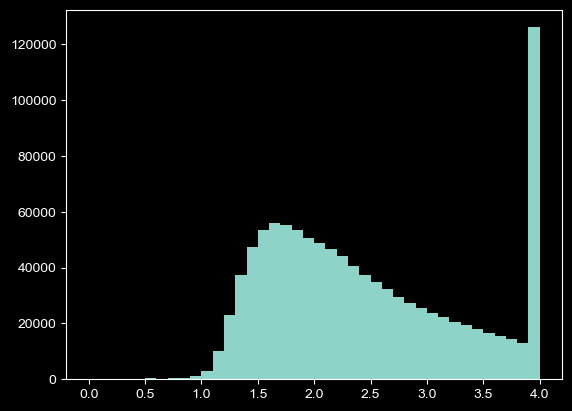

In [75]:
plt.figure()
plt.hist(_fov_spots_df['sigma_z'], bins = np.arange(0,4.1,0.1))
plt.show()

In [115]:
_fov_kept_spots_df = filter_candidate_spots(_fov_spots_df)

-- 65.0% of 1048923 spots kept.


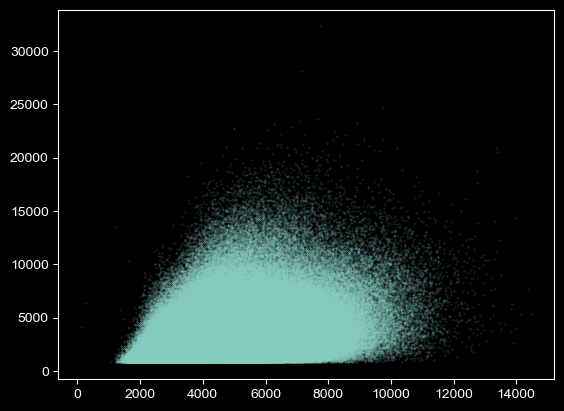

In [111]:
plt.figure()
plt.scatter(_fov_kept_spots_df['background'], _fov_kept_spots_df['height'], s=0.1, alpha=0.3)
plt.show()

<function ImageAnalysis3.spot_tools.checking.filter_candidate_spots(cand_spots_df, background_th=[100, inf], height_th=[800, inf], sigma_xy_th=[0.5, 3], sigma_z_th=[0.5, 3.5], verbose=True)>

In [132]:
reload(spot_tools.checking)

<module 'ImageAnalysis3.spot_tools.checking' from 'E:\\Users\\puzheng_new\\Documents\\Chromatin_Analysis_Scripts\\Tissue_DNA-FISH\\CTP13_SE\\..\\..\\..\\..\\Documents\\ImageAnalysis3\\spot_tools\\checking.py'>

In [9]:
%%time
from tqdm import tqdm
from ImageAnalysis3.classes import new_decoder
reload(ia.classes.new_decoder)
from ImageAnalysis3.classes.new_decoder import batch_process_SpotDecoder

overwrite_decoder = True
verbose_decoder = True
return_decoder = True #return_decoder = False

pair_search_radius = 300
pair_search_eps = 0.25
ctp11_data_type = 'combo'
ctp11_lib_name = 'CTP11'
ctp11_decode_args = []
for _fov_id, _save_filename in zip(save_fov_ids, save_filenames):
    print(f"- Preparing decoding args for fov: {_fov_id},", end=' ')
    # load candidate spots for the fov
    cand_spot_filename = os.path.join(cand_spot_folder, ctp11_data_type,
                                      os.path.basename(_save_filename).replace('.hdf5', f'_CandSpots.csv') )
    if os.path.isfile(cand_spot_filename):
        _fov_spots_df = pd.read_csv(cand_spot_filename)
    else:
        continue # skip if fov doesn't exist
    # filter
    _fov_kept_spots_df = ia.spot_tools.checking.filter_candidate_spots(_fov_spots_df)
    
    for _cell_id in np.unique(_fov_kept_spots_df['cell_id']):
        # get decoder filename
        _decoder_filename = os.path.join(decoder_folder, f"Decoded_fov-{_fov_id}_cell-{_cell_id}.hdf5")
        # check if overwrite:
        if not overwrite_decoder and os.path.exists(_decoder_filename):
            # skip if exists
            with h5py.File(_decoder_filename, 'r') as _f:
                if ctp11_lib_name in _f.keys():
                    continue
        # get cell_df
        _cell_spots_df =_fov_kept_spots_df[_fov_kept_spots_df['cell_id']==_cell_id]
        # prepare args
        ctp11_decode_args.append(
            (ctp11_lib_name, _cell_spots_df, ctp11_codebook, readout_df, _decoder_filename,
             pair_search_radius, pair_search_eps, overwrite_decoder, verbose_decoder, return_decoder)
        )
    print(len(ctp11_decode_args))
    
    break
    


- Preparing decoding args for fov: 0, -- 65.0% of 1048923 spots kept.
112
Wall time: 4.55 s


## Test decoding for one cell

In [10]:
%matplotlib inline
from ImageAnalysis3.classes.new_decoder import batch_process_SpotMapper, batch_process_SpotDecoder
sel_cell = 10

# conbinatorial
decoder = batch_process_SpotDecoder(*ctp11_decode_args[sel_cell])
#batch_process_SpotDecoder(*ctp13_decode_args[sel_cell])
# sequential
#batch_process_SpotMapper(*ctp12_decode_args[sel_cell])

- Matching 194 bits to (1087, 103) codebook
-- 99 bits matched
- Process (1087, 102) codebook into valid pairs
-- 3261 valid pairs detected.
- Searching for spot-pairs within 300nm.
-- find candidate pairs by KDTree


E:\Users\puzheng_new\Documents\Chromatin_Analysis_Scripts\Tissue_DNA-FISH\CTP13_SE\..\..\..\..\Documents\ImageAnalysis3\classes\new_decoder.py:98: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.bit_codebook[_matched_bit[0]] = self.codebook[_col].copy()


-- filter candidate pairs by codebook
-- 8219 pairs selected.
- Select spot_groups from candidate pairs with radius:300, max_usage=1
-- calculate scores for candSpotPairs


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8219/8219 [00:02<00:00, 2809.70it/s]


-- 1029 full tuples selected


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8219/8219 [00:00<00:00, 78220.05it/s]


-- 818 pairs selected
-- in total 1847 spot_groups detected
- Save decoder of CTP11 into file: \\10.245.74.158\Chromatin_NAS_8\Analyzed_data\20220316-P_brain_CTP11-12-13_from_0304\Analysis_1229\Decoder\Decoded_fov-0_cell-12.hdf5
-- existing info: ['bits', 'candSpots', 'codebook', 'readoutDf', 'spotGroups'] and ['search_eps', 'search_radius']
-- remove existing bits
-- save bits
-- save search_radius to attrs
-- save search_eps to attrs
-- save readoutDf
-- save codebook
-- save candSpots
-- save spotGroups


E:\Users\puzheng_new\Documents\Chromatin_Analysis_Scripts\Tissue_DNA-FISH\CTP13_SE\..\..\..\..\Documents\ImageAnalysis3\classes\new_decoder.py:389: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed,key->block4_values] [items->Index(['uid', 'homolog', 'channel_0', 'channel_1', 'channel_2', 'region_name',
       'start', 'end', 'chr'],
      dtype='object')]

  _spotGroupDf.to_hdf(self.saveFile, f'{self.codebook_name}/spotGroups', complevel=_complevel, complib=_complib)


- Save spot_stats iamage to file: \\10.245.74.158\Chromatin_NAS_8\Analyzed_data\20220316-P_brain_CTP11-12-13_from_0304\Analysis_1229\Decoder\Decoded_fov-0_cell-12_CTP11_stats.png


In [25]:
%matplotlib inline
from ImageAnalysis3.classes.new_decoder import batch_process_SpotMapper, batch_process_SpotDecoder
sel_cell = 10

# conbinatorial
decoder = batch_process_SpotDecoder(*ctp11_decode_args[sel_cell])
#batch_process_SpotDecoder(*ctp13_decode_args[sel_cell])
# sequential
#batch_process_SpotMapper(*ctp12_decode_args[sel_cell])

- Matching 194 bits to (1087, 103) codebook
-- 99 bits matched
- Process (1087, 102) codebook into valid pairs
-- 3261 valid pairs detected.
- Searching for spot-pairs within 300nm.
-- find candidate pairs by KDTree
-- filter candidate pairs by codebook


E:\Users\puzheng_new\Documents\Chromatin_Analysis_Scripts\Tissue_DNA-FISH\CTP13_SE\..\..\..\..\Documents\ImageAnalysis3\classes\new_decoder.py:98: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.bit_codebook[_matched_bit[0]] = self.codebook[_col].copy()


-- 15060 pairs selected.
- Select spot_groups from candidate pairs with radius:300, max_usage=1
-- calculate scores for candSpotPairs


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15060/15060 [00:03<00:00, 3811.74it/s]


-- 1443 full tuples selected


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15060/15060 [00:10<00:00, 1480.30it/s]


-- 1308 pairs selected
-- in total 2751 spot_groups detected
- Save decoder of CTP11 into file: \\10.245.74.158\Chromatin_NAS_8\Analyzed_data\20220316-P_brain_CTP11-12-13_from_0304\Analysis_1229\Decoder\Decoded_fov-0_cell-12.hdf5
-- existing info: ['bits', 'candSpots', 'codebook', 'readoutDf', 'spotGroups'] and ['search_eps', 'search_radius']
-- remove existing bits
-- save bits
-- save search_radius to attrs
-- save search_eps to attrs
-- save readoutDf
-- save codebook
-- save candSpots
-- save spotGroups


E:\Users\puzheng_new\Documents\Chromatin_Analysis_Scripts\Tissue_DNA-FISH\CTP13_SE\..\..\..\..\Documents\ImageAnalysis3\classes\new_decoder.py:389: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed,key->block4_values] [items->Index(['uid', 'homolog', 'channel_0', 'channel_1', 'channel_2', 'region_name',
       'start', 'end', 'chr'],
      dtype='object')]

  _spotGroupDf.to_hdf(self.saveFile, f'{self.codebook_name}/spotGroups', complevel=_complevel, complib=_complib)


- Save spot_stats iamage to file: \\10.245.74.158\Chromatin_NAS_8\Analyzed_data\20220316-P_brain_CTP11-12-13_from_0304\Analysis_1229\Decoder\Decoded_fov-0_cell-12_CTP11_stats.png


In [41]:
decoder.

498

In [37]:
np.unique(decoder.spotUsage, return_counts=True)

(array([0., 1.]), array([10168,  6945], dtype=int64))

## Plot decoded spots

In [118]:
import matplotlib
import matplotlib.pyplot as plt
plt.rc('font', family='serif')
plt.rc('font', serif='Arial')
plt.style.use('dark_background')

matplotlib.rcParams['pdf.fonttype'] = 42

In [119]:
decoded_figure_folder = os.path.join(decoder_folder, 'Decoded_3D_figures')
print(decoded_figure_folder)
if not os.path.exists(decoded_figure_folder):
    os.makedirs(decoded_figure_folder)

\\10.245.74.158\Chromatin_NAS_8\Analyzed_data\20220316-P_brain_CTP11-12-13_from_0304\Analysis_1229\Decoder\Decoded_3D_figures


In [120]:
with h5py.File(ctp11_decode_args[sel_cell][4], 'r') as _f:
    print(_f['CTP11'].keys())

<KeysViewHDF5 ['bits', 'candSpots', 'codebook', 'readoutDf', 'spotGroups']>


In [123]:
_decoded_df = pd.read_hdf(ctp11_decode_args[sel_cell][4], f'{sel_lib}/spotGroups')
_blank_decoded_df = _decoded_df.loc[_decoded_df['chr']=='B']

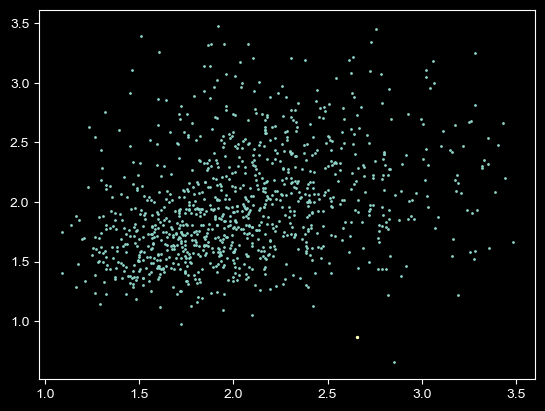

In [124]:
plt.figure()
plt.scatter(_decoded_df['sigma_z_2'], _decoded_df['sigma_z_1'], s=1)
plt.scatter(_blank_decoded_df['sigma_z_2'], _blank_decoded_df['sigma_z_1'], s=2)

In [125]:
len(_blank_decoded_df)

21

In [47]:
pd.read_hdf(ctp11_decode_args[sel_cell][4], f'{sel_lib}/codebook')


,name,id,NDB_784,NDB_755,NDB_826,NDB_713,NDB_865,NDB_725,NDB_817,NDB_710,...,NDB_824,NDB_712,NDB_818,NDB_940,NDB_872,NDB_934,NDB_926,NDB_910,chr,chr_order
0,1:3742742-3759944,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0.0
1,1:6245958-6258969,2,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,1.0
2,1:8740008-8759916,3,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,2.0
3,1:11247744-11257616,4,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,1,3.0
4,1:13741888-13757922,5,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,1,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1082,B:94-95,1157,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,B,94.0
1083,B:95-96,1158,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,B,95.0
1084,B:96-97,1159,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,B,96.0
1085,B:97-98,1160,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,B,97.0


<IPython.core.display.Javascript object>


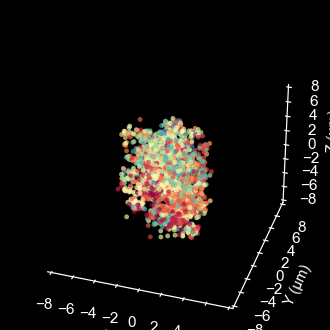

In [127]:
%matplotlib notebook
sel_lib = 'CTP11'
_decoded_groups = pd.read_hdf(ctp11_decode_args[sel_cell][4], f'{sel_lib}/spotGroups')
_zxys = _decoded_groups[['center_z', 'center_x', 'center_y']].values / 1000
_zxys = _zxys - np.nanmean(_zxys, axis=0)
_rids = _decoded_groups['region_id'].values

figure_width = 3
figure_dpi=100
marker_size = 10
marker_alpha = 0.7
_font_size = 7.5
plot_radius = 8
background_color = [0,0,0]
depthshade=False

fig = plt.figure(figsize=(figure_width, figure_width), dpi=figure_dpi)

ax3d = fig.add_subplot(111, projection='3d')
ax3d.set_facecolor(background_color)
fig.subplots_adjust(left=0, right=1, bottom=0, top=0.9)
# turn off grid if needed
ax3d.grid(False)
ax3d.xaxis.set_pane_color((0.0, 0.0, 0.0, 0.0))
ax3d.yaxis.set_pane_color((0.0, 0.0, 0.0, 0.0))
ax3d.zaxis.set_pane_color((0.0, 0.0, 0.0, 0.0))

_valid_inds = (np.isnan(_zxys).sum(1) == 0)
_sc = ax3d.scatter(_zxys[_valid_inds,1], _zxys[_valid_inds,2], _zxys[_valid_inds,0],
                   c=_rids, cmap='Spectral',
                   s=marker_size, depthshade=depthshade, 
                   alpha=marker_alpha,
                   linewidth=0,)
# axes limits
ax3d.axes.set_xlim3d(left=-plot_radius, right=plot_radius) 
ax3d.axes.set_ylim3d(bottom=-plot_radius, top=plot_radius) 
ax3d.axes.set_zlim3d(bottom=-plot_radius, top=plot_radius) 
# axes ticks
ax3d.set_xticks(np.arange(-plot_radius,plot_radius+1, 2))
ax3d.set_yticks(np.arange(-plot_radius,plot_radius+1, 2))
ax3d.set_zticks(np.arange(-plot_radius,plot_radius+1, 2))
# axes labels
ax3d.set_xlabel(f"X (\u03BCm)", fontsize=_font_size+2, labelpad=1)
ax3d.set_ylabel(f"Y (\u03BCm)", fontsize=_font_size+2, labelpad=1)
ax3d.set_zlabel(f"Z (\u03BCm)", fontsize=_font_size+2, labelpad=1)

# save pdf and png
fig.savefig(os.path.join(decoded_figure_folder, 
                         f"{os.path.basename(ctp11_decode_args[sel_cell][4]).replace('.hdf5', f'_decoded_{sel_lib}.png')}"),
            transparent=True)

In [13]:
_decoded_groups

,fov_id,cell_id,uid,homolog,sel_index,height_0,z_0,x_0,y_0,background_0,...,region_name,start,end,chr,center_z,center_x,center_y,center_intensity,center_intensity_var,center_internal_dist
0,0,12,b'259202492748634617304623818845147108919',None,0,8277.449219,26.068588,252.269409,1480.623779,4994.583984,...,17:73751388-73759983,73751388,73759983,17,6553.304167,27243.15840,159901.7184,6636.495367,0.348848,111.695218
1,0,12,b'259202492748634617304623818845147108919',None,1,14399.508789,19.807699,253.958740,1470.700195,5192.374512,...,4:8751988-8760000,8751988,8760000,4,4917.331667,27432.79560,158835.4128,11722.954500,0.314599,46.061746
2,0,12,b'259202492748634617304623818845147108919',None,2,6631.230469,16.376326,265.310913,1491.369263,4360.090332,...,4:46250010-46259963,46250010,46259963,4,4132.736583,28653.94728,161050.4424,5803.133467,0.206380,71.473181
3,0,12,b'259202492748634617304623818845147108919',None,3,6818.067871,16.633196,240.192505,1491.061279,5388.959473,...,10:76252105-76259992,76252105,76259992,10,4149.310417,25935.75864,161039.8404,6059.730000,0.194839,20.031844
4,0,12,b'259202492748634617304623818845147108919',None,4,7228.201172,22.537771,236.480103,1455.291382,5924.856934,...,1:91252155-91259954,91252155,91259954,1,5600.459583,25549.50132,157177.1844,6261.333600,0.211208,45.158738
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2746,0,12,b'259202492748634617304623818845147108919',None,2746,1304.117920,20.469616,229.071777,1470.015625,5986.056641,...,3:18751401-18759965,18751401,18759965,3,5249.213000,24737.37894,158833.0296,1066.536125,0.222760,299.795434
2747,0,12,b'259202492748634617304623818845147108919',None,2747,651.324097,19.121786,231.341309,1508.020386,3648.883545,...,17:28748105-28759540,28748105,28759540,17,4883.073125,25062.95466,162791.9910,636.717685,0.022940,297.578356
2748,0,12,b'259202492748634617304623818845147108919',None,2748,558.028198,17.515448,236.500122,1468.230103,2936.114990,...,10:113747740-113759923,113747740,113759923,10,4507.020000,25530.00282,158618.7630,511.507235,0.090949,276.115513
2749,0,12,b'259202492748634617304623818845147108919',None,2749,881.499146,15.115278,249.267456,1479.826050,5399.931152,...,4:88740371-88757758,88740371,88757758,4,3709.490250,26789.87358,159800.7582,753.478000,0.169907,299.258481


In [15]:
np.unique(_decoded_groups['chr'])

array(['1', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19',
       '2', '3', '4', '5', '6', '7', '8', '9', 'B', 'X', 'Y'],
      dtype=object)

# Process All

In [129]:
%%time
from ImageAnalysis3.classes.new_decoder import batch_process_SpotDecoder
import multiprocessing as mp
print(len(ctp11_decode_args))
with mp.Pool(44) as decode_pool:
    decode_results = decode_pool.starmap(batch_process_SpotDecoder, ctp11_decode_args, chunksize=1)
    decode_pool.close()
    decode_pool.join()
    decode_pool.terminate()

29033
Wall time: 2h 57s


In [136]:
# Delete args to release RAM
del(ctp11_decode_args)
del(decode_results)

## 3.4 prepare kwargs to decode CTP13

In [11]:
%%time
from tqdm import tqdm
from ImageAnalysis3.classes import new_decoder
reload(ia.classes.new_decoder)
from ImageAnalysis3.classes.new_decoder import batch_process_SpotDecoder

overwrite_decoder = True
verbose_decoder = True
return_decoder = False

pair_search_radius = 300
pair_search_eps = 0.25
ctp13_data_type = 'combo'
ctp13_lib_name = 'CTP13'
ctp13_decode_args = []
for _fov_id, _save_filename in zip(save_fov_ids, save_filenames):
    print(f"- Preparing decoding args for fov: {_fov_id},", end=' ')
    # load candidate spots for the fov
    cand_spot_filename = os.path.join(cand_spot_folder, ctp13_data_type,
                                      os.path.basename(_save_filename).replace('.hdf5', f'_CandSpots.csv') )
    if os.path.isfile(cand_spot_filename):
        _fov_spots_df = pd.read_csv(cand_spot_filename)
    else:
        continue # skip if fov doesn't exist
    
    # filter
    _fov_kept_spots_df = ia.spot_tools.checking.filter_candidate_spots(_fov_spots_df)
    
    for _cell_id in np.unique(_fov_kept_spots_df['cell_id']):
        # get decoder filename
        _decoder_filename = os.path.join(decoder_folder, f"Decoded_fov-{_fov_id}_cell-{_cell_id}.hdf5")
        # check if overwrite:
        if not overwrite_decoder and os.path.exists(_decoder_filename):
            # skip if exists
            with h5py.File(_decoder_filename, 'r') as _f:
                if ctp13_lib_name in _f.keys():
                    continue
        # get cell_df
        _cell_spots_df =_fov_kept_spots_df[_fov_kept_spots_df['cell_id']==_cell_id]
        # prepare args
        ctp13_decode_args.append(
            (ctp13_lib_name, _cell_spots_df, ctp13_codebook, readout_df, _decoder_filename,
             pair_search_radius, pair_search_eps, overwrite_decoder, verbose_decoder, return_decoder)
        )
    print(len(ctp13_decode_args))

- Preparing decoding args for fov: 0, -- 65.0% of 1048923 spots kept.
112
- Preparing decoding args for fov: 1, -- 69.6% of 1255353 spots kept.
278
- Preparing decoding args for fov: 2, -- 72.3% of 555434 spots kept.
319
- Preparing decoding args for fov: 3, -- 77.7% of 1304167 spots kept.
529
- Preparing decoding args for fov: 4, -- 74.6% of 1274686 spots kept.
717
- Preparing decoding args for fov: 5, -- 73.8% of 1135753 spots kept.
926
- Preparing decoding args for fov: 6, -- 73.1% of 1081686 spots kept.
1097
- Preparing decoding args for fov: 7, -- 72.2% of 1155297 spots kept.
1255
- Preparing decoding args for fov: 8, -- 70.3% of 1420299 spots kept.
1416
- Preparing decoding args for fov: 9, -- 65.4% of 1508215 spots kept.
1553
- Preparing decoding args for fov: 10, -- 67.3% of 1217148 spots kept.
1699
- Preparing decoding args for fov: 11, -- 67.2% of 1506605 spots kept.
1854
- Preparing decoding args for fov: 12, -- 71.3% of 1313613 spots kept.
2005
- Preparing decoding args for

18223
- Preparing decoding args for fov: 108, -- 61.6% of 1330521 spots kept.
18409
- Preparing decoding args for fov: 109, -- 61.0% of 1671877 spots kept.
18600
- Preparing decoding args for fov: 110, -- 60.5% of 1577027 spots kept.
18769
- Preparing decoding args for fov: 111, -- 62.2% of 1737845 spots kept.
18968
- Preparing decoding args for fov: 112, -- 63.2% of 1831553 spots kept.
19180
- Preparing decoding args for fov: 113, -- 60.5% of 1119265 spots kept.
19300
- Preparing decoding args for fov: 114, -- 58.5% of 1595933 spots kept.
19451
- Preparing decoding args for fov: 115, -- 56.9% of 1604880 spots kept.
19610
- Preparing decoding args for fov: 116, -- 56.0% of 1320340 spots kept.
19763
- Preparing decoding args for fov: 117, -- 55.2% of 1436034 spots kept.
19970
- Preparing decoding args for fov: 118, -- 64.0% of 1123836 spots kept.
20197
- Preparing decoding args for fov: 119, -- 64.2% of 998283 spots kept.
20399
- Preparing decoding args for fov: 120, -- 61.1% of 1081466

## Test decoding the same cell

In [12]:
%matplotlib inline
from ImageAnalysis3.classes.new_decoder import batch_process_SpotMapper, batch_process_SpotDecoder

# conbinatorial
#batch_process_SpotDecoder(*ctp11_decode_args[sel_cell])
batch_process_SpotDecoder(*ctp13_decode_args[sel_cell])
# sequential
#batch_process_SpotMapper(*ctp12_decode_args[sel_cell])

- Matching 194 bits to (1065, 99) codebook
-- 95 bits matched
- Process (1065, 98) codebook into valid pairs
-- 3195 valid pairs detected.
- Searching for spot-pairs within 300nm.
-- find candidate pairs by KDTree
-- filter candidate pairs by codebook
-- 7254 pairs selected.
- Select spot_groups from candidate pairs with radius:300, max_usage=1
-- calculate scores for candSpotPairs


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 7254/7254 [00:01<00:00, 4216.75it/s]


-- 769 full tuples selected


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 7254/7254 [00:00<00:00, 111516.05it/s]


-- 969 pairs selected
-- in total 1738 spot_groups detected
- Save decoder of CTP13 into file: \\10.245.74.158\Chromatin_NAS_8\Analyzed_data\20220316-P_brain_CTP11-12-13_from_0304\Analysis_1229\Decoder\Decoded_fov-0_cell-12.hdf5
-- existing info: ['bits', 'candSpots', 'codebook', 'readoutDf', 'spotGroups'] and ['search_eps', 'search_radius']
-- remove existing bits
-- save bits
-- save search_radius to attrs
-- save search_eps to attrs
-- save readoutDf
-- save codebook
-- save candSpots
-- save spotGroups


E:\Users\puzheng_new\Documents\Chromatin_Analysis_Scripts\Tissue_DNA-FISH\CTP13_SE\..\..\..\..\Documents\ImageAnalysis3\classes\new_decoder.py:389: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed,key->block4_values] [items->Index(['uid', 'homolog', 'channel_0', 'channel_1', 'channel_2', 'region_name',
       'start', 'end', 'chr'],
      dtype='object')]

  _spotGroupDf.to_hdf(self.saveFile, f'{self.codebook_name}/spotGroups', complevel=_complevel, complib=_complib)


- Save spot_stats iamage to file: \\10.245.74.158\Chromatin_NAS_8\Analyzed_data\20220316-P_brain_CTP11-12-13_from_0304\Analysis_1229\Decoder\Decoded_fov-0_cell-12_CTP13_stats.png


<IPython.core.display.Javascript object>


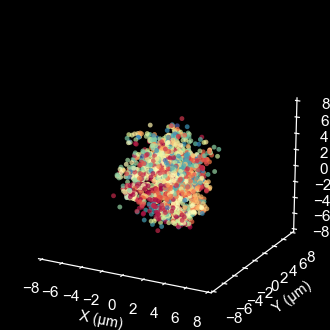

In [42]:
%matplotlib notebook
sel_lib = 'CTP13'
_decoded_groups = pd.read_hdf(ctp13_decode_args[sel_cell][4], f'{sel_lib}/spotGroups')
_zxys = _decoded_groups[['center_z', 'center_x', 'center_y']].values / 1000
_zxys = _zxys - np.nanmean(_zxys, axis=0)
_rids = _decoded_groups['region_id'].values

figure_width = 3
figure_dpi=100
marker_size = 10
marker_alpha = 0.7
_font_size = 7.5
plot_radius = 8
background_color = [0,0,0]
depthshade=False

fig = plt.figure(figsize=(figure_width, figure_width), dpi=figure_dpi)

ax3d = fig.add_subplot(111, projection='3d')
ax3d.set_facecolor(background_color)
fig.subplots_adjust(left=0, right=1, bottom=0, top=0.9)
# turn off grid if needed
ax3d.grid(False)
ax3d.xaxis.set_pane_color((0.0, 0.0, 0.0, 0.0))
ax3d.yaxis.set_pane_color((0.0, 0.0, 0.0, 0.0))
ax3d.zaxis.set_pane_color((0.0, 0.0, 0.0, 0.0))

_valid_inds = (np.isnan(_zxys).sum(1) == 0)
_sc = ax3d.scatter(_zxys[_valid_inds,1], _zxys[_valid_inds,2], _zxys[_valid_inds,0],
                   c=_rids, cmap='Spectral',
                   s=marker_size, depthshade=depthshade, 
                   alpha=marker_alpha,
                   linewidth=0,)
# axes limits
ax3d.axes.set_xlim3d(left=-plot_radius, right=plot_radius) 
ax3d.axes.set_ylim3d(bottom=-plot_radius, top=plot_radius) 
ax3d.axes.set_zlim3d(bottom=-plot_radius, top=plot_radius) 
# axes ticks
ax3d.set_xticks(np.arange(-plot_radius,plot_radius+1, 2))
ax3d.set_yticks(np.arange(-plot_radius,plot_radius+1, 2))
ax3d.set_zticks(np.arange(-plot_radius,plot_radius+1, 2))
# axes labels
ax3d.set_xlabel(f"X (\u03BCm)", fontsize=_font_size+2, labelpad=1)
ax3d.set_ylabel(f"Y (\u03BCm)", fontsize=_font_size+2, labelpad=1)
ax3d.set_zlabel(f"Z (\u03BCm)", fontsize=_font_size+2, labelpad=1)

# save pdf and png
fig.savefig(os.path.join(decoded_figure_folder, 
                         f"{os.path.basename(ctp13_decode_args[sel_cell][4]).replace('.hdf5', f'_decoded_{sel_lib}.png')}"),
            transparent=True)

## Process ALL

In [14]:
%%time
from ImageAnalysis3.classes.new_decoder import batch_process_SpotDecoder
import multiprocessing as mp
print(len(ctp13_decode_args))
with mp.Pool(44) as decode_pool:
    decode_results = decode_pool.starmap(batch_process_SpotDecoder, ctp13_decode_args, chunksize=1)
    decode_pool.close()
    decode_pool.join()
    decode_pool.terminate()

29033
Wall time: 3h 2min 34s


In [17]:
# Delete args to release RAM
del(ctp13_decode_args)
del(decode_results)

# 5. CTP12, sequential TSS for markergenes

## 5.1 prepare kwargs to map sequential CTP12

In [15]:
ctp12_codebook = pd.read_csv(r'\\10.245.74.212\Chromatin_NAS_2\Chromatin_Libraries\CTP-12_mop_markers\Summary_tables\CTP12-TSS_sequential-codebook.csv', header=0)
ctp12_codebook

,name,id,chr,Stv_91,Stv_32,Stv_92,Stv_33,Stv_94,Stv_35,Stv_95,...,Stv_106,Stv_45,Stv_107,Stv_46,Stv_109,Stv_48,Stv_118,Stv_50,Stv_119,Stv_53
0,5:31098237-31118237,Slc30a3,5,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,7:45153949-45173949,Slc17a7,7,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,2:158600767-158620767,Slc32a1,2,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,2:70543072-70563072,Gad1,2,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,5:30451932-30471932,Otof,5,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
5,4:124976430-124996430,Rspo1,4,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
6,15:78196400-78216400,Pvalb,15,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
7,16:23880958-23900958,Sst,16,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,10:5629218-5649218,Vip,10,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,14:34364789-34384789,Sncg,14,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [16]:
ctp12_readout_df = pd.read_csv(r'\\10.245.74.212\Chromatin_NAS_2\Chromatin_Libraries\CTP-12_mop_markers\Summary_tables\CTP12-TSS_unique_readouts.csv', header=0)
ctp12_readout_df

,Bit,ReadoutName
0,1,Stv_91
1,2,Stv_32
2,3,Stv_92
3,4,Stv_33
4,5,Stv_94
5,6,Stv_35
6,7,Stv_95
7,8,Stv_36
8,9,Stv_99
9,10,Stv_37


In [17]:
%%time
from tqdm import tqdm
from ImageAnalysis3.classes import new_decoder
reload(ia.classes.new_decoder)
from ImageAnalysis3.classes.new_decoder import batch_process_SpotMapper

overwrite_decoder = True
verbose_decoder = True
return_decoder = False

ctp12_lib_name = 'CTP12tss'
ctp12_data_type = 'unique'
ctp12_decode_args = []

for _fov_id, _save_filename in zip(save_fov_ids, save_filenames):
    print(f"- Preparing decoding args for fov: {_fov_id},", end=' ')
    # load candidate spots for the fov
    cand_spot_filename = os.path.join(cand_spot_folder, ctp12_data_type,
                                      os.path.basename(_save_filename).replace('.hdf5', f'_CandSpots.csv') )
    if os.path.isfile(cand_spot_filename):
        _fov_spots_df = pd.read_csv(cand_spot_filename)
    else:
        print(f"-- skip")
        continue # skip if fov doesn't exist
    # filter
    _fov_kept_spots_df = ia.spot_tools.checking.filter_candidate_spots(_fov_spots_df)
    
    
    for _cell_id in np.unique(_fov_kept_spots_df['cell_id']):
        # get decoder filename
        _decoder_filename = os.path.join(decoder_folder, f"Decoded_fov-{_fov_id}_cell-{_cell_id}.hdf5")
        # check if overwrite:
        if not overwrite_decoder and os.path.exists(_decoder_filename):
            # skip if exists
            with h5py.File(_decoder_filename, 'r') as _f:
                if ctp12_lib_name in _f.keys():
                    continue

        # get decoder filename
        _decoder_filename = os.path.join(decoder_folder, f"Decoded_fov-{_fov_id}_cell-{_cell_id}.hdf5")
        # get cell_df
        _cell_spots_df =_fov_kept_spots_df[_fov_kept_spots_df['cell_id']==_cell_id]
        # prepare args
        ctp12_decode_args.append(
            (ctp12_lib_name, _cell_spots_df, ctp12_codebook, ctp12_readout_df, _decoder_filename,
             pair_search_radius, pair_search_eps, overwrite_decoder, verbose_decoder, return_decoder)
        )
    print(len(ctp12_decode_args))
    

- Preparing decoding args for fov: 0, -- 22.4% of 29647 spots kept.
107
- Preparing decoding args for fov: 1, -- 28.6% of 32507 spots kept.
268
- Preparing decoding args for fov: 2, -- 34.0% of 10764 spots kept.
309
- Preparing decoding args for fov: 3, -- 33.2% of 26724 spots kept.
513
- Preparing decoding args for fov: 4, -- 32.4% of 26877 spots kept.
699
- Preparing decoding args for fov: 5, -- 30.7% of 25590 spots kept.
888
- Preparing decoding args for fov: 6, -- 31.6% of 23267 spots kept.
1048
- Preparing decoding args for fov: 7, -- 26.2% of 31192 spots kept.
1199
- Preparing decoding args for fov: 8, -- 29.8% of 33294 spots kept.
1358
- Preparing decoding args for fov: 9, -- 25.1% of 42634 spots kept.
1494
- Preparing decoding args for fov: 10, -- 30.8% of 27409 spots kept.
1637
- Preparing decoding args for fov: 11, -- 25.4% of 41989 spots kept.
1787
- Preparing decoding args for fov: 12, -- 29.0% of 32753 spots kept.
1936
- Preparing decoding args for fov: 13, -- 29.6% of 286

## Process ALL

In [18]:
from ImageAnalysis3.classes.new_decoder import batch_process_SpotMapper, batch_process_SpotDecoder
import multiprocessing as mp

In [19]:
%%time
print(len(ctp12_decode_args))
with mp.Pool(32) as decode_pool:
    decode_results = decode_pool.starmap(batch_process_SpotMapper, ctp12_decode_args, chunksize=1)
    decode_pool.close()
    decode_pool.join()
    decode_pool.terminate()

27772
Wall time: 41min 35s


## load decoded results

In [20]:
sel_col = ['region_name', 'chr','start','end','center_intensity', 'center_z', 'center_x', 'center_y']
#sel_cell = 10
sel_filename = ctp12_decode_args[sel_cell][4]

ctp11_decoded_df = pd.read_hdf(sel_filename, 'CTP11/spotGroups')[sel_col]
ctp13_decoded_df = pd.read_hdf(sel_filename, 'CTP13/spotGroups')[sel_col]

ctp12_decoded_df = pd.read_hdf(sel_filename, 'CTP12tss/candSpots')[sel_col]

## 3D rendering of decoded spots

In [41]:
decoded_figure_folder = os.path.join(decoder_folder, 'Decoded_3D')
if not os.path.exists(decoded_figure_folder):
    os.makedirs(decoded_figure_folder)

In [22]:
from matplotlib import animation
plot_animation = True
angle = 3

from ImageAnalysis3.figure_tools import _dpi,_single_col_width,_double_col_width,_single_row_height,_ref_bar_length, _ticklabel_size,_ticklabel_width,_font_size
figure_width = _double_col_width
figure_dpi=100
background_color = [0,0,0]
marker_size = 8
marker_alpha = 1

depthshade=False

<IPython.core.display.Javascript object>


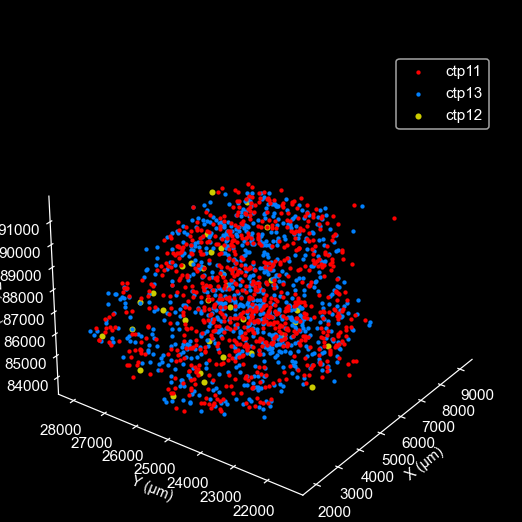

In [23]:
%matplotlib notebook
plt.rc('font', family='serif')
plt.rc('font', serif='Arial')
plt.style.use('dark_background')
fig = plt.figure(figsize=(figure_width, figure_width), dpi=figure_dpi)
ax3d = fig.add_subplot(111, projection='3d')
ax3d.set_facecolor(background_color)
fig.subplots_adjust(left=0, right=1, bottom=0, top=0.9)
# turn off grid if needed
ax3d.grid(False)
ax3d.xaxis.set_pane_color((0.0, 0.0, 0.0, 0.0))
ax3d.yaxis.set_pane_color((0.0, 0.0, 0.0, 0.0))
ax3d.zaxis.set_pane_color((0.0, 0.0, 0.0, 0.0))

#"ctp11"
_sc = ax3d.scatter(ctp11_decoded_df['center_z'], ctp11_decoded_df['center_x'], ctp11_decoded_df['center_y'], 
                   color=[1,0,0,1], 
                   s=marker_size, depthshade=depthshade, 
                   alpha=marker_alpha,
                   #edgecolors=_edge_colors, 
                   linewidth=0, label='ctp11')
#"ctp13"
_sc = ax3d.scatter(ctp13_decoded_df['center_z'], ctp13_decoded_df['center_x'], ctp13_decoded_df['center_y'], 
                   color=[0,0.5,1,1], 
                   s=marker_size, depthshade=depthshade, 
                   alpha=marker_alpha,
                   #edgecolors=_edge_colors, 
                   linewidth=0, label='ctp13')
#"ctp12"
_sc = ax3d.scatter(ctp12_decoded_df['center_z'], ctp12_decoded_df['center_x'], ctp12_decoded_df['center_y'], 
                   color=[0.8,0.8,0,1], 
                   s=marker_size*2, depthshade=depthshade, 
                   alpha=1,
                   #edgecolors=_edge_colors, 
                   linewidth=0, label='ctp12')
ax3d.legend()

# axes labels
ax3d.set_xlabel(f"X (\u03BCm)", fontsize=_font_size+2, labelpad=1)
ax3d.set_ylabel(f"Y (\u03BCm)", fontsize=_font_size+2, labelpad=1)
ax3d.set_zlabel(f"Z (\u03BCm)", fontsize=_font_size+2, labelpad=1)
if plot_animation:
    def rotate3D(angle):
         ax3d.view_init(azim=angle)
    ani = animation.FuncAnimation(fig, rotate3D, frames=np.arange(0, 360*2, angle), interval=50)
    ani.save(os.path.join(decoded_figure_folder, f"3D_{os.path.basename(sel_filename).replace('.hdf5','.gif')}"), 
             writer=animation.PillowWriter(fps=30), )
fig.show()

# Exporting dataset for Blair

In [30]:
from ImageAnalysis3.classes.picker import SpotPicker
from tqdm import tqdm
import re

decoder_file_regex = r'Decoded_fov-(?P<fovId>[0-9]+)_cell-(?P<cellId>[0-9]+).hdf5'
decoder_filenames = [os.path.join(decoder_folder, _fl) for _fl in tqdm(os.listdir(decoder_folder)) 
                     if re.search(decoder_file_regex, _fl) is not None
                    ]
# sort
decoder_filenames = [_fl for _fl in sorted(decoder_filenames,
                                          key=lambda _fl: (int(re.search(decoder_file_regex, _fl).groupdict()['fovId']), 
                                           int(re.search(decoder_file_regex, _fl).groupdict()['cellId'])) )
                    ]

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 86610/86610 [00:00<00:00, 363636.31it/s]


In [25]:
#export_folder = r'\\10.245.74.158\Chromatin_NAS_8\Exported_data\20220316-Export_new_v2'
export_folder = os.path.join(analysis_folder, 'Exported_hdf5')
if not os.path.exists(export_folder):
    os.makedirs(export_folder)
    print(f"Creating export_folder: {export_folder}")
else:
    print(f"Use export_folder: {export_folder}")

Creating export_folder: \\10.245.74.158\Chromatin_NAS_8\Analyzed_data\20220316-P_brain_CTP11-12-13_from_0304\Analysis_1229\Exported_hdf5


### load dict from fovCellId_2_class

In [28]:
%%time
fovcell_2_uid = {}
for _fov_id, _save_filename in zip(save_fov_ids, save_filenames):
    # segmentation filename
    _segmentation_savefile = os.path.join(segmentation_folder, 
        os.path.basename(_save_filename).replace('.hdf5', '_Segmentation.hdf5') )
    
    with h5py.File(_segmentation_savefile, 'r') as _f:
        for _fov_id in _f.keys():
            _fov_group = _f[_fov_id]
            _uid_group = _fov_group['cell_2_uid']
            for _cell_id in _uid_group.keys():
                fovcell_2_uid[(_fov_id, _cell_id)] = _uid_group[_cell_id][:][0].decode()
import scanpy as sc
# load cell type info
merfish_cluster_file = r'P:\MERFISH_Analysis\Merged_MOP\manual_labeled_data.h5ad'
merfish_df = sc.read_h5ad(merfish_cluster_file)
print(len(merfish_df))
print(np.unique(merfish_df.obs['experiment']) )

62709
['20220304' '20220329' '20220415' '20220418']
Wall time: 13 s


In [31]:
# load specifically this experiment
sel_exp = '20220304'
sel_obs = merfish_df.obs.loc[merfish_df.obs['experiment']==sel_exp]
uid_2_class = {_uid:_class for _uid, _class in zip(sel_obs.index, sel_obs['subclass_manual_label'])}
print(len(uid_2_class))
# assemble fovcell_2_class dict
fovcell_2_class = {}
for _decoder_fl in tqdm(decoder_filenames):
    _reg_match = re.search(decoder_file_regex, _decoder_fl)
    _fov_id, _cell_id = _reg_match.groupdict()['fovId'], _reg_match.groupdict()['cellId']
    if (_fov_id, _cell_id) in fovcell_2_uid:
        _uid = fovcell_2_uid[ (_fov_id, _cell_id) ]
        if _uid in uid_2_class:
            fovcell_2_class[(_fov_id, _cell_id)] = uid_2_class[_uid]
        else:
            fovcell_2_class[(_fov_id, _cell_id)] = 'other'
print(len(fovcell_2_class))

17840


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 29036/29036 [00:00<00:00, 247986.78it/s]

29036


## export

In [33]:
min_decoded_num = 400

for _decoder_fl in tqdm(decoder_filenames):
    _reg_match = re.search(decoder_file_regex, _decoder_fl)
    _fov_id, _cell_id = _reg_match.groupdict()['fovId'], _reg_match.groupdict()['cellId']
    # skip other
    if fovcell_2_class[(_fov_id, _cell_id)] == 'other':
        continue
    # export info
    export_filename = os.path.join(export_folder, f"Decoded_Fov-{_fov_id}.hdf5")
    #if os.path.exists(export_filename) and f"Cell-{_cell_id}" in h5py.File(export_filename).keys():
    #    continue

    
    # load
    _cls = SpotPicker(_decoder_fl, verbose=False, save_file=None)
    _cls._load_decoded()
    _cls._merge_decoded()
    if not hasattr(_cls, 'merged_coords'):
        continue
    # save
    if len(_cls.merged_coords) > min_decoded_num:
        _cls.merged_coords['subclass'] = fovcell_2_class[(_fov_id, _cell_id)]
        _cls.merged_coords.to_hdf(export_filename, f"Cell-{_cell_id}")


  0%|                                                                                                                                                                         | 0/29036 [00:00<?, ?it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-5'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  0%|                                                                                                                                                               | 4/29036 [00:00<1:05:22,  7.40it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-6'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be a

  0%|▎                                                                                                                                                               | 50/29036 [00:07<53:02,  9.11it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-55'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  0%|▎                                                                                                                                                               | 54/29036 [00:07<55:14,  8.74it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-69'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  0%|▎            

E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-11'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  0%|▋                                                                                                                                                            | 123/29036 [00:13<1:31:08,  5.29it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-13'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-11'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]

  1%|▊                                                                                                                                                            | 154/29036 [00:25<3:23:25,  2.37it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-43'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  1%|▊                                                                                                                                                            | 155/29036 [00:25<3:14:55,  2.47it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-44'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  1%|▊            

  1%|▉                                                                                                                                                            | 175/29036 [00:30<2:01:39,  3.95it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-65'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  1%|▉                                                                                                                                                            | 177/29036 [00:31<1:56:01,  4.15it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-66'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  1%|▉            

  1%|█                                                                                                                                                            | 191/29036 [00:36<2:27:30,  3.26it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-80'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  1%|█                                                                                                                                                            | 192/29036 [00:37<2:40:20,  3.00it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-84'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  1%|█            

  1%|█▏                                                                                                                                                           | 225/29036 [00:44<1:42:58,  4.66it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-114'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  1%|█▏                                                                                                                                                           | 226/29036 [00:44<2:15:58,  3.53it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-115'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

  1%|█▎                                                                                                                                                           | 247/29036 [00:50<1:42:02,  4.70it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-137'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  1%|█▎                                                                                                                                                           | 248/29036 [00:51<1:58:31,  4.05it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-138'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  1%|█▎         

  1%|█▌                                                                                                                                                           | 278/29036 [00:59<2:04:58,  3.84it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-2'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  1%|█▌                                                                                                                                                           | 281/29036 [00:59<1:37:13,  4.93it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-1'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be

  1%|█▊                                                                                                                                                           | 343/29036 [01:05<1:17:30,  6.17it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-25'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  1%|█▊                                                                                                                                                           | 344/29036 [01:05<1:32:31,  5.17it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-26'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  1%|█▊           

  1%|█▉                                                                                                                                                           | 361/29036 [01:10<2:36:45,  3.05it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-43'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  1%|█▉                                                                                                                                                           | 362/29036 [01:11<3:13:30,  2.47it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-44'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  1%|█▉           

  1%|██                                                                                                                                                           | 380/29036 [01:16<2:58:28,  2.68it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-62'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  1%|██                                                                                                                                                           | 381/29036 [01:16<3:10:03,  2.51it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-63'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  1%|██           

  1%|██▏                                                                                                                                                          | 398/29036 [01:21<2:40:48,  2.97it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-80'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  1%|██▏                                                                                                                                                          | 399/29036 [01:22<3:08:27,  2.53it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-81'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  1%|██▏          

  1%|██▏                                                                                                                                                          | 416/29036 [01:27<2:11:58,  3.61it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-98'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  1%|██▎                                                                                                                                                          | 417/29036 [01:28<2:28:01,  3.22it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-104'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  1%|██▏         

  2%|██▎                                                                                                                                                          | 438/29036 [01:33<2:51:11,  2.78it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-121'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  2%|██▎                                                                                                                                                          | 439/29036 [01:34<3:23:03,  2.35it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-124'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  2%|██▎        

  2%|██▌                                                                                                                                                          | 466/29036 [01:40<2:36:03,  3.05it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-152'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  2%|██▌                                                                                                                                                          | 468/29036 [01:41<2:14:29,  3.54it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-153'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  2%|██▌        

  2%|██▋                                                                                                                                                          | 490/29036 [01:48<2:48:18,  2.83it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-175'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  2%|██▋                                                                                                                                                          | 491/29036 [01:48<3:08:24,  2.53it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-176'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  2%|██▋        

  2%|██▋                                                                                                                                                          | 506/29036 [01:54<3:19:21,  2.39it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-191'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  2%|██▋                                                                                                                                                          | 507/29036 [01:55<3:17:50,  2.40it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-193'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  2%|██▋        

  2%|██▉                                                                                                                                                          | 536/29036 [02:01<1:49:25,  4.34it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-10'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  2%|██▉                                                                                                                                                          | 538/29036 [02:02<1:40:53,  4.71it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-11'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  2%|██▉          

  2%|███                                                                                                                                                          | 555/29036 [02:06<1:58:11,  4.02it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-28'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  2%|███                                                                                                                                                          | 556/29036 [02:07<2:05:25,  3.78it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-31'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  2%|███          

  2%|███                                                                                                                                                          | 574/29036 [02:11<2:25:08,  3.27it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-47'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  2%|███                                                                                                                                                          | 575/29036 [02:12<2:27:31,  3.22it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-48'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  2%|███          

  2%|███▏                                                                                                                                                         | 592/29036 [02:17<2:33:21,  3.09it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-69'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  2%|███▏                                                                                                                                                         | 597/29036 [02:18<1:21:44,  5.80it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-71'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  2%|███▏         

  2%|███▍                                                                                                                                                         | 625/29036 [02:24<2:19:16,  3.40it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-98'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  2%|███▍                                                                                                                                                         | 626/29036 [02:24<2:25:12,  3.26it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-99'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  2%|███▍         

  2%|███▌                                                                                                                                                         | 655/29036 [02:30<1:03:52,  7.41it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-130'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  2%|███▌                                                                                                                                                         | 656/29036 [02:31<1:21:01,  5.84it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-131'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

  2%|███▋                                                                                                                                                         | 678/29036 [02:37<2:46:35,  2.84it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-154'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  2%|███▋                                                                                                                                                         | 679/29036 [02:38<2:48:08,  2.81it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-155'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  2%|███▋       

  2%|███▊                                                                                                                                                         | 702/29036 [02:43<1:40:28,  4.70it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-180'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  2%|███▊                                                                                                                                                         | 704/29036 [02:44<2:03:05,  3.84it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-183'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will no

  3%|███▉                                                                                                                                                         | 731/29036 [02:51<2:49:53,  2.78it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-18'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  3%|███▉                                                                                                                                                         | 733/29036 [02:51<2:15:42,  3.48it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-19'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  3%|███▉         

  3%|████                                                                                                                                                         | 746/29036 [02:56<2:48:21,  2.80it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-32'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  3%|████                                                                                                                                                         | 747/29036 [02:57<2:49:12,  2.79it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-34'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  3%|████         

  3%|████                                                                                                                                                         | 761/29036 [03:02<3:29:15,  2.25it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-47'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  3%|████                                                                                                                                                         | 762/29036 [03:02<3:08:58,  2.49it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-49'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  3%|████         

  3%|████▍                                                                                                                                                          | 801/29036 [03:08<51:14,  9.18it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-88'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-89'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  3%|████▎                                                                  

  3%|████▌                                                                                                                                                        | 844/29036 [03:16<1:30:30,  5.19it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-135'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  3%|████▌                                                                                                                                                        | 852/29036 [03:18<1:41:18,  4.64it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-141'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will no

  3%|████▊                                                                                                                                                        | 889/29036 [03:25<2:00:05,  3.91it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-179'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  3%|████▊                                                                                                                                                        | 891/29036 [03:25<1:59:32,  3.92it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-182'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  3%|████▊      

  3%|█████                                                                                                                                                        | 932/29036 [03:33<1:47:21,  4.36it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-7'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  3%|█████                                                                                                                                                        | 933/29036 [03:33<1:55:26,  4.06it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-9'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  3%|█████          

  3%|█████▏                                                                                                                                                       | 950/29036 [03:39<3:07:40,  2.49it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-25'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  3%|█████▏                                                                                                                                                       | 951/29036 [03:39<2:57:30,  2.64it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-26'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  3%|█████▏       

  3%|█████▎                                                                                                                                                       | 975/29036 [03:45<1:09:01,  6.78it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-54'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  3%|█████▎                                                                                                                                                       | 979/29036 [03:45<1:09:58,  6.68it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-55'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  3%|█████▎       

  3%|█████▍                                                                                                                                                      | 1010/29036 [03:53<1:46:24,  4.39it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-87'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  3%|█████▍                                                                                                                                                      | 1013/29036 [03:54<1:48:03,  4.32it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-90'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be

  4%|█████▋                                                                                                                                                      | 1058/29036 [04:02<1:06:19,  7.03it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-136'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  4%|█████▋                                                                                                                                                      | 1060/29036 [04:03<1:13:02,  6.38it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-137'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  4%|█████▋     

  4%|█████▊                                                                                                                                                      | 1085/29036 [04:09<1:20:01,  5.82it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-163'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  4%|█████▊                                                                                                                                                      | 1086/29036 [04:10<2:10:26,  3.57it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-164'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

  4%|█████▉                                                                                                                                                      | 1115/29036 [04:16<2:36:53,  2.97it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-19'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  4%|█████▉                                                                                                                                                      | 1116/29036 [04:16<2:32:51,  3.04it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-20'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  4%|█████▉       

  4%|██████                                                                                                                                                      | 1131/29036 [04:21<3:28:57,  2.23it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-35'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  4%|██████                                                                                                                                                      | 1132/29036 [04:22<3:26:36,  2.25it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-37'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  4%|██████       

  4%|██████▏                                                                                                                                                     | 1149/29036 [04:27<2:38:23,  2.93it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-53'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  4%|██████▏                                                                                                                                                     | 1150/29036 [04:27<2:43:44,  2.84it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-55'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  4%|██████▏      

  4%|██████▎                                                                                                                                                     | 1167/29036 [04:33<2:52:46,  2.69it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-71'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  4%|██████▎                                                                                                                                                     | 1168/29036 [04:33<2:56:49,  2.63it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-73'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  4%|██████▎      

  4%|██████▍                                                                                                                                                     | 1198/29036 [04:40<2:09:06,  3.59it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-102'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  4%|██████▍                                                                                                                                                     | 1201/29036 [04:41<1:59:12,  3.89it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-105'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will no

  4%|██████▌                                                                                                                                                     | 1230/29036 [04:49<2:44:25,  2.82it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-134'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  4%|██████▌                                                                                                                                                     | 1231/29036 [04:49<2:46:49,  2.78it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-135'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  4%|██████▌    

  4%|██████▋                                                                                                                                                     | 1252/29036 [04:55<1:54:38,  4.04it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-157'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  4%|██████▋                                                                                                                                                     | 1253/29036 [04:56<2:12:38,  3.49it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-1'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  4%|██████▋      

  4%|██████▊                                                                                                                                                     | 1276/29036 [05:00<2:00:48,  3.83it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-22'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  4%|██████▊                                                                                                                                                     | 1277/29036 [05:01<2:14:35,  3.44it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-23'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  4%|██████▊      

  4%|██████▉                                                                                                                                                     | 1295/29036 [05:06<2:20:35,  3.29it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-41'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  4%|██████▉                                                                                                                                                     | 1296/29036 [05:06<2:33:45,  3.01it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-43'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  4%|██████▉      

  5%|███████                                                                                                                                                     | 1311/29036 [05:11<3:03:29,  2.52it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-57'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  5%|███████                                                                                                                                                     | 1312/29036 [05:12<3:00:57,  2.55it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-59'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  5%|███████      

  5%|███████▏                                                                                                                                                    | 1331/29036 [05:17<1:49:36,  4.21it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-80'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  5%|███████▏                                                                                                                                                    | 1335/29036 [05:17<1:18:03,  5.91it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-82'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  5%|███████▏     

  5%|███████▎                                                                                                                                                    | 1355/29036 [05:23<2:21:38,  3.26it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-101'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  5%|███████▎                                                                                                                                                    | 1356/29036 [05:23<2:36:29,  2.95it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-102'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  5%|███████▎   

  5%|███████▍                                                                                                                                                    | 1374/29036 [05:29<2:49:12,  2.72it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-122'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  5%|███████▍                                                                                                                                                    | 1379/29036 [05:30<1:40:22,  4.59it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-126'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will no

  5%|███████▌                                                                                                                                                    | 1398/29036 [05:35<2:38:52,  2.90it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-144'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  5%|███████▌                                                                                                                                                    | 1399/29036 [05:36<2:44:33,  2.80it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-145'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  5%|███████▌   

  5%|███████▋                                                                                                                                                    | 1423/29036 [05:42<1:38:44,  4.66it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-8'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  5%|███████▋                                                                                                                                                    | 1424/29036 [05:42<1:48:06,  4.26it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-10'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  5%|███████▋      

  5%|███████▋                                                                                                                                                    | 1439/29036 [05:47<2:12:57,  3.46it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-24'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  5%|███████▋                                                                                                                                                    | 1440/29036 [05:47<2:21:09,  3.26it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-25'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  5%|███████▋     

  5%|███████▊                                                                                                                                                    | 1456/29036 [05:52<2:28:29,  3.10it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-41'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  5%|███████▊                                                                                                                                                    | 1457/29036 [05:52<2:59:46,  2.56it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-42'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  5%|███████▊     

  5%|███████▉                                                                                                                                                    | 1474/29036 [05:57<1:35:49,  4.79it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-59'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  5%|███████▉                                                                                                                                                    | 1475/29036 [05:58<1:52:27,  4.08it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-60'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  5%|███████▉     

  5%|████████                                                                                                                                                    | 1490/29036 [06:03<2:45:18,  2.78it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-75'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  5%|████████                                                                                                                                                    | 1491/29036 [06:03<2:57:41,  2.58it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-76'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  5%|████████     

  5%|████████▏                                                                                                                                                   | 1519/29036 [06:10<1:39:47,  4.60it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-105'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  5%|████████▏                                                                                                                                                   | 1520/29036 [06:11<1:54:33,  4.00it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-106'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  5%|████████▏  

  5%|████████▎                                                                                                                                                   | 1544/29036 [06:17<1:24:02,  5.45it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-131'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  5%|████████▎                                                                                                                                                   | 1546/29036 [06:17<1:33:43,  4.89it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-135'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  5%|████████▎  

  5%|████████▍                                                                                                                                                   | 1567/29036 [06:22<2:55:16,  2.61it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-15'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  5%|████████▍                                                                                                                                                   | 1568/29036 [06:23<3:05:33,  2.47it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-16'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  5%|████████▍    

  5%|████████▌                                                                                                                                                   | 1583/29036 [06:28<2:53:29,  2.64it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-31'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  5%|████████▌                                                                                                                                                   | 1584/29036 [06:29<3:06:34,  2.45it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-32'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  5%|████████▌    

  6%|████████▌                                                                                                                                                   | 1599/29036 [06:34<2:09:12,  3.54it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-47'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  6%|████████▌                                                                                                                                                   | 1600/29036 [06:34<2:16:04,  3.36it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-48'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  6%|████████▌    

  6%|████████▋                                                                                                                                                   | 1620/29036 [06:40<2:08:18,  3.56it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-69'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  6%|████████▋                                                                                                                                                   | 1621/29036 [06:41<2:45:37,  2.76it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-70'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  6%|████████▋    

  6%|████████▊                                                                                                                                                   | 1643/29036 [06:47<1:59:26,  3.82it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-94'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  6%|████████▊                                                                                                                                                   | 1644/29036 [06:47<2:13:04,  3.43it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-96'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  6%|████████▊    

  6%|████████▉                                                                                                                                                   | 1665/29036 [06:53<2:53:04,  2.64it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-124'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  6%|████████▉                                                                                                                                                   | 1669/29036 [06:53<1:38:59,  4.61it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-125'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  6%|████████▉  

E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-15'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  6%|█████████▏                                                                                                                                                  | 1712/29036 [07:00<1:19:50,  5.70it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-16'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-15'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]

  6%|█████████▎                                                                                                                                                  | 1741/29036 [07:11<2:30:07,  3.03it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-45'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  6%|█████████▎                                                                                                                                                  | 1742/29036 [07:11<2:38:55,  2.86it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-46'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  6%|█████████▎   

  6%|█████████▍                                                                                                                                                  | 1756/29036 [07:17<2:52:50,  2.63it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-60'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  6%|█████████▍                                                                                                                                                  | 1757/29036 [07:17<2:46:57,  2.72it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-61'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  6%|█████████▍   

  6%|█████████▌                                                                                                                                                  | 1774/29036 [07:23<2:23:03,  3.18it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-80'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  6%|█████████▌                                                                                                                                                  | 1777/29036 [07:23<1:39:49,  4.55it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-86'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  6%|█████████▌   

  6%|█████████▋                                                                                                                                                  | 1805/29036 [07:30<2:27:13,  3.08it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-113'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  6%|█████████▋                                                                                                                                                  | 1808/29036 [07:30<2:06:46,  3.58it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-116'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will no

  6%|█████████▊                                                                                                                                                  | 1833/29036 [07:37<2:09:38,  3.50it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-144'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  6%|█████████▊                                                                                                                                                  | 1834/29036 [07:37<2:22:51,  3.17it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-145'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  6%|█████████▊ 

  6%|██████████                                                                                                                                                  | 1866/29036 [07:44<1:37:02,  4.67it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-13'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  6%|██████████                                                                                                                                                  | 1867/29036 [07:45<1:47:42,  4.20it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-15'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  6%|██████████   

  6%|██████████▏                                                                                                                                                 | 1885/29036 [07:50<2:04:34,  3.63it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-32'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  6%|██████████▏                                                                                                                                                 | 1886/29036 [07:50<2:12:59,  3.40it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-33'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  6%|██████████▏  

  7%|██████████▏                                                                                                                                                 | 1902/29036 [07:55<2:25:43,  3.10it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-49'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  7%|██████████▏                                                                                                                                                 | 1903/29036 [07:56<2:34:09,  2.93it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-50'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  7%|██████████▏  

  7%|██████████▎                                                                                                                                                 | 1919/29036 [08:01<2:44:52,  2.74it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-66'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  7%|██████████▎                                                                                                                                                 | 1920/29036 [08:02<2:48:04,  2.69it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-67'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  7%|██████████▎  

  7%|██████████▍                                                                                                                                                 | 1942/29036 [08:08<2:43:52,  2.76it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-90'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  7%|██████████▍                                                                                                                                                 | 1943/29036 [08:08<2:54:06,  2.59it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-91'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be

  7%|██████████▌                                                                                                                                                 | 1961/29036 [08:15<2:12:23,  3.41it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-111'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  7%|██████████▌                                                                                                                                                 | 1964/29036 [08:15<2:00:58,  3.73it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-114'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will no

  7%|██████████▋                                                                                                                                                 | 1993/29036 [08:23<1:32:32,  4.87it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-143'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  7%|██████████▋                                                                                                                                                 | 1994/29036 [08:23<1:50:29,  4.08it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-145'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

  7%|██████████▊                                                                                                                                                 | 2021/29036 [08:30<2:14:36,  3.34it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-18'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  7%|██████████▊                                                                                                                                                 | 2022/29036 [08:30<2:17:09,  3.28it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-19'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  7%|██████████▊  

  7%|██████████▉                                                                                                                                                 | 2036/29036 [08:35<2:46:41,  2.70it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-33'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  7%|██████████▉                                                                                                                                                 | 2037/29036 [08:35<2:47:52,  2.68it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-34'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  7%|██████████▉  

  7%|███████████                                                                                                                                                 | 2054/29036 [08:40<1:35:12,  4.72it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-51'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  7%|███████████                                                                                                                                                 | 2055/29036 [08:41<1:49:51,  4.09it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-52'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  7%|███████████  

  7%|███████████                                                                                                                                                 | 2070/29036 [08:46<2:08:29,  3.50it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-67'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  7%|███████████▏                                                                                                                                                | 2071/29036 [08:46<2:26:24,  3.07it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-68'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  7%|███████████  

  7%|███████████▏                                                                                                                                                | 2090/29036 [08:52<2:29:23,  3.01it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-88'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  7%|███████████▏                                                                                                                                                | 2093/29036 [08:53<1:56:54,  3.84it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-90'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

  7%|███████████▎                                                                                                                                                | 2117/29036 [09:00<1:53:21,  3.96it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-115'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  7%|███████████▍                                                                                                                                                | 2121/29036 [09:00<1:34:35,  4.74it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-118'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will no

  7%|███████████▌                                                                                                                                                | 2148/29036 [09:07<2:37:08,  2.85it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-146'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  7%|███████████▌                                                                                                                                                | 2149/29036 [09:08<2:39:58,  2.80it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-147'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  7%|███████████

  7%|███████████▋                                                                                                                                                | 2167/29036 [09:14<1:50:04,  4.07it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-165'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  7%|███████████▋                                                                                                                                                | 2169/29036 [09:15<2:32:53,  2.93it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-167'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will no

  8%|███████████▊                                                                                                                                                | 2199/29036 [09:22<1:55:26,  3.87it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-18'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  8%|███████████▊                                                                                                                                                | 2200/29036 [09:22<2:10:52,  3.42it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-19'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  8%|███████████▊ 

  8%|███████████▉                                                                                                                                                | 2214/29036 [09:27<2:28:30,  3.01it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-33'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  8%|███████████▉                                                                                                                                                | 2215/29036 [09:27<2:25:59,  3.06it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-34'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  8%|███████████▉ 

  8%|████████████                                                                                                                                                | 2234/29036 [09:32<2:17:37,  3.25it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-53'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  8%|████████████                                                                                                                                                | 2235/29036 [09:33<2:27:09,  3.04it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-54'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  8%|████████████ 

  8%|████████████                                                                                                                                                | 2253/29036 [09:38<1:57:09,  3.81it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-74'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  8%|████████████                                                                                                                                                | 2256/29036 [09:39<1:34:53,  4.70it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-75'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  8%|████████████ 

  8%|████████████▎                                                                                                                                               | 2285/29036 [09:45<2:08:36,  3.47it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-104'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  8%|████████████▎                                                                                                                                               | 2286/29036 [09:45<2:40:55,  2.77it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-107'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  8%|███████████

  8%|████████████▍                                                                                                                                               | 2315/29036 [09:52<2:39:45,  2.79it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-135'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  8%|████████████▍                                                                                                                                               | 2316/29036 [09:53<2:44:01,  2.72it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-136'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  8%|███████████

  8%|████████████▌                                                                                                                                               | 2343/29036 [10:00<1:27:11,  5.10it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-169'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  8%|████████████▌                                                                                                                                               | 2344/29036 [10:00<1:42:00,  4.36it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-170'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

  8%|████████████▋                                                                                                                                               | 2368/29036 [10:06<2:47:29,  2.65it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-24'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  8%|████████████▋                                                                                                                                               | 2369/29036 [10:07<3:12:21,  2.31it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-25'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  8%|████████████▋

  8%|████████████▊                                                                                                                                               | 2385/29036 [10:11<1:58:51,  3.74it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-41'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  8%|████████████▊                                                                                                                                               | 2386/29036 [10:12<2:11:51,  3.37it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-42'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  8%|████████████▊

  8%|████████████▉                                                                                                                                               | 2404/29036 [10:17<1:57:10,  3.79it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-60'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  8%|████████████▉                                                                                                                                               | 2405/29036 [10:18<2:04:20,  3.57it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-61'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  8%|████████████▉

  8%|█████████████                                                                                                                                               | 2435/29036 [10:23<1:29:13,  4.97it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-92'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  8%|█████████████                                                                                                                                               | 2439/29036 [10:24<1:25:31,  5.18it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-96'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be

  9%|█████████████▎                                                                                                                                              | 2475/29036 [10:31<1:43:33,  4.27it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-137'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  9%|█████████████▎                                                                                                                                              | 2476/29036 [10:32<1:59:26,  3.71it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-139'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  9%|███████████

  9%|█████████████▍                                                                                                                                              | 2499/29036 [10:38<2:22:17,  3.11it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-164'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  9%|█████████████▍                                                                                                                                              | 2502/29036 [10:39<1:40:52,  4.38it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-165'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  9%|███████████

  9%|█████████████▌                                                                                                                                              | 2533/29036 [10:45<2:17:05,  3.22it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-14'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  9%|█████████████▌                                                                                                                                              | 2534/29036 [10:46<2:26:04,  3.02it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-15'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  9%|█████████████

  9%|█████████████▋                                                                                                                                              | 2548/29036 [10:51<3:22:48,  2.18it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-29'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  9%|█████████████▋                                                                                                                                              | 2549/29036 [10:51<3:15:04,  2.26it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-30'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  9%|█████████████

  9%|█████████████▊                                                                                                                                              | 2565/29036 [10:56<2:20:12,  3.15it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-47'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  9%|█████████████▊                                                                                                                                              | 2567/29036 [10:57<2:20:41,  3.14it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-48'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  9%|█████████████

  9%|█████████████▉                                                                                                                                              | 2585/29036 [11:03<1:54:02,  3.87it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-66'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  9%|█████████████▉                                                                                                                                              | 2586/29036 [11:03<2:01:47,  3.62it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-67'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  9%|█████████████

  9%|█████████████▉                                                                                                                                              | 2604/29036 [11:09<2:17:53,  3.19it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-85'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  9%|█████████████▉                                                                                                                                              | 2605/29036 [11:09<2:31:23,  2.91it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-86'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  9%|█████████████

  9%|██████████████▏                                                                                                                                             | 2639/29036 [11:15<2:17:21,  3.20it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-121'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  9%|██████████████▏                                                                                                                                             | 2640/29036 [11:16<2:40:15,  2.75it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-122'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  9%|███████████

  9%|██████████████▎                                                                                                                                             | 2669/29036 [11:25<1:55:03,  3.82it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-151'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  9%|██████████████▎                                                                                                                                             | 2670/29036 [11:25<2:03:07,  3.57it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-152'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  9%|███████████

  9%|██████████████▍                                                                                                                                             | 2691/29036 [11:33<1:51:33,  3.94it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-174'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  9%|██████████████▍                                                                                                                                             | 2694/29036 [11:33<1:47:59,  4.07it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-176'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will no

  9%|██████████████▌                                                                                                                                             | 2722/29036 [11:41<1:40:11,  4.38it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-205'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
  9%|██████████████▋                                                                                                                                             | 2729/29036 [11:43<1:23:26,  5.25it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-212'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will no

  9%|██████████████▊                                                                                                                                             | 2758/29036 [11:49<2:20:01,  3.13it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-24'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 10%|██████████████▊                                                                                                                                             | 2759/29036 [11:49<2:21:32,  3.09it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-25'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*  9%|█████████████

 10%|██████████████▉                                                                                                                                             | 2777/29036 [11:55<1:38:08,  4.46it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-44'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 10%|██████████████▉                                                                                                                                             | 2778/29036 [11:55<1:52:33,  3.89it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-45'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 10%|█████████████

 10%|███████████████                                                                                                                                             | 2794/29036 [12:00<1:53:36,  3.85it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-61'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 10%|███████████████                                                                                                                                             | 2795/29036 [12:01<2:26:25,  2.99it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-62'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 10%|█████████████

 10%|███████████████                                                                                                                                             | 2812/29036 [12:07<2:00:37,  3.62it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-79'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 10%|███████████████                                                                                                                                             | 2813/29036 [12:07<2:16:36,  3.20it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-80'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 10%|█████████████

 10%|███████████████▏                                                                                                                                            | 2838/29036 [12:13<1:55:01,  3.80it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-105'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 10%|███████████████▎                                                                                                                                            | 2839/29036 [12:14<2:09:38,  3.37it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-106'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 10%|███████████

 10%|███████████████▎                                                                                                                                            | 2858/29036 [12:20<2:29:31,  2.92it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-126'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 10%|███████████████▎                                                                                                                                            | 2859/29036 [12:20<2:42:44,  2.68it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-127'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 10%|███████████

 10%|███████████████▊                                                                                                                                              | 2902/29036 [12:27<55:50,  7.80it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-173'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 10%|███████████████▊                                                                                                                                              | 2906/29036 [12:27<51:05,  8.53it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-175'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 10%|███████████

 10%|███████████████▋                                                                                                                                            | 2928/29036 [12:34<1:47:21,  4.05it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-197'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 10%|███████████████▋                                                                                                                                            | 2929/29036 [12:35<2:02:59,  3.54it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-208'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will no

 10%|███████████████▉                                                                                                                                            | 2959/29036 [12:41<2:16:58,  3.17it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-21'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 10%|███████████████▉                                                                                                                                            | 2960/29036 [12:41<2:25:22,  2.99it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-23'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 10%|█████████████

 10%|████████████████                                                                                                                                            | 2984/29036 [12:47<1:59:05,  3.65it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-4'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 10%|████████████████                                                                                                                                            | 2985/29036 [12:48<2:08:27,  3.38it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-5'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 10%|███████████████

 10%|████████████████▏                                                                                                                                           | 3019/29036 [12:54<1:06:12,  6.55it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-40'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 10%|████████████████▏                                                                                                                                           | 3021/29036 [12:54<1:13:20,  5.91it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-43'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 10%|█████████████

E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-91'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 11%|████████████████▍                                                                                                                                           | 3069/29036 [13:02<1:19:58,  5.41it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-92'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-91'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]

 11%|████████████████▋                                                                                                                                           | 3116/29036 [13:13<2:11:17,  3.29it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-37'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 11%|████████████████▋                                                                                                                                           | 3117/29036 [13:14<2:20:38,  3.07it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-39'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 11%|█████████████

 11%|████████████████▊                                                                                                                                           | 3134/29036 [13:19<1:58:31,  3.64it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-55'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 11%|████████████████▊                                                                                                                                           | 3135/29036 [13:19<2:08:02,  3.37it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-56'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 11%|█████████████

 11%|████████████████▉                                                                                                                                           | 3151/29036 [13:24<2:47:03,  2.58it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-72'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 11%|████████████████▉                                                                                                                                           | 3152/29036 [13:25<2:43:00,  2.65it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-73'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 11%|█████████████

 11%|█████████████████                                                                                                                                           | 3170/29036 [13:31<2:12:32,  3.25it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-91'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 11%|█████████████████                                                                                                                                           | 3171/29036 [13:31<2:16:41,  3.15it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-92'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 11%|█████████████

 11%|█████████████████▏                                                                                                                                          | 3206/29036 [13:38<1:46:50,  4.03it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-128'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 11%|█████████████████▏                                                                                                                                          | 3207/29036 [13:38<1:54:06,  3.77it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-129'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 11%|███████████

 11%|█████████████████▎                                                                                                                                          | 3231/29036 [13:45<1:58:26,  3.63it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-154'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 11%|█████████████████▎                                                                                                                                          | 3233/29036 [13:45<1:46:24,  4.04it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-155'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 11%|███████████

 11%|█████████████████▌                                                                                                                                          | 3268/29036 [13:52<1:46:57,  4.02it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-192'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 11%|█████████████████▌                                                                                                                                          | 3270/29036 [13:53<1:47:52,  3.98it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-193'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 11%|███████████

 11%|█████████████████▋                                                                                                                                          | 3286/29036 [13:59<2:35:42,  2.76it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-212'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 11%|█████████████████▋                                                                                                                                          | 3288/29036 [14:00<2:20:39,  3.05it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-213'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 11%|███████████

 11%|█████████████████▊                                                                                                                                          | 3311/29036 [14:07<2:08:02,  3.35it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-7'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 11%|██████████████████                                                                                                                                            | 3321/29036 [14:08<45:53,  9.34it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-10'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 11%|██████████████

 11%|█████████████████▉                                                                                                                                          | 3337/29036 [14:13<2:17:39,  3.11it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-25'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 11%|█████████████████▉                                                                                                                                          | 3339/29036 [14:13<1:57:51,  3.63it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-27'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 11%|█████████████

 12%|██████████████████                                                                                                                                          | 3356/29036 [14:18<2:03:21,  3.47it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-43'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 12%|██████████████████                                                                                                                                          | 3357/29036 [14:19<2:44:10,  2.61it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-44'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 12%|█████████████

 12%|██████████████████                                                                                                                                          | 3373/29036 [14:24<2:32:39,  2.80it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-60'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 12%|██████████████████▏                                                                                                                                         | 3374/29036 [14:24<2:38:00,  2.71it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-62'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 12%|█████████████

 12%|██████████████████▏                                                                                                                                         | 3391/29036 [14:30<2:22:11,  3.01it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-78'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 12%|██████████████████▏                                                                                                                                         | 3392/29036 [14:31<2:31:42,  2.82it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-79'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 12%|█████████████

 12%|██████████████████▍                                                                                                                                         | 3421/29036 [14:37<1:41:22,  4.21it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-111'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 12%|██████████████████▍                                                                                                                                         | 3424/29036 [14:38<1:40:20,  4.25it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-113'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will no

 12%|██████████████████▍                                                                                                                                         | 3443/29036 [14:45<2:40:42,  2.65it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-132'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 12%|██████████████████▌                                                                                                                                         | 3444/29036 [14:45<2:36:29,  2.73it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-133'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 12%|███████████

 12%|██████████████████▌                                                                                                                                         | 3465/29036 [14:51<2:16:32,  3.12it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-154'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 12%|██████████████████▋                                                                                                                                         | 3471/29036 [14:52<1:10:35,  6.04it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-163'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 12%|██████████████████▊                                                                                                                                         | 3498/29036 [14:59<1:56:30,  3.65it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-189'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 12%|██████████████████▊                                                                                                                                         | 3501/29036 [15:00<2:08:44,  3.31it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-192'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will no

 12%|███████████████████                                                                                                                                         | 3550/29036 [15:08<1:21:33,  5.21it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-15'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 12%|███████████████████                                                                                                                                         | 3553/29036 [15:08<1:06:48,  6.36it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-16'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 12%|█████████████

 12%|███████████████████▏                                                                                                                                        | 3569/29036 [15:13<2:24:38,  2.93it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-33'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 12%|███████████████████▏                                                                                                                                        | 3571/29036 [15:13<1:56:19,  3.65it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-34'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 12%|█████████████

 12%|███████████████████▎                                                                                                                                        | 3586/29036 [15:18<2:07:30,  3.33it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-51'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 12%|███████████████████▎                                                                                                                                        | 3589/29036 [15:19<1:31:06,  4.65it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-52'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 12%|█████████████

 12%|███████████████████▍                                                                                                                                        | 3608/29036 [15:24<2:12:56,  3.19it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-71'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 12%|███████████████████▍                                                                                                                                        | 3609/29036 [15:24<2:21:53,  2.99it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-72'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 12%|█████████████

 13%|███████████████████▌                                                                                                                                        | 3636/29036 [15:30<1:13:23,  5.77it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-99'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 13%|███████████████████▌                                                                                                                                        | 3637/29036 [15:31<1:27:27,  4.84it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-101'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 13%|████████████

 13%|███████████████████▋                                                                                                                                        | 3662/29036 [15:37<1:25:27,  4.95it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-127'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 13%|███████████████████▋                                                                                                                                        | 3664/29036 [15:38<1:36:34,  4.38it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-128'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 13%|███████████

 13%|███████████████████▊                                                                                                                                        | 3682/29036 [15:44<2:29:38,  2.82it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-149'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 13%|███████████████████▊                                                                                                                                        | 3685/29036 [15:44<1:41:47,  4.15it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-150'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 13%|███████████

 13%|████████████████████                                                                                                                                        | 3723/29036 [15:52<1:23:03,  5.08it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-193'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 13%|████████████████████                                                                                                                                        | 3728/29036 [15:53<1:10:47,  5.96it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-4'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 13%|████████████████████▏                                                                                                                                       | 3752/29036 [15:58<2:12:20,  3.18it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-22'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 13%|████████████████████▏                                                                                                                                       | 3753/29036 [15:59<2:23:10,  2.94it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-23'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 13%|█████████████

 13%|████████████████████▏                                                                                                                                       | 3769/29036 [16:04<1:59:29,  3.52it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-39'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 13%|████████████████████▎                                                                                                                                       | 3770/29036 [16:04<2:13:50,  3.15it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-40'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 13%|█████████████

 13%|████████████████████▎                                                                                                                                       | 3790/29036 [16:09<1:44:02,  4.04it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-60'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 13%|████████████████████▍                                                                                                                                       | 3793/29036 [16:10<1:46:15,  3.96it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-63'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 13%|████████████████████▍                                                                                                                                       | 3815/29036 [16:16<1:36:22,  4.36it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-87'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 13%|████████████████████▌                                                                                                                                       | 3818/29036 [16:16<1:20:35,  5.22it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-89'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 13%|█████████████

 13%|████████████████████▌                                                                                                                                       | 3832/29036 [16:22<2:59:06,  2.35it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-104'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 13%|████████████████████▌                                                                                                                                       | 3834/29036 [16:22<2:12:37,  3.17it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-105'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 13%|███████████

 13%|████████████████████▋                                                                                                                                       | 3857/29036 [16:30<2:47:12,  2.51it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-129'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 13%|████████████████████▋                                                                                                                                       | 3858/29036 [16:30<2:49:09,  2.48it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-130'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 13%|███████████

 13%|████████████████████▊                                                                                                                                       | 3882/29036 [16:37<2:38:45,  2.64it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-154'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 13%|████████████████████▊                                                                                                                                       | 3883/29036 [16:38<2:41:02,  2.60it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-155'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 13%|███████████

 13%|█████████████████████                                                                                                                                       | 3910/29036 [16:45<1:51:29,  3.76it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-182'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 13%|█████████████████████                                                                                                                                       | 3911/29036 [16:45<2:00:12,  3.48it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-183'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 13%|███████████

 14%|█████████████████████▏                                                                                                                                      | 3936/29036 [16:51<1:23:35,  5.00it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-12'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 14%|█████████████████████▏                                                                                                                                      | 3940/29036 [16:52<1:00:05,  6.96it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-13'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 14%|█████████████

 14%|█████████████████████▏                                                                                                                                      | 3955/29036 [16:56<2:04:03,  3.37it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-28'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 14%|█████████████████████▎                                                                                                                                      | 3956/29036 [16:57<2:36:38,  2.67it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-29'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 14%|█████████████

 14%|█████████████████████▎                                                                                                                                      | 3972/29036 [17:03<2:19:03,  3.00it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-45'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 14%|█████████████████████▎                                                                                                                                      | 3973/29036 [17:03<2:23:02,  2.92it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-46'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 14%|█████████████

 14%|█████████████████████▍                                                                                                                                      | 3990/29036 [17:08<1:56:38,  3.58it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-63'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 14%|█████████████████████▍                                                                                                                                      | 3991/29036 [17:08<2:11:30,  3.17it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-64'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 14%|█████████████

 14%|█████████████████████▌                                                                                                                                      | 4006/29036 [17:14<2:39:32,  2.61it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-81'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 14%|█████████████████████▌                                                                                                                                      | 4009/29036 [17:15<1:56:54,  3.57it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-82'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 14%|█████████████

 14%|█████████████████████▋                                                                                                                                      | 4031/29036 [17:21<2:35:15,  2.68it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-105'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 14%|█████████████████████▋                                                                                                                                      | 4033/29036 [17:22<2:23:03,  2.91it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-107'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will no

 14%|█████████████████████▊                                                                                                                                      | 4055/29036 [17:29<2:29:37,  2.78it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-132'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 14%|█████████████████████▊                                                                                                                                      | 4059/29036 [17:29<1:41:13,  4.11it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-133'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 14%|███████████

 14%|█████████████████████▉                                                                                                                                      | 4078/29036 [17:36<2:15:10,  3.08it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-152'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 14%|█████████████████████▉                                                                                                                                      | 4079/29036 [17:36<2:43:24,  2.55it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-153'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 14%|███████████

 14%|██████████████████████                                                                                                                                      | 4111/29036 [17:42<1:32:23,  4.50it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-16'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 14%|██████████████████████                                                                                                                                      | 4112/29036 [17:42<1:42:29,  4.05it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-17'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 14%|█████████████

 14%|██████████████████████▏                                                                                                                                     | 4126/29036 [17:47<2:22:46,  2.91it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-31'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 14%|██████████████████████▏                                                                                                                                     | 4127/29036 [17:48<2:16:56,  3.03it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-32'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 14%|█████████████

 14%|██████████████████████▏                                                                                                                                     | 4141/29036 [17:52<2:31:46,  2.73it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-46'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 14%|██████████████████████▎                                                                                                                                     | 4142/29036 [17:53<2:33:14,  2.71it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-47'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 14%|█████████████

 14%|██████████████████████▎                                                                                                                                     | 4159/29036 [17:59<2:42:08,  2.56it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-64'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 14%|██████████████████████▎                                                                                                                                     | 4160/29036 [18:00<2:35:35,  2.66it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-65'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 14%|█████████████

 14%|██████████████████████▍                                                                                                                                     | 4184/29036 [18:05<1:45:27,  3.93it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-93'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 14%|██████████████████████▍                                                                                                                                     | 4185/29036 [18:05<1:55:09,  3.60it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-95'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 14%|█████████████

 14%|██████████████████████▌                                                                                                                                     | 4209/29036 [18:12<2:17:07,  3.02it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-118'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 15%|██████████████████████▋                                                                                                                                     | 4213/29036 [18:13<1:40:37,  4.11it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-122'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will no

 15%|██████████████████████▋                                                                                                                                     | 4234/29036 [18:19<2:31:02,  2.74it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-145'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 15%|██████████████████████▊                                                                                                                                     | 4238/29036 [18:20<1:44:24,  3.96it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-149'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will no

 15%|██████████████████████▉                                                                                                                                     | 4263/29036 [18:27<2:38:45,  2.60it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-18'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 15%|██████████████████████▉                                                                                                                                     | 4264/29036 [18:27<2:38:43,  2.60it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-19'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 15%|█████████████

 15%|██████████████████████▉                                                                                                                                     | 4277/29036 [18:33<2:45:42,  2.49it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-32'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 15%|██████████████████████▉                                                                                                                                     | 4278/29036 [18:33<2:48:57,  2.44it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-33'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 15%|█████████████

 15%|███████████████████████                                                                                                                                     | 4293/29036 [18:38<2:24:39,  2.85it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-48'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 15%|███████████████████████                                                                                                                                     | 4294/29036 [18:39<2:31:39,  2.72it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-49'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 15%|█████████████

 15%|███████████████████████▏                                                                                                                                    | 4320/29036 [18:45<2:00:39,  3.41it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-76'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 15%|███████████████████████▏                                                                                                                                    | 4321/29036 [18:45<2:06:38,  3.25it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-78'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be

 15%|███████████████████████▎                                                                                                                                    | 4345/29036 [18:51<1:39:02,  4.15it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-104'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 15%|███████████████████████▎                                                                                                                                    | 4348/29036 [18:51<1:13:32,  5.60it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-105'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 15%|███████████

 15%|███████████████████████▍                                                                                                                                    | 4371/29036 [18:56<2:21:34,  2.90it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-17'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 15%|███████████████████████▍                                                                                                                                    | 4372/29036 [18:57<2:20:50,  2.92it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-18'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 15%|█████████████

 15%|███████████████████████▌                                                                                                                                    | 4386/29036 [19:01<2:18:50,  2.96it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-32'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 15%|███████████████████████▌                                                                                                                                    | 4387/29036 [19:02<2:20:14,  2.93it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-33'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 15%|█████████████

 15%|███████████████████████▋                                                                                                                                    | 4401/29036 [19:07<2:56:29,  2.33it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-47'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 15%|███████████████████████▋                                                                                                                                    | 4402/29036 [19:07<2:52:39,  2.38it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-48'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 15%|█████████████

 15%|███████████████████████▋                                                                                                                                    | 4415/29036 [19:13<3:02:26,  2.25it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-61'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 15%|███████████████████████▋                                                                                                                                    | 4416/29036 [19:13<3:02:13,  2.25it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-62'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 15%|█████████████

 15%|████████████████████████▏                                                                                                                                     | 4440/29036 [19:19<51:43,  7.93it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-89'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 15%|███████████████████████▊                                                                                                                                    | 4441/29036 [19:19<1:05:30,  6.26it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-90'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 15%|█████████████

 15%|███████████████████████▉                                                                                                                                    | 4461/29036 [19:25<1:48:44,  3.77it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-113'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 15%|███████████████████████▉                                                                                                                                    | 4462/29036 [19:25<1:58:41,  3.45it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-114'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 15%|███████████

 15%|████████████████████████                                                                                                                                    | 4487/29036 [19:31<1:24:28,  4.84it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-6'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 15%|████████████████████████                                                                                                                                    | 4488/29036 [19:31<1:37:13,  4.21it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-7'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 15%|███████████████

 16%|████████████████████████▏                                                                                                                                   | 4501/29036 [19:36<2:18:48,  2.95it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-20'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 16%|████████████████████████▏                                                                                                                                   | 4502/29036 [19:37<2:19:45,  2.93it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-21'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 16%|█████████████

 16%|████████████████████████▎                                                                                                                                   | 4515/29036 [19:42<2:34:33,  2.64it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-34'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 16%|████████████████████████▎                                                                                                                                   | 4516/29036 [19:42<2:38:41,  2.58it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-35'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 16%|█████████████

 16%|████████████████████████▎                                                                                                                                   | 4531/29036 [19:47<2:55:41,  2.32it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-50'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 16%|████████████████████████▎                                                                                                                                   | 4532/29036 [19:47<2:50:14,  2.40it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-51'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 16%|█████████████

 16%|████████████████████████▍                                                                                                                                   | 4549/29036 [19:53<2:07:03,  3.21it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-68'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 16%|████████████████████████▍                                                                                                                                   | 4550/29036 [19:53<2:15:52,  3.00it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-69'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 16%|█████████████

 16%|████████████████████████▌                                                                                                                                   | 4573/29036 [19:59<1:16:27,  5.33it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-95'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 16%|████████████████████████▌                                                                                                                                   | 4577/29036 [20:00<1:01:58,  6.58it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-108'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 16%|████████████

 16%|████████████████████████▊                                                                                                                                   | 4607/29036 [20:06<1:38:52,  4.12it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-128'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 16%|████████████████████████▊                                                                                                                                   | 4608/29036 [20:07<1:48:07,  3.77it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-129'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 16%|████████████████████████▉                                                                                                                                   | 4634/29036 [20:15<1:51:37,  3.64it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-157'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 16%|████████████████████████▉                                                                                                                                   | 4635/29036 [20:15<2:08:46,  3.16it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-158'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 16%|███████████

 16%|█████████████████████████                                                                                                                                   | 4665/29036 [20:21<1:50:26,  3.68it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-14'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 16%|█████████████████████████                                                                                                                                   | 4667/29036 [20:22<1:38:52,  4.11it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-15'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 16%|█████████████

 16%|█████████████████████████▏                                                                                                                                  | 4681/29036 [20:27<2:39:49,  2.54it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-29'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 16%|█████████████████████████▏                                                                                                                                  | 4682/29036 [20:27<2:38:22,  2.56it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-31'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 16%|█████████████

 16%|█████████████████████████▎                                                                                                                                  | 4702/29036 [20:32<1:46:33,  3.81it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-50'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 16%|█████████████████████████▎                                                                                                                                  | 4703/29036 [20:33<1:57:27,  3.45it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-51'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 16%|█████████████

 16%|█████████████████████████▎                                                                                                                                  | 4720/29036 [20:38<1:46:26,  3.81it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-68'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 16%|█████████████████████████▎                                                                                                                                  | 4721/29036 [20:38<2:24:01,  2.81it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-69'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 16%|█████████████

 16%|█████████████████████████▍                                                                                                                                  | 4741/29036 [20:44<1:37:38,  4.15it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-89'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 16%|█████████████████████████▍                                                                                                                                  | 4742/29036 [20:45<1:50:55,  3.65it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-90'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 16%|█████████████

 16%|█████████████████████████▋                                                                                                                                  | 4772/29036 [20:51<1:26:39,  4.67it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-121'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 16%|█████████████████████████▋                                                                                                                                  | 4774/29036 [20:51<1:24:50,  4.77it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-123'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 16%|███████████

 17%|█████████████████████████▊                                                                                                                                  | 4798/29036 [20:57<2:04:24,  3.25it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-149'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 17%|█████████████████████████▊                                                                                                                                  | 4801/29036 [20:58<1:32:39,  4.36it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-150'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 17%|███████████

 17%|██████████████████████████                                                                                                                                  | 4841/29036 [21:05<1:47:25,  3.75it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-19'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 17%|██████████████████████████                                                                                                                                  | 4843/29036 [21:06<1:36:40,  4.17it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-20'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 17%|█████████████

 17%|██████████████████████████                                                                                                                                  | 4860/29036 [21:11<1:28:08,  4.57it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-37'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 17%|██████████████████████████                                                                                                                                  | 4861/29036 [21:12<1:36:11,  4.19it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-39'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 17%|█████████████

 17%|██████████████████████████▏                                                                                                                                 | 4880/29036 [21:17<1:30:13,  4.46it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-57'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 17%|██████████████████████████▏                                                                                                                                 | 4881/29036 [21:17<1:44:40,  3.85it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-58'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 17%|█████████████

 17%|██████████████████████████▎                                                                                                                                 | 4909/29036 [21:24<1:22:07,  4.90it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-87'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 17%|██████████████████████████▍                                                                                                                                 | 4911/29036 [21:24<1:24:17,  4.77it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-90'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 17%|█████████████

 17%|██████████████████████████▌                                                                                                                                 | 4942/29036 [21:30<1:15:30,  5.32it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-120'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 17%|██████████████████████████▌                                                                                                                                 | 4944/29036 [21:31<1:33:04,  4.31it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-123'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will no

 17%|██████████████████████████▊                                                                                                                                 | 4982/29036 [21:39<1:04:40,  6.20it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-162'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 17%|██████████████████████████▊                                                                                                                                 | 4987/29036 [21:40<1:14:07,  5.41it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-165'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will no

 17%|███████████████████████████                                                                                                                                 | 5031/29036 [21:47<1:17:17,  5.18it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-211'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 17%|███████████████████████████                                                                                                                                 | 5035/29036 [21:48<1:32:41,  4.32it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-214'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will no

 17%|███████████████████████████▎                                                                                                                                | 5078/29036 [21:56<1:40:41,  3.97it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-30'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 17%|███████████████████████████▎                                                                                                                                | 5079/29036 [21:56<1:49:18,  3.65it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-31'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 17%|█████████████

 18%|███████████████████████████▍                                                                                                                                | 5098/29036 [22:01<2:26:57,  2.71it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-50'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 18%|███████████████████████████▍                                                                                                                                | 5099/29036 [22:02<2:31:28,  2.63it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-51'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 18%|█████████████

 18%|███████████████████████████▍                                                                                                                                | 5118/29036 [22:07<1:20:08,  4.97it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-71'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 18%|███████████████████████████▌                                                                                                                                | 5120/29036 [22:08<1:18:11,  5.10it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-72'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be

 18%|███████████████████████████▋                                                                                                                                | 5145/29036 [22:14<1:30:17,  4.41it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-97'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 18%|███████████████████████████▋                                                                                                                                | 5146/29036 [22:14<1:41:07,  3.94it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-98'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 18%|█████████████

 18%|███████████████████████████▊                                                                                                                                | 5184/29036 [22:21<2:12:47,  2.99it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-137'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 18%|███████████████████████████▊                                                                                                                                | 5185/29036 [22:22<2:17:19,  2.89it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-138'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 18%|███████████████████████████▉                                                                                                                                | 5207/29036 [22:29<1:16:50,  5.17it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-160'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 18%|███████████████████████████▉                                                                                                                                | 5208/29036 [22:29<1:34:02,  4.22it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-161'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will no

 18%|████████████████████████████▎                                                                                                                               | 5261/29036 [22:38<1:08:45,  5.76it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-19'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 18%|████████████████████████████▎                                                                                                                               | 5265/29036 [22:39<1:15:08,  5.27it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-21'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be

 18%|████████████████████████████▎                                                                                                                               | 5281/29036 [22:44<1:38:55,  4.00it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-38'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 18%|████████████████████████████▍                                                                                                                               | 5283/29036 [22:44<1:25:13,  4.64it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-39'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 18%|█████████████

 18%|████████████████████████████▍                                                                                                                               | 5300/29036 [22:49<2:03:25,  3.21it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-56'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 18%|████████████████████████████▍                                                                                                                               | 5301/29036 [22:50<2:12:16,  2.99it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-57'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 18%|█████████████

 18%|████████████████████████████▌                                                                                                                               | 5318/29036 [22:55<2:37:32,  2.51it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-75'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 18%|████████████████████████████▌                                                                                                                               | 5320/29036 [22:56<2:03:21,  3.20it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-78'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 18%|█████████████

 18%|████████████████████████████▋                                                                                                                               | 5344/29036 [23:02<2:04:30,  3.17it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-100'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 18%|████████████████████████████▋                                                                                                                               | 5345/29036 [23:02<2:18:12,  2.86it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-101'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 18%|███████████

 18%|████████████████████████████▊                                                                                                                               | 5367/29036 [23:08<1:40:11,  3.94it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-123'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 18%|████████████████████████████▊                                                                                                                               | 5368/29036 [23:09<1:51:54,  3.52it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-124'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 18%|███████████

 19%|█████████████████████████████▍                                                                                                                                | 5401/29036 [23:14<57:18,  6.87it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-159'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 19%|█████████████████████████████▍                                                                                                                                | 5404/29036 [23:15<57:13,  6.88it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-160'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 19%|███████████

 19%|█████████████████████████████                                                                                                                               | 5420/29036 [23:21<2:20:11,  2.81it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-177'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 19%|█████████████████████████████▏                                                                                                                              | 5422/29036 [23:22<1:59:23,  3.30it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-179'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 19%|███████████

 19%|█████████████████████████████▎                                                                                                                              | 5457/29036 [23:28<1:13:30,  5.35it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-216'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 19%|█████████████████████████████▎                                                                                                                              | 5461/29036 [23:28<1:01:41,  6.37it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-217'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 19%|███████████

 19%|█████████████████████████████▌                                                                                                                              | 5494/29036 [23:36<1:27:49,  4.47it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-254'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 19%|█████████████████████████████▌                                                                                                                              | 5497/29036 [23:36<1:17:16,  5.08it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-256'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 19%|███████████

 19%|█████████████████████████████▋                                                                                                                              | 5533/29036 [23:44<1:21:59,  4.78it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-17'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 19%|█████████████████████████████▋                                                                                                                              | 5534/29036 [23:44<1:29:55,  4.36it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-18'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 19%|█████████████

 19%|█████████████████████████████▉                                                                                                                              | 5561/29036 [23:51<1:34:59,  4.12it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-45'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 19%|█████████████████████████████▉                                                                                                                              | 5562/29036 [23:51<1:43:30,  3.78it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-46'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 19%|█████████████

 19%|█████████████████████████████▉                                                                                                                              | 5577/29036 [23:56<2:20:41,  2.78it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-61'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 19%|█████████████████████████████▉                                                                                                                              | 5578/29036 [23:56<2:14:58,  2.90it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-63'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 19%|█████████████

 19%|██████████████████████████████                                                                                                                              | 5597/29036 [24:02<1:53:46,  3.43it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-82'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 19%|██████████████████████████████                                                                                                                              | 5598/29036 [24:03<2:10:47,  2.99it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-83'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 19%|█████████████

 19%|██████████████████████████████▎                                                                                                                             | 5636/29036 [24:10<1:31:40,  4.25it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-122'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 19%|██████████████████████████████▎                                                                                                                             | 5648/29036 [24:12<1:04:56,  6.00it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-134'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will no

 20%|██████████████████████████████▌                                                                                                                             | 5686/29036 [24:20<1:36:11,  4.05it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-173'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 20%|██████████████████████████████▌                                                                                                                             | 5687/29036 [24:21<2:06:41,  3.07it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-175'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 20%|███████████

 20%|██████████████████████████████▊                                                                                                                             | 5742/29036 [24:31<1:15:34,  5.14it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-17'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 20%|██████████████████████████████▊                                                                                                                             | 5744/29036 [24:31<1:12:50,  5.33it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-20'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 20%|█████████████

 20%|████████████████████████████████▎                                                                                                                             | 5929/29036 [24:37<15:31, 24.81it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-138'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 20%|████████████████████████████████▎                                                                                                                             | 5943/29036 [24:38<18:32, 20.76it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-7'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 21%|█████████████████████████████████▍                                                                                                                            | 6153/29036 [24:46<17:08, 22.26it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-200'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 21%|█████████████████████████████████▌                                                                                                                            | 6163/29036 [24:46<16:27, 23.16it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-201'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 22%|██████████████████████████████████▏                                                                                                                           | 6281/29036 [24:53<27:00, 14.04it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-68'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 22%|██████████████████████████████████▏                                                                                                                           | 6288/29036 [24:53<26:20, 14.39it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-70'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 22%|█████████████

 22%|██████████████████████████████████▉                                                                                                                           | 6417/29036 [24:59<17:22, 21.69it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-202'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 22%|██████████████████████████████████▉                                                                                                                           | 6422/29036 [25:00<19:37, 19.21it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-205'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 22%|███████████

 23%|███████████████████████████████████▋                                                                                                                          | 6548/29036 [25:06<17:07, 21.88it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-95'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 23%|███████████████████████████████████▋                                                                                                                          | 6551/29036 [25:06<19:56, 18.79it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-104'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 23%|████████████

E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-18'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 23%|███████████████████████████████████▉                                                                                                                        | 6686/29036 [25:14<1:07:34,  5.51it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-19'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-18'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]

 23%|████████████████████████████████████                                                                                                                        | 6720/29036 [25:25<1:40:38,  3.70it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-53'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 23%|████████████████████████████████████                                                                                                                        | 6721/29036 [25:26<2:07:14,  2.92it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-54'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 23%|█████████████

 23%|████████████████████████████████████▏                                                                                                                       | 6739/29036 [25:31<1:42:11,  3.64it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-72'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 23%|████████████████████████████████████▏                                                                                                                       | 6740/29036 [25:31<1:55:15,  3.22it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-73'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 23%|█████████████

 23%|████████████████████████████████████▎                                                                                                                       | 6769/29036 [25:37<1:43:53,  3.57it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-105'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 23%|████████████████████████████████████▍                                                                                                                       | 6772/29036 [25:38<1:19:49,  4.65it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-106'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 23%|███████████

 23%|████████████████████████████████████▌                                                                                                                       | 6794/29036 [25:44<1:45:36,  3.51it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-130'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 23%|████████████████████████████████████▌                                                                                                                       | 6797/29036 [25:45<1:20:46,  4.59it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-131'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 23%|███████████

 23%|████████████████████████████████████▋                                                                                                                       | 6823/29036 [25:52<2:15:52,  2.72it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-161'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 24%|████████████████████████████████████▋                                                                                                                       | 6825/29036 [25:53<2:07:30,  2.90it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-162'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 23%|███████████

 24%|████████████████████████████████████▊                                                                                                                       | 6853/29036 [26:00<1:29:02,  4.15it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-192'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 24%|████████████████████████████████████▊                                                                                                                       | 6855/29036 [26:01<1:33:51,  3.94it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-195'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 24%|███████████

 24%|████████████████████████████████████▉                                                                                                                       | 6885/29036 [26:07<1:54:44,  3.22it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-8'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 24%|████████████████████████████████████▉                                                                                                                       | 6886/29036 [26:08<2:03:49,  2.98it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-9'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 24%|███████████████

 24%|█████████████████████████████████████                                                                                                                       | 6903/29036 [26:13<2:05:20,  2.94it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-26'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 24%|█████████████████████████████████████                                                                                                                       | 6904/29036 [26:14<1:59:36,  3.08it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-27'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 24%|█████████████

 24%|█████████████████████████████████████▏                                                                                                                      | 6922/29036 [26:19<1:43:15,  3.57it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-45'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 24%|█████████████████████████████████████▏                                                                                                                      | 6923/29036 [26:20<1:52:14,  3.28it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-46'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 24%|█████████████

 24%|█████████████████████████████████████▎                                                                                                                      | 6940/29036 [26:25<2:05:31,  2.93it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-63'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 24%|█████████████████████████████████████▎                                                                                                                      | 6941/29036 [26:25<2:06:28,  2.91it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-64'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 24%|█████████████

 24%|█████████████████████████████████████▍                                                                                                                      | 6961/29036 [26:31<1:46:57,  3.44it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-84'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 24%|█████████████████████████████████████▍                                                                                                                      | 6962/29036 [26:31<2:20:06,  2.63it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-85'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 24%|█████████████

 24%|█████████████████████████████████████▌                                                                                                                      | 6991/29036 [26:38<2:13:06,  2.76it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-117'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 24%|█████████████████████████████████████▌                                                                                                                      | 6994/29036 [26:38<1:33:16,  3.94it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-118'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 24%|███████████

 24%|█████████████████████████████████████▋                                                                                                                      | 7020/29036 [26:45<1:27:22,  4.20it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-146'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 24%|█████████████████████████████████████▋                                                                                                                      | 7022/29036 [26:45<1:25:08,  4.31it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-147'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 24%|███████████

 24%|█████████████████████████████████████▊                                                                                                                      | 7040/29036 [26:51<1:38:28,  3.72it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-165'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 24%|█████████████████████████████████████▊                                                                                                                      | 7041/29036 [26:51<1:46:17,  3.45it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-166'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 24%|███████████

 24%|██████████████████████████████████████                                                                                                                      | 7078/29036 [26:59<1:29:25,  4.09it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-9'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 24%|██████████████████████████████████████                                                                                                                      | 7079/29036 [26:59<1:34:46,  3.86it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-10'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 24%|██████████████

 24%|██████████████████████████████████████                                                                                                                      | 7093/29036 [27:05<1:53:50,  3.21it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-24'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 24%|██████████████████████████████████████                                                                                                                      | 7094/29036 [27:05<1:59:42,  3.05it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-25'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 24%|█████████████

 24%|██████████████████████████████████████▏                                                                                                                     | 7111/29036 [27:10<1:56:26,  3.14it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-42'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 24%|██████████████████████████████████████▏                                                                                                                     | 7112/29036 [27:11<2:06:31,  2.89it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-43'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 24%|█████████████

 25%|██████████████████████████████████████▎                                                                                                                     | 7129/29036 [27:17<2:21:03,  2.59it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-60'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 25%|██████████████████████████████████████▎                                                                                                                     | 7131/29036 [27:17<2:07:57,  2.85it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-62'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 25%|██████████████████████████████████████▍                                                                                                                     | 7148/29036 [27:23<1:58:24,  3.08it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-79'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 25%|██████████████████████████████████████▍                                                                                                                     | 7149/29036 [27:23<2:10:58,  2.79it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-81'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 25%|█████████████

 25%|███████████████████████████████████████                                                                                                                       | 7171/29036 [27:29<59:57,  6.08it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-102'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 25%|███████████████████████████████████████                                                                                                                       | 7180/29036 [27:30<38:47,  9.39it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-111'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will no

 25%|██████████████████████████████████████▋                                                                                                                     | 7196/29036 [27:37<2:19:02,  2.62it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-127'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 25%|██████████████████████████████████████▋                                                                                                                     | 7197/29036 [27:37<2:19:23,  2.61it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-128'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 25%|███████████

 25%|██████████████████████████████████████▊                                                                                                                     | 7229/29036 [27:44<1:43:18,  3.52it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-161'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 25%|██████████████████████████████████████▊                                                                                                                     | 7230/29036 [27:45<1:52:39,  3.23it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-166'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 25%|███████████

 25%|██████████████████████████████████████▉                                                                                                                     | 7255/29036 [27:51<2:11:21,  2.76it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-187'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 25%|██████████████████████████████████████▉                                                                                                                     | 7256/29036 [27:52<2:23:07,  2.54it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-188'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 25%|███████████

 25%|███████████████████████████████████████                                                                                                                     | 7278/29036 [27:58<1:39:45,  3.64it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-211'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 25%|███████████████████████████████████████                                                                                                                     | 7280/29036 [27:59<1:34:10,  3.85it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-214'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 25%|███████████

 25%|███████████████████████████████████████▎                                                                                                                    | 7317/29036 [28:05<1:49:51,  3.29it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-22'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 25%|███████████████████████████████████████▎                                                                                                                    | 7318/29036 [28:06<1:55:32,  3.13it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-24'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 25%|█████████████

 25%|███████████████████████████████████████▍                                                                                                                    | 7339/29036 [28:11<1:01:56,  5.84it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-44'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 25%|███████████████████████████████████████▍                                                                                                                    | 7340/29036 [28:11<1:09:10,  5.23it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-45'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 25%|█████████████

 25%|███████████████████████████████████████▌                                                                                                                    | 7356/29036 [28:18<2:36:20,  2.31it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-62'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 25%|███████████████████████████████████████▌                                                                                                                    | 7358/29036 [28:18<2:10:48,  2.76it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-64'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 25%|█████████████

 25%|███████████████████████████████████████▌                                                                                                                    | 7374/29036 [28:24<2:30:38,  2.40it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-79'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 25%|███████████████████████████████████████▌                                                                                                                    | 7375/29036 [28:24<2:24:24,  2.50it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-81'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 25%|█████████████

 25%|███████████████████████████████████████▋                                                                                                                    | 7396/29036 [28:31<1:59:46,  3.01it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-102'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 25%|███████████████████████████████████████▋                                                                                                                    | 7398/29036 [28:31<1:45:14,  3.43it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-103'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 25%|███████████

 26%|███████████████████████████████████████▊                                                                                                                    | 7417/29036 [28:37<2:08:12,  2.81it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-125'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 26%|███████████████████████████████████████▊                                                                                                                    | 7421/29036 [28:38<1:18:30,  4.59it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-126'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 26%|███████████

 26%|████████████████████████████████████████                                                                                                                    | 7452/29036 [28:44<1:24:45,  4.24it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-158'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 26%|████████████████████████████████████████                                                                                                                    | 7453/29036 [28:44<1:39:53,  3.60it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-159'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 26%|███████████

 26%|████████████████████████████████████████▏                                                                                                                   | 7481/29036 [28:52<1:00:16,  5.96it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-191'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 26%|████████████████████████████████████████▏                                                                                                                   | 7482/29036 [28:52<1:11:58,  4.99it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-194'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 26%|███████████

 26%|████████████████████████████████████████▎                                                                                                                   | 7508/29036 [28:59<1:07:36,  5.31it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-219'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 26%|████████████████████████████████████████▎                                                                                                                   | 7510/29036 [28:59<1:23:57,  4.27it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-223'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will no

 26%|████████████████████████████████████████▉                                                                                                                   | 7614/29036 [29:14<1:21:27,  4.38it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-13'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 26%|████████████████████████████████████████▉                                                                                                                   | 7615/29036 [29:15<1:29:12,  4.00it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-15'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 26%|█████████████

 26%|████████████████████████████████████████▉                                                                                                                   | 7630/29036 [29:20<2:09:18,  2.76it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-29'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 26%|████████████████████████████████████████▉                                                                                                                   | 7631/29036 [29:20<2:07:18,  2.80it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-30'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 26%|█████████████

 26%|█████████████████████████████████████████                                                                                                                   | 7645/29036 [29:25<2:28:58,  2.39it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-44'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 26%|█████████████████████████████████████████                                                                                                                   | 7646/29036 [29:26<2:34:01,  2.31it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-45'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 26%|█████████████

 26%|█████████████████████████████████████████▊                                                                                                                    | 7675/29036 [29:32<45:40,  7.79it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-76'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 26%|█████████████████████████████████████████▊                                                                                                                    | 7677/29036 [29:33<51:36,  6.90it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-77'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 26%|█████████████

 27%|█████████████████████████████████████████▉                                                                                                                    | 7714/29036 [29:39<36:06,  9.84it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-115'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 27%|█████████████████████████████████████████▉                                                                                                                    | 7716/29036 [29:40<57:15,  6.20it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-118'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will no

 27%|█████████████████████████████████████████▌                                                                                                                  | 7736/29036 [29:46<1:38:22,  3.61it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-138'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 27%|█████████████████████████████████████████▌                                                                                                                  | 7737/29036 [29:46<1:52:55,  3.14it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-139'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 27%|███████████

 27%|█████████████████████████████████████████▋                                                                                                                  | 7765/29036 [29:55<1:29:34,  3.96it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-14'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 27%|█████████████████████████████████████████▋                                                                                                                  | 7766/29036 [29:55<1:34:23,  3.76it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-15'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 27%|█████████████

 27%|█████████████████████████████████████████▊                                                                                                                  | 7781/29036 [30:00<1:22:08,  4.31it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-30'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 27%|█████████████████████████████████████████▊                                                                                                                  | 7782/29036 [30:00<1:27:17,  4.06it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-31'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 27%|█████████████

 27%|█████████████████████████████████████████▉                                                                                                                  | 7798/29036 [30:05<1:51:45,  3.17it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-47'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 27%|█████████████████████████████████████████▉                                                                                                                  | 7799/29036 [30:05<2:25:27,  2.43it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-48'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 27%|█████████████

 27%|█████████████████████████████████████████▉                                                                                                                  | 7813/29036 [30:11<2:32:19,  2.32it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-62'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 27%|█████████████████████████████████████████▉                                                                                                                  | 7814/29036 [30:11<2:31:44,  2.33it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-63'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 27%|█████████████

 27%|██████████████████████████████████████████                                                                                                                  | 7827/29036 [30:17<2:38:48,  2.23it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-76'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 27%|██████████████████████████████████████████                                                                                                                  | 7828/29036 [30:17<2:25:50,  2.42it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-77'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 27%|█████████████

 27%|██████████████████████████████████████████▏                                                                                                                 | 7859/29036 [30:23<2:03:17,  2.86it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-108'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 27%|██████████████████████████████████████████▏                                                                                                                 | 7863/29036 [30:24<1:26:46,  4.07it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-113'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will no

 27%|██████████████████████████████████████████▍                                                                                                                 | 7902/29036 [30:32<1:15:31,  4.66it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-156'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 27%|██████████████████████████████████████████▍                                                                                                                 | 7903/29036 [30:32<1:29:33,  3.93it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-157'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 27%|███████████

 27%|███████████████████████████████████████████▏                                                                                                                  | 7938/29036 [30:40<58:29,  6.01it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-7'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 27%|███████████████████████████████████████████▏                                                                                                                  | 7940/29036 [30:40<55:16,  6.36it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-8'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 27%|███████████████

 27%|██████████████████████████████████████████▋                                                                                                                 | 7956/29036 [30:46<2:12:43,  2.65it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-24'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 27%|██████████████████████████████████████████▊                                                                                                                 | 7957/29036 [30:46<2:14:22,  2.61it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-25'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 27%|█████████████

 27%|██████████████████████████████████████████▊                                                                                                                 | 7974/29036 [30:51<1:35:26,  3.68it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-42'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 27%|██████████████████████████████████████████▊                                                                                                                 | 7975/29036 [30:52<1:49:15,  3.21it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-43'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 27%|█████████████

 28%|██████████████████████████████████████████▉                                                                                                                 | 7989/29036 [30:57<2:37:26,  2.23it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-57'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 28%|██████████████████████████████████████████▉                                                                                                                 | 7990/29036 [30:58<2:35:04,  2.26it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-58'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 28%|█████████████

 28%|███████████████████████████████████████████                                                                                                                 | 8007/29036 [31:04<1:44:13,  3.36it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-75'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 28%|███████████████████████████████████████████                                                                                                                 | 8008/29036 [31:04<1:44:51,  3.34it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-76'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 28%|█████████████

 28%|███████████████████████████████████████████▏                                                                                                                | 8032/29036 [31:11<1:43:39,  3.38it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-101'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 28%|███████████████████████████████████████████▏                                                                                                                | 8033/29036 [31:11<1:52:47,  3.10it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-102'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 28%|███████████

 28%|███████████████████████████████████████████▎                                                                                                                | 8055/29036 [31:18<1:54:30,  3.05it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-129'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 28%|███████████████████████████████████████████▎                                                                                                                | 8057/29036 [31:19<1:59:30,  2.93it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-130'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 28%|███████████

 28%|████████████████████████████████████████████                                                                                                                  | 8090/29036 [31:27<38:23,  9.09it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-10'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 28%|████████████████████████████████████████████                                                                                                                  | 8092/29036 [31:27<51:38,  6.76it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-11'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 28%|█████████████

 28%|███████████████████████████████████████████▌                                                                                                                | 8110/29036 [31:33<1:13:06,  4.77it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-29'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 28%|███████████████████████████████████████████▌                                                                                                                | 8111/29036 [31:33<1:23:49,  4.16it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-31'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 28%|█████████████

 28%|███████████████████████████████████████████▋                                                                                                                | 8125/29036 [31:38<2:24:45,  2.41it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-44'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 28%|███████████████████████████████████████████▋                                                                                                                | 8126/29036 [31:39<2:15:23,  2.57it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-45'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 28%|█████████████

 28%|███████████████████████████████████████████▋                                                                                                                | 8140/29036 [31:44<2:02:05,  2.85it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-59'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 28%|███████████████████████████████████████████▋                                                                                                                | 8141/29036 [31:44<2:05:47,  2.77it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-60'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 28%|█████████████

 28%|███████████████████████████████████████████▊                                                                                                                | 8156/29036 [31:50<2:28:28,  2.34it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-75'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 28%|███████████████████████████████████████████▊                                                                                                                | 8157/29036 [31:50<2:24:53,  2.40it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-76'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 28%|█████████████

 28%|███████████████████████████████████████████▉                                                                                                                | 8172/29036 [31:57<1:56:11,  2.99it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-91'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 28%|███████████████████████████████████████████▉                                                                                                                | 8173/29036 [31:57<2:09:23,  2.69it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-92'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 28%|█████████████

 28%|████████████████████████████████████████████                                                                                                                | 8197/29036 [32:03<2:09:08,  2.69it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-116'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 28%|████████████████████████████████████████████                                                                                                                | 8198/29036 [32:03<2:11:14,  2.65it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-118'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 28%|███████████

 28%|████████████████████████████████████████████▏                                                                                                               | 8219/29036 [32:09<1:30:14,  3.84it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-138'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 28%|████████████████████████████████████████████▏                                                                                                               | 8220/29036 [32:10<1:57:52,  2.94it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-145'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 28%|███████████

 28%|████████████████████████████████████████████▎                                                                                                               | 8251/29036 [32:17<1:33:09,  3.72it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-10'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 28%|████████████████████████████████████████████▎                                                                                                               | 8252/29036 [32:17<1:42:44,  3.37it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-11'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 28%|█████████████

 28%|████████████████████████████████████████████▍                                                                                                               | 8269/29036 [32:23<1:40:43,  3.44it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-29'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 28%|████████████████████████████████████████████▍                                                                                                               | 8271/29036 [32:23<1:31:03,  3.80it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-30'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 28%|█████████████

 29%|████████████████████████████████████████████▌                                                                                                               | 8288/29036 [32:28<1:30:59,  3.80it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-47'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 29%|████████████████████████████████████████████▌                                                                                                               | 8289/29036 [32:29<1:41:35,  3.40it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-48'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 29%|█████████████

 29%|████████████████████████████████████████████▋                                                                                                               | 8306/29036 [32:35<2:22:37,  2.42it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-65'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 29%|████████████████████████████████████████████▋                                                                                                               | 8307/29036 [32:35<2:21:29,  2.44it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-66'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 29%|█████████████

 29%|████████████████████████████████████████████▊                                                                                                               | 8335/29036 [32:41<1:14:32,  4.63it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-95'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 29%|████████████████████████████████████████████▊                                                                                                               | 8337/29036 [32:41<1:14:12,  4.65it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-100'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 29%|████████████

 29%|█████████████████████████████████████████████                                                                                                               | 8392/29036 [32:49<1:28:51,  3.87it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-151'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 29%|█████████████████████████████████████████████                                                                                                               | 8393/29036 [32:49<1:44:42,  3.29it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-154'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 29%|███████████

 29%|█████████████████████████████████████████████▊                                                                                                                | 8425/29036 [32:56<48:31,  7.08it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-9'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 29%|█████████████████████████████████████████████▎                                                                                                              | 8426/29036 [32:57<1:05:45,  5.22it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-13'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 29%|██████████████

 29%|█████████████████████████████████████████████▍                                                                                                              | 8447/29036 [33:03<2:11:16,  2.61it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-31'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 29%|█████████████████████████████████████████████▍                                                                                                              | 8448/29036 [33:03<2:02:42,  2.80it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-32'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 29%|█████████████

 29%|█████████████████████████████████████████████▍                                                                                                              | 8461/29036 [33:08<2:35:26,  2.21it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-45'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 29%|█████████████████████████████████████████████▍                                                                                                              | 8462/29036 [33:08<2:19:48,  2.45it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-46'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 29%|█████████████

 29%|█████████████████████████████████████████████▌                                                                                                              | 8480/29036 [33:14<1:49:11,  3.14it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-65'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 29%|█████████████████████████████████████████████▌                                                                                                              | 8482/29036 [33:15<1:41:03,  3.39it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-66'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be

 29%|█████████████████████████████████████████████▋                                                                                                              | 8504/29036 [33:21<1:38:16,  3.48it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-89'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 29%|█████████████████████████████████████████████▋                                                                                                              | 8506/29036 [33:22<1:25:37,  4.00it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-90'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 29%|█████████████

 29%|██████████████████████████████████████████████▌                                                                                                               | 8556/29036 [33:30<52:25,  6.51it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-143'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 29%|██████████████████████████████████████████████▌                                                                                                               | 8558/29036 [33:31<54:01,  6.32it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-144'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 29%|███████████

 30%|██████████████████████████████████████████████▋                                                                                                               | 8591/29036 [33:38<54:13,  6.28it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-181'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 30%|██████████████████████████████████████████████▏                                                                                                             | 8594/29036 [33:38<1:02:19,  5.47it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-184'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will no

 30%|██████████████████████████████████████████████▎                                                                                                             | 8621/29036 [33:46<1:42:24,  3.32it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-24'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 30%|██████████████████████████████████████████████▎                                                                                                             | 8623/29036 [33:46<1:27:01,  3.91it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-25'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 30%|█████████████

 30%|██████████████████████████████████████████████▍                                                                                                             | 8639/29036 [33:51<1:58:59,  2.86it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-41'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 30%|██████████████████████████████████████████████▍                                                                                                             | 8640/29036 [33:52<2:04:21,  2.73it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-42'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 30%|█████████████

 30%|██████████████████████████████████████████████▌                                                                                                             | 8656/29036 [33:58<2:07:04,  2.67it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-58'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 30%|██████████████████████████████████████████████▌                                                                                                             | 8657/29036 [33:58<2:06:12,  2.69it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-59'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be

 30%|██████████████████████████████████████████████▌                                                                                                             | 8673/29036 [34:04<2:07:45,  2.66it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-76'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 30%|██████████████████████████████████████████████▌                                                                                                             | 8675/29036 [34:05<1:48:35,  3.12it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-78'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 30%|█████████████

 30%|██████████████████████████████████████████████▋                                                                                                             | 8701/29036 [34:12<2:04:46,  2.72it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-103'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 30%|██████████████████████████████████████████████▊                                                                                                             | 8702/29036 [34:12<2:16:12,  2.49it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-104'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 30%|███████████

 30%|███████████████████████████████████████████████                                                                                                             | 8752/29036 [34:19<1:03:27,  5.33it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-158'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 30%|███████████████████████████████████████████████                                                                                                             | 8753/29036 [34:19<1:23:50,  4.03it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-159'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 30%|███████████

 30%|███████████████████████████████████████████████▏                                                                                                            | 8784/29036 [34:27<1:21:16,  4.15it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-196'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 30%|███████████████████████████████████████████████▏                                                                                                            | 8785/29036 [34:27<1:37:32,  3.46it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-197'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 30%|███████████

 30%|███████████████████████████████████████████████▎                                                                                                            | 8807/29036 [34:34<1:51:08,  3.03it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-221'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 30%|███████████████████████████████████████████████▎                                                                                                            | 8810/29036 [34:35<1:38:25,  3.43it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-224'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will no

 30%|███████████████████████████████████████████████▍                                                                                                            | 8837/29036 [34:41<1:20:52,  4.16it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-19'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 30%|███████████████████████████████████████████████▍                                                                                                            | 8838/29036 [34:42<1:31:03,  3.70it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-20'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 30%|█████████████

 30%|███████████████████████████████████████████████▌                                                                                                            | 8852/29036 [34:47<1:53:00,  2.98it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-34'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 30%|███████████████████████████████████████████████▌                                                                                                            | 8853/29036 [34:48<2:14:29,  2.50it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-36'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 30%|█████████████

 31%|███████████████████████████████████████████████▋                                                                                                            | 8868/29036 [34:53<2:10:03,  2.58it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-50'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 31%|███████████████████████████████████████████████▋                                                                                                            | 8870/29036 [34:54<2:12:48,  2.53it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-52'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 31%|███████████████████████████████████████████████▊                                                                                                            | 8889/29036 [35:01<1:40:49,  3.33it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-71'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 31%|███████████████████████████████████████████████▊                                                                                                            | 8890/29036 [35:01<1:51:51,  3.00it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-73'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 31%|█████████████

 31%|███████████████████████████████████████████████▊                                                                                                            | 8908/29036 [35:08<1:43:56,  3.23it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-92'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 31%|███████████████████████████████████████████████▉                                                                                                            | 8920/29036 [35:10<1:13:36,  4.56it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-105'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not

 31%|████████████████████████████████████████████████                                                                                                            | 8942/29036 [35:16<1:35:08,  3.52it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-125'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 31%|████████████████████████████████████████████████                                                                                                            | 8944/29036 [35:17<1:27:29,  3.83it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-126'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 31%|███████████

 31%|████████████████████████████████████████████████▏                                                                                                           | 8976/29036 [35:24<1:24:05,  3.98it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-162'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 31%|████████████████████████████████████████████████▏                                                                                                           | 8979/29036 [35:24<1:07:42,  4.94it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-163'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 31%|███████████

 31%|█████████████████████████████████████████████████                                                                                                             | 9017/29036 [35:30<55:12,  6.04it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-26'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 31%|█████████████████████████████████████████████████                                                                                                             | 9021/29036 [35:30<44:11,  7.55it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-30'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 31%|█████████████

 31%|█████████████████████████████████████████████████▌                                                                                                            | 9098/29036 [35:36<39:44,  8.36it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-46'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 31%|█████████████████████████████████████████████████▌                                                                                                            | 9099/29036 [35:37<47:50,  6.95it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-51'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 31%|█████████████

 32%|█████████████████████████████████████████████████▊                                                                                                            | 9151/29036 [35:43<29:00, 11.43it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-107'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 32%|█████████████████████████████████████████████████▊                                                                                                            | 9161/29036 [35:44<27:13, 12.17it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-119'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will no

 32%|██████████████████████████████████████████████████▍                                                                                                           | 9273/29036 [35:51<23:50, 13.82it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-86'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 32%|██████████████████████████████████████████████████▌                                                                                                           | 9284/29036 [35:51<18:51, 17.46it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-95'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be

 33%|███████████████████████████████████████████████████▋                                                                                                          | 9501/29036 [35:59<14:08, 23.02it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-67'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 33%|████████████████████████████████████████████████████                                                                                                          | 9559/29036 [36:00<09:46, 33.22it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-124'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not

 33%|███████████████████████████████████████████████████▋                                                                                                        | 9620/29036 [36:08<1:42:56,  3.14it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-21'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 33%|███████████████████████████████████████████████████▋                                                                                                        | 9621/29036 [36:08<1:42:18,  3.16it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-22'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 33%|█████████████

 33%|███████████████████████████████████████████████████▊                                                                                                        | 9642/29036 [36:14<1:13:00,  4.43it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-43'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 33%|███████████████████████████████████████████████████▊                                                                                                        | 9643/29036 [36:14<1:22:17,  3.93it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-44'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 33%|█████████████

 33%|███████████████████████████████████████████████████▉                                                                                                        | 9663/29036 [36:20<1:51:21,  2.90it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-64'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 33%|███████████████████████████████████████████████████▉                                                                                                        | 9664/29036 [36:21<2:23:31,  2.25it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-65'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 33%|█████████████

 33%|████████████████████████████████████████████████████                                                                                                        | 9683/29036 [36:27<1:33:25,  3.45it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-89'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 33%|████████████████████████████████████████████████████                                                                                                        | 9687/29036 [36:28<1:08:48,  4.69it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-90'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 33%|█████████████

 33%|████████████████████████████████████████████████████▏                                                                                                       | 9707/29036 [36:34<1:57:43,  2.74it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-114'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 33%|████████████████████████████████████████████████████▊                                                                                                         | 9716/29036 [36:35<54:09,  5.95it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-119'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will no

 34%|█████████████████████████████████████████████████████                                                                                                         | 9750/29036 [36:41<43:16,  7.43it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-156'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 34%|█████████████████████████████████████████████████████▏                                                                                                        | 9770/29036 [36:43<29:09, 11.01it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-6'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 34%|████████████████████████████████████████████████████▌                                                                                                       | 9786/29036 [36:48<1:46:37,  3.01it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-22'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 34%|████████████████████████████████████████████████████▌                                                                                                       | 9787/29036 [36:48<1:52:21,  2.86it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-24'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 34%|█████████████

 34%|████████████████████████████████████████████████████▋                                                                                                       | 9802/29036 [36:53<1:37:26,  3.29it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-40'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 34%|████████████████████████████████████████████████████▋                                                                                                       | 9805/29036 [36:53<1:09:33,  4.61it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-41'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 34%|█████████████

 34%|████████████████████████████████████████████████████▊                                                                                                       | 9828/29036 [36:59<1:38:30,  3.25it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-64'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 34%|████████████████████████████████████████████████████▊                                                                                                       | 9829/29036 [36:59<1:48:24,  2.95it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-65'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 34%|█████████████

 34%|████████████████████████████████████████████████████▉                                                                                                       | 9853/29036 [37:06<1:10:04,  4.56it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-93'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 34%|████████████████████████████████████████████████████▉                                                                                                       | 9855/29036 [37:06<1:11:37,  4.46it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-94'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 34%|█████████████

 34%|█████████████████████████████████████████████████████                                                                                                       | 9882/29036 [37:13<1:14:28,  4.29it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-122'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 34%|█████████████████████████████████████████████████████                                                                                                       | 9887/29036 [37:15<1:38:46,  3.23it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-129'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 34%|█████████████████████████████████████████████████████▎                                                                                                      | 9924/29036 [37:23<1:39:23,  3.21it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-22'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 34%|█████████████████████████████████████████████████████▎                                                                                                      | 9925/29036 [37:23<1:41:53,  3.13it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-23'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 34%|█████████████

 34%|█████████████████████████████████████████████████████▍                                                                                                      | 9940/29036 [37:28<1:28:55,  3.58it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-38'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 34%|█████████████████████████████████████████████████████▍                                                                                                      | 9941/29036 [37:29<1:51:25,  2.86it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-39'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 34%|█████████████

 34%|█████████████████████████████████████████████████████▌                                                                                                      | 9975/29036 [37:36<1:14:43,  4.25it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-73'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 34%|█████████████████████████████████████████████████████▌                                                                                                      | 9976/29036 [37:36<1:28:19,  3.60it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-74'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 34%|█████████████

 34%|█████████████████████████████████████████████████████▍                                                                                                     | 10001/29036 [37:43<1:25:30,  3.71it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-102'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 34%|██████████████████████████████████████████████████████                                                                                                       | 10005/29036 [37:43<57:03,  5.56it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-103'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 34%|███████████

 35%|██████████████████████████████████████████████████████▎                                                                                                      | 10043/29036 [37:51<58:04,  5.45it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-144'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 35%|█████████████████████████████████████████████████████▌                                                                                                     | 10044/29036 [37:51<1:11:55,  4.40it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-145'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 35%|█████████████████████████████████████████████████████▊                                                                                                     | 10090/29036 [38:13<3:55:35,  1.34it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-9'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 35%|█████████████████████████████████████████████████████▊                                                                                                     | 10091/29036 [38:14<4:34:49,  1.15it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-10'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 35%|██████████████

 35%|█████████████████████████████████████████████████████▉                                                                                                     | 10105/29036 [38:31<5:28:41,  1.04s/it]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-24'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 35%|█████████████████████████████████████████████████████▉                                                                                                     | 10106/29036 [38:32<5:48:37,  1.10s/it]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-25'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 35%|█████████████

 35%|██████████████████████████████████████████████████████                                                                                                     | 10122/29036 [38:50<6:20:32,  1.21s/it]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-42'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 35%|██████████████████████████████████████████████████████                                                                                                     | 10124/29036 [38:51<4:47:59,  1.09it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-43'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be

 35%|██████████████████████████████████████████████████████▏                                                                                                    | 10144/29036 [39:12<6:13:19,  1.19s/it]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-64'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 35%|██████████████████████████████████████████████████████▏                                                                                                    | 10146/29036 [39:15<6:54:23,  1.32s/it]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-66'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 35%|██████████████████████████████████████████████████████▎                                                                                                    | 10179/29036 [39:38<4:35:21,  1.14it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-100'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 35%|██████████████████████████████████████████████████████▎                                                                                                    | 10180/29036 [39:39<5:10:37,  1.01it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-103'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will no

 35%|██████████████████████████████████████████████████████▌                                                                                                    | 10220/29036 [40:07<4:34:18,  1.14it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-148'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 35%|██████████████████████████████████████████████████████▌                                                                                                    | 10226/29036 [40:08<2:57:32,  1.77it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-149'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 35%|███████████

 35%|██████████████████████████████████████████████████████▊                                                                                                    | 10271/29036 [40:41<5:40:52,  1.09s/it]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-9'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 35%|██████████████████████████████████████████████████████▊                                                                                                    | 10272/29036 [40:43<6:19:51,  1.21s/it]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-10'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 35%|██████████████

 35%|██████████████████████████████████████████████████████▉                                                                                                    | 10288/29036 [41:04<6:41:39,  1.29s/it]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-28'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 35%|██████████████████████████████████████████████████████▉                                                                                                    | 10291/29036 [41:06<4:29:16,  1.16it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-30'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 35%|█████████████

 36%|███████████████████████████████████████████████████████                                                                                                    | 10311/29036 [41:23<5:41:27,  1.09s/it]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-49'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 36%|███████████████████████████████████████████████████████                                                                                                    | 10312/29036 [41:25<7:27:40,  1.43s/it]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-50'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 36%|█████████████

 36%|███████████████████████████████████████████████████████▏                                                                                                   | 10332/29036 [41:45<6:20:54,  1.22s/it]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-71'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 36%|███████████████████████████████████████████████████████▏                                                                                                   | 10333/29036 [41:46<6:36:39,  1.27s/it]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-78'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be

 36%|███████████████████████████████████████████████████████▍                                                                                                   | 10377/29036 [42:11<1:50:21,  2.82it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-117'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 36%|███████████████████████████████████████████████████████▍                                                                                                   | 10379/29036 [42:12<2:03:56,  2.51it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-119'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 36%|███████████

 36%|███████████████████████████████████████████████████████▌                                                                                                   | 10411/29036 [42:39<4:12:41,  1.23it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-152'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 36%|███████████████████████████████████████████████████████▌                                                                                                   | 10413/29036 [42:40<3:53:07,  1.33it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-153'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 36%|███████████████████████████████████████████████████████▋                                                                                                   | 10439/29036 [43:03<7:24:52,  1.44s/it]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-14'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 36%|███████████████████████████████████████████████████████▋                                                                                                   | 10440/29036 [43:04<7:43:35,  1.50s/it]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-15'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 36%|█████████████

 36%|███████████████████████████████████████████████████████▊                                                                                                   | 10454/29036 [43:22<6:47:59,  1.32s/it]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-29'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 36%|███████████████████████████████████████████████████████▊                                                                                                   | 10455/29036 [43:23<7:08:25,  1.38s/it]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-30'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 36%|█████████████

 36%|███████████████████████████████████████████████████████▉                                                                                                   | 10469/29036 [43:43<6:41:23,  1.30s/it]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-44'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 36%|███████████████████████████████████████████████████████▉                                                                                                   | 10470/29036 [43:45<6:55:14,  1.34s/it]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-45'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 36%|█████████████

 36%|███████████████████████████████████████████████████████▉                                                                                                   | 10488/29036 [44:06<5:13:19,  1.01s/it]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-63'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 36%|███████████████████████████████████████████████████████▉                                                                                                   | 10489/29036 [44:07<5:05:51,  1.01it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-64'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 36%|█████████████

 36%|████████████████████████████████████████████████████████                                                                                                   | 10511/29036 [44:29<5:41:25,  1.11s/it]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-87'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 36%|████████████████████████████████████████████████████████                                                                                                   | 10512/29036 [44:30<6:19:07,  1.23s/it]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-88'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 36%|█████████████

 36%|████████████████████████████████████████████████████████▏                                                                                                  | 10527/29036 [44:51<6:07:15,  1.19s/it]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-103'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 36%|████████████████████████████████████████████████████████▏                                                                                                  | 10528/29036 [44:53<7:06:51,  1.38s/it]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-108'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 36%|████████████████████████████████████████████████████████▎                                                                                                  | 10558/29036 [45:19<5:26:47,  1.06s/it]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-136'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 36%|████████████████████████████████████████████████████████▎                                                                                                  | 10559/29036 [45:21<6:01:01,  1.17s/it]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-138'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 37%|████████████████████████████████████████████████████████▋                                                                                                  | 10608/29036 [45:53<1:37:11,  3.16it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-8'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 37%|████████████████████████████████████████████████████████▋                                                                                                  | 10610/29036 [45:55<2:22:48,  2.15it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-10'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not b

 37%|████████████████████████████████████████████████████████▋                                                                                                  | 10624/29036 [46:18<7:59:42,  1.56s/it]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-24'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 37%|████████████████████████████████████████████████████████▋                                                                                                  | 10625/29036 [46:19<7:44:43,  1.51s/it]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-25'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 37%|█████████████

 37%|████████████████████████████████████████████████████████▊                                                                                                  | 10643/29036 [46:40<7:20:17,  1.44s/it]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-46'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 37%|████████████████████████████████████████████████████████▊                                                                                                  | 10647/29036 [46:42<4:14:18,  1.21it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-47'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 37%|█████████████

 37%|████████████████████████████████████████████████████████▉                                                                                                  | 10674/29036 [47:05<2:19:59,  2.19it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-79'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 37%|████████████████████████████████████████████████████████▉                                                                                                  | 10676/29036 [47:07<2:53:08,  1.77it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-80'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be

 37%|█████████████████████████████████████████████████████████▏                                                                                                 | 10709/29036 [47:38<3:21:05,  1.52it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-116'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 37%|█████████████████████████████████████████████████████████▏                                                                                                 | 10710/29036 [47:39<3:57:03,  1.29it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-117'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 37%|█████████████████████████████████████████████████████████▎                                                                                                 | 10741/29036 [48:04<4:41:04,  1.08it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-17'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 37%|█████████████████████████████████████████████████████████▎                                                                                                 | 10742/29036 [48:05<5:02:31,  1.01it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-18'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be

 37%|█████████████████████████████████████████████████████████▍                                                                                                 | 10759/29036 [48:24<6:20:36,  1.25s/it]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-35'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 37%|█████████████████████████████████████████████████████████▍                                                                                                 | 10760/29036 [48:26<6:49:36,  1.34s/it]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-36'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 37%|█████████████

 37%|█████████████████████████████████████████████████████████▌                                                                                                 | 10777/29036 [48:45<4:50:18,  1.05it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-54'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 37%|█████████████████████████████████████████████████████████▌                                                                                                 | 10779/29036 [48:46<4:23:20,  1.16it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-55'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 37%|█████████████

 37%|█████████████████████████████████████████████████████████▋                                                                                                 | 10816/29036 [49:17<5:10:50,  1.02s/it]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-94'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 37%|█████████████████████████████████████████████████████████▋                                                                                                 | 10817/29036 [49:18<5:13:52,  1.03s/it]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-96'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be

 37%|█████████████████████████████████████████████████████████▉                                                                                                 | 10852/29036 [49:46<4:27:58,  1.13it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-133'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 37%|█████████████████████████████████████████████████████████▉                                                                                                 | 10856/29036 [49:49<3:48:03,  1.33it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-136'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will no

 38%|██████████████████████████████████████████████████████████▏                                                                                                | 10900/29036 [50:19<4:55:48,  1.02it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-15'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 38%|██████████████████████████████████████████████████████████▏                                                                                                | 10901/29036 [50:21<5:40:36,  1.13s/it]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-16'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be

 38%|██████████████████████████████████████████████████████████▎                                                                                                | 10919/29036 [50:42<5:07:48,  1.02s/it]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-34'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 38%|██████████████████████████████████████████████████████████▎                                                                                                | 10920/29036 [50:44<5:47:56,  1.15s/it]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-36'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 38%|█████████████

 38%|██████████████████████████████████████████████████████████▍                                                                                                | 10938/29036 [51:04<6:19:19,  1.26s/it]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-53'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 38%|██████████████████████████████████████████████████████████▍                                                                                                | 10939/29036 [51:05<6:32:29,  1.30s/it]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-54'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be

 38%|██████████████████████████████████████████████████████████▌                                                                                                | 10960/29036 [51:27<4:07:44,  1.22it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-76'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 38%|██████████████████████████████████████████████████████████▌                                                                                                | 10964/29036 [51:30<3:50:03,  1.31it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-79'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 38%|██████████████████████████████████████████████████████████▊                                                                                                | 11009/29036 [51:53<3:07:59,  1.60it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-127'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 38%|██████████████████████████████████████████████████████████▊                                                                                                | 11011/29036 [51:55<3:16:11,  1.53it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-128'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 38%|███████████

 38%|██████████████████████████████████████████████████████████▉                                                                                                | 11040/29036 [52:18<2:08:16,  2.34it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-170'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 38%|██████████████████████████████████████████████████████████▉                                                                                                | 11050/29036 [52:20<1:30:07,  3.33it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-171'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 38%|███████████████████████████████████████████████████████████▏                                                                                               | 11086/29036 [52:50<2:38:03,  1.89it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-212'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 38%|███████████████████████████████████████████████████████████▏                                                                                               | 11096/29036 [52:52<1:41:20,  2.95it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-10'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not b

 38%|███████████████████████████████████████████████████████████▎                                                                                               | 11117/29036 [53:14<5:38:17,  1.13s/it]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-32'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 38%|███████████████████████████████████████████████████████████▎                                                                                               | 11118/29036 [53:16<6:21:35,  1.28s/it]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-33'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 38%|█████████████

 38%|███████████████████████████████████████████████████████████▍                                                                                               | 11139/29036 [53:36<3:44:07,  1.33it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-55'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 38%|███████████████████████████████████████████████████████████▍                                                                                               | 11141/29036 [53:37<3:43:53,  1.33it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-56'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 38%|█████████████

 38%|███████████████████████████████████████████████████████████▌                                                                                               | 11158/29036 [53:55<6:30:24,  1.31s/it]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-73'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 38%|███████████████████████████████████████████████████████████▌                                                                                               | 11159/29036 [53:57<6:41:56,  1.35s/it]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-74'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 38%|███████████████████████████████████████████████████████████▋                                                                                               | 11176/29036 [54:22<7:56:04,  1.60s/it]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-91'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 38%|███████████████████████████████████████████████████████████▋                                                                                               | 11177/29036 [54:23<7:25:31,  1.50s/it]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-92'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be

 39%|███████████████████████████████████████████████████████████▊                                                                                               | 11197/29036 [54:46<6:07:54,  1.24s/it]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-112'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 39%|███████████████████████████████████████████████████████████▊                                                                                               | 11198/29036 [54:47<5:13:58,  1.06s/it]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-116'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 39%|███████████

 39%|███████████████████████████████████████████████████████████▉                                                                                               | 11238/29036 [55:07<3:41:13,  1.34it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-159'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 39%|████████████████████████████████████████████████████████████                                                                                               | 11240/29036 [55:09<3:45:36,  1.31it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-161'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 39%|███████████

 39%|████████████████████████████████████████████████████████████▏                                                                                              | 11270/29036 [55:32<3:52:11,  1.28it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-191'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 39%|████████████████████████████████████████████████████████████▏                                                                                              | 11271/29036 [55:34<4:40:58,  1.05it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-192'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will no

 39%|████████████████████████████████████████████████████████████▎                                                                                              | 11294/29036 [55:55<2:55:10,  1.69it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-224'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 39%|████████████████████████████████████████████████████████████▎                                                                                              | 11296/29036 [55:55<2:20:03,  2.11it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-225'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 39%|███████████

 39%|█████████████████████████████████████████████████████████████▎                                                                                               | 11330/29036 [56:02<42:34,  6.93it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-19'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 39%|█████████████████████████████████████████████████████████████▎                                                                                               | 11331/29036 [56:03<52:20,  5.64it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-20'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 39%|█████████████

 39%|████████████████████████████████████████████████████████████▌                                                                                              | 11353/29036 [56:09<1:20:08,  3.68it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-42'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 39%|████████████████████████████████████████████████████████████▌                                                                                              | 11354/29036 [56:10<1:33:48,  3.14it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-43'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 39%|█████████████

 40%|██████████████████████████████████████████████████████████████▎                                                                                              | 11514/29036 [56:16<07:23, 39.50it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-108'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 40%|██████████████████████████████████████████████████████████████▎                                                                                              | 11523/29036 [56:17<10:47, 27.06it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-4'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-6'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-8'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-9'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access 

 41%|████████████████████████████████████████████████████████████████                                                                                           | 12009/29036 [56:40<1:05:01,  4.36it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-30'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 41%|████████████████████████████████████████████████████████████████                                                                                           | 12010/29036 [56:40<1:11:20,  3.98it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-31'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 41%|█████████████

 41%|████████████████████████████████████████████████████████████████▏                                                                                          | 12031/29036 [56:46<1:28:00,  3.22it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-52'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 41%|████████████████████████████████████████████████████████████████▏                                                                                          | 12032/29036 [56:46<1:33:01,  3.05it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-53'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 41%|█████████████

 41%|████████████████████████████████████████████████████████████████▎                                                                                          | 12048/29036 [56:51<1:28:03,  3.22it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-69'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 41%|████████████████████████████████████████████████████████████████▎                                                                                          | 12049/29036 [56:52<1:36:06,  2.95it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-70'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 41%|█████████████

 42%|████████████████████████████████████████████████████████████████▍                                                                                          | 12072/29036 [56:58<1:04:33,  4.38it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-96'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 42%|████████████████████████████████████████████████████████████████▍                                                                                          | 12073/29036 [56:58<1:19:42,  3.55it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-97'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 42%|█████████████

 42%|████████████████████████████████████████████████████████████████▌                                                                                          | 12086/29036 [57:04<2:20:36,  2.01it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-111'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 42%|████████████████████████████████████████████████████████████████▌                                                                                          | 12088/29036 [57:04<1:46:23,  2.65it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-116'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 42%|███████████

 42%|████████████████████████████████████████████████████████████████▋                                                                                          | 12118/29036 [57:12<1:14:59,  3.76it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-144'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 42%|████████████████████████████████████████████████████████████████▋                                                                                          | 12120/29036 [57:13<1:21:22,  3.46it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-149'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will no

 42%|████████████████████████████████████████████████████████████████▊                                                                                          | 12146/29036 [57:20<1:08:58,  4.08it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-173'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 42%|████████████████████████████████████████████████████████████████▊                                                                                          | 12147/29036 [57:21<1:48:00,  2.61it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-174'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 42%|█████████████████████████████████████████████████████████████████                                                                                          | 12179/29036 [57:29<1:10:33,  3.98it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-11'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 42%|█████████████████████████████████████████████████████████████████                                                                                          | 12180/29036 [57:29<1:14:59,  3.75it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-12'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 42%|█████████████

 42%|█████████████████████████████████████████████████████████████████                                                                                          | 12196/29036 [57:35<1:29:54,  3.12it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-28'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 42%|█████████████████████████████████████████████████████████████████                                                                                          | 12197/29036 [57:35<1:37:25,  2.88it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-29'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 42%|█████████████

 42%|█████████████████████████████████████████████████████████████████▏                                                                                         | 12215/29036 [57:42<1:30:44,  3.09it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-47'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 42%|█████████████████████████████████████████████████████████████████▏                                                                                         | 12216/29036 [57:42<1:30:14,  3.11it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-49'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 42%|█████████████

 42%|█████████████████████████████████████████████████████████████████▎                                                                                         | 12234/29036 [57:47<1:35:27,  2.93it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-67'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 42%|█████████████████████████████████████████████████████████████████▎                                                                                         | 12236/29036 [57:48<1:18:26,  3.57it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-69'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 42%|█████████████

 42%|█████████████████████████████████████████████████████████████████▍                                                                                         | 12255/29036 [57:54<1:06:48,  4.19it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-87'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 42%|█████████████████████████████████████████████████████████████████▍                                                                                         | 12256/29036 [57:55<1:19:09,  3.53it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-88'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 42%|█████████████

 42%|█████████████████████████████████████████████████████████████████▌                                                                                         | 12284/29036 [58:02<1:01:25,  4.54it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-118'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 42%|█████████████████████████████████████████████████████████████████▌                                                                                         | 12286/29036 [58:02<1:01:20,  4.55it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-119'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 42%|███████████

 42%|█████████████████████████████████████████████████████████████████▋                                                                                         | 12301/29036 [58:08<2:00:56,  2.31it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-134'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 42%|█████████████████████████████████████████████████████████████████▋                                                                                         | 12302/29036 [58:09<2:02:51,  2.27it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-136'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 42%|███████████

 42%|██████████████████████████████████████████████████████████████████▋                                                                                          | 12328/29036 [58:15<49:55,  5.58it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-165'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 42%|██████████████████████████████████████████████████████████████████▋                                                                                          | 12330/29036 [58:16<53:52,  5.17it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-167'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 42%|███████████

 43%|█████████████████████████████████████████████████████████████████▉                                                                                         | 12350/29036 [58:22<1:36:48,  2.87it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-187'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 43%|█████████████████████████████████████████████████████████████████▉                                                                                         | 12351/29036 [58:23<2:28:18,  1.87it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-191'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 43%|██████████████████████████████████████████████████████████████████▏                                                                                        | 12389/29036 [58:32<1:42:25,  2.71it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-15'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 43%|██████████████████████████████████████████████████████████████████▏                                                                                        | 12391/29036 [58:32<1:20:56,  3.43it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-18'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 43%|█████████████

 43%|███████████████████████████████████████████████████████████████████▏                                                                                         | 12419/29036 [58:38<59:54,  4.62it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-44'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 43%|██████████████████████████████████████████████████████████████████▎                                                                                        | 12421/29036 [58:39<1:13:59,  3.74it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-47'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 43%|███████████████████████████████████████████████████████████████████▎                                                                                         | 12453/29036 [58:47<48:19,  5.72it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-79'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 43%|██████████████████████████████████████████████████████████████████▍                                                                                        | 12455/29036 [58:47<1:01:47,  4.47it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-81'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 43%|██████████████████████████████████████████████████████████████████▋                                                                                        | 12490/29036 [58:57<1:17:28,  3.56it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-119'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 43%|███████████████████████████████████████████████████████████████████▌                                                                                         | 12495/29036 [58:57<57:33,  4.79it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-121'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will no

 43%|███████████████████████████████████████████████████████████████████▊                                                                                         | 12545/29036 [59:08<49:28,  5.56it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-10'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 43%|███████████████████████████████████████████████████████████████████▊                                                                                         | 12546/29036 [59:09<54:02,  5.09it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-11'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 43%|█████████████

 43%|████████████████████████████████████████████████████████████████████▎                                                                                        | 12630/29036 [59:17<19:54, 13.74it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-15'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 44%|████████████████████████████████████████████████████████████████████▎                                                                                        | 12635/29036 [59:17<24:27, 11.18it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-16'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 43%|█████████████

 44%|███████████████████████████████████████████████████████████████████▌                                                                                       | 12651/29036 [59:23<1:35:40,  2.85it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-6'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 44%|███████████████████████████████████████████████████████████████████▌                                                                                       | 12652/29036 [59:23<1:32:33,  2.95it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-7'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 44%|███████████████

 44%|███████████████████████████████████████████████████████████████████▋                                                                                       | 12671/29036 [59:29<1:01:50,  4.41it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-27'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 44%|████████████████████████████████████████████████████████████████████▌                                                                                        | 12673/29036 [59:29<59:58,  4.55it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-32'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 44%|█████████████

 44%|███████████████████████████████████████████████████████████████████▊                                                                                       | 12703/29036 [59:36<1:16:19,  3.57it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-59'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 44%|███████████████████████████████████████████████████████████████████▊                                                                                       | 12706/29036 [59:37<1:13:21,  3.71it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-1'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not b

 44%|███████████████████████████████████████████████████████████████████▉                                                                                       | 12726/29036 [59:43<2:03:57,  2.19it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-22'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 44%|███████████████████████████████████████████████████████████████████▉                                                                                       | 12727/29036 [59:43<1:57:52,  2.31it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-23'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 44%|█████████████

 44%|████████████████████████████████████████████████████████████████████                                                                                       | 12742/29036 [59:50<1:37:41,  2.78it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-39'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 44%|████████████████████████████████████████████████████████████████████                                                                                       | 12744/29036 [59:50<1:16:37,  3.54it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-40'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 44%|█████████████

 44%|█████████████████████████████████████████████████████████████████████                                                                                        | 12776/29036 [59:57<53:56,  5.02it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-72'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 44%|████████████████████████████████████████████████████████████████████▏                                                                                      | 12777/29036 [59:57<1:03:58,  4.24it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-73'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 44%|█████████████

 44%|███████████████████████████████████████████████████████████████████▍                                                                                     | 12798/29036 [1:00:03<1:01:47,  4.38it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-94'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 44%|███████████████████████████████████████████████████████████████████▍                                                                                     | 12799/29036 [1:00:03<1:10:10,  3.86it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-6'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 44%|██████████████

 44%|███████████████████████████████████████████████████████████████████▌                                                                                     | 12826/29036 [1:00:09<2:03:32,  2.19it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-22'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 44%|███████████████████████████████████████████████████████████████████▌                                                                                     | 12827/29036 [1:00:10<1:54:11,  2.37it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-23'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 44%|█████████████

 44%|███████████████████████████████████████████████████████████████████▋                                                                                     | 12840/29036 [1:00:16<1:59:47,  2.25it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-36'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 44%|███████████████████████████████████████████████████████████████████▋                                                                                     | 12841/29036 [1:00:16<2:11:34,  2.05it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-37'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 44%|█████████████

 44%|███████████████████████████████████████████████████████████████████▋                                                                                     | 12856/29036 [1:00:21<1:21:24,  3.31it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-53'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 44%|███████████████████████████████████████████████████████████████████▋                                                                                     | 12857/29036 [1:00:22<2:06:10,  2.14it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-54'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 44%|█████████████

 44%|████████████████████████████████████████████████████████████████████▊                                                                                      | 12883/29036 [1:00:28<37:20,  7.21it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-81'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 44%|████████████████████████████████████████████████████████████████████▊                                                                                      | 12884/29036 [1:00:28<47:03,  5.72it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-82'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 44%|█████████████

 44%|███████████████████████████████████████████████████████████████████▉                                                                                     | 12904/29036 [1:00:34<1:16:24,  3.52it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-103'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 44%|████████████████████████████████████████████████████████████████████                                                                                     | 12905/29036 [1:00:35<1:25:19,  3.15it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-106'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 44%|███████████

 45%|█████████████████████████████████████████████████████████████████████                                                                                      | 12936/29036 [1:00:41<54:46,  4.90it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-137'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 45%|████████████████████████████████████████████████████████████████████▏                                                                                    | 12937/29036 [1:00:41<1:02:27,  4.30it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-142'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 45%|███████████

 45%|████████████████████████████████████████████████████████████████████▎                                                                                    | 12967/29036 [1:00:49<1:26:39,  3.09it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-168'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 45%|████████████████████████████████████████████████████████████████████▎                                                                                    | 12968/29036 [1:00:50<1:35:18,  2.81it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-169'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 45%|███████████

 45%|████████████████████████████████████████████████████████████████████▍                                                                                    | 12998/29036 [1:00:56<2:03:07,  2.17it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-11'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 45%|████████████████████████████████████████████████████████████████████▍                                                                                    | 12999/29036 [1:00:57<1:57:57,  2.27it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-12'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 45%|█████████████

 45%|████████████████████████████████████████████████████████████████████▌                                                                                    | 13018/29036 [1:01:02<1:01:55,  4.31it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-31'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 45%|████████████████████████████████████████████████████████████████████▌                                                                                    | 13019/29036 [1:01:03<1:19:07,  3.37it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-33'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 45%|█████████████

 45%|████████████████████████████████████████████████████████████████████▋                                                                                    | 13037/29036 [1:01:08<1:21:17,  3.28it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-50'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 45%|████████████████████████████████████████████████████████████████████▋                                                                                    | 13038/29036 [1:01:08<1:21:35,  3.27it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-51'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 45%|█████████████

 45%|████████████████████████████████████████████████████████████████████▊                                                                                    | 13053/29036 [1:01:14<1:53:44,  2.34it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-67'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 45%|████████████████████████████████████████████████████████████████████▊                                                                                    | 13054/29036 [1:01:14<1:53:48,  2.34it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-68'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 45%|█████████████

 45%|█████████████████████████████████████████████████████████████████████▊                                                                                     | 13085/29036 [1:01:20<47:48,  5.56it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-101'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 45%|█████████████████████████████████████████████████████████████████████▊                                                                                     | 13088/29036 [1:01:21<43:39,  6.09it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-104'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 45%|███████████

 45%|█████████████████████████████████████████████████████████████████████                                                                                    | 13110/29036 [1:01:27<1:07:35,  3.93it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-124'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 45%|█████████████████████████████████████████████████████████████████████                                                                                    | 13112/29036 [1:01:27<1:21:56,  3.24it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-128'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will no

 45%|█████████████████████████████████████████████████████████████████████▏                                                                                   | 13140/29036 [1:01:34<1:07:30,  3.92it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-154'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 45%|█████████████████████████████████████████████████████████████████████▏                                                                                   | 13141/29036 [1:01:35<1:30:31,  2.93it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-155'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 45%|███████████

 45%|█████████████████████████████████████████████████████████████████████▎                                                                                   | 13160/29036 [1:01:42<1:36:17,  2.75it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-174'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 45%|█████████████████████████████████████████████████████████████████████▎                                                                                   | 13161/29036 [1:01:42<1:37:57,  2.70it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-175'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 45%|███████████

 45%|█████████████████████████████████████████████████████████████████████▌                                                                                   | 13198/29036 [1:01:50<1:20:44,  3.27it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-8'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 45%|█████████████████████████████████████████████████████████████████████▌                                                                                   | 13199/29036 [1:01:50<1:25:37,  3.08it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-9'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 45%|███████████████

 46%|█████████████████████████████████████████████████████████████████████▌                                                                                   | 13212/29036 [1:01:55<1:35:52,  2.75it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-22'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 46%|█████████████████████████████████████████████████████████████████████▌                                                                                   | 13213/29036 [1:01:55<1:35:48,  2.75it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-23'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 46%|█████████████

 46%|██████████████████████████████████████████████████████████████████████▋                                                                                    | 13233/29036 [1:02:01<58:36,  4.49it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-43'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 46%|█████████████████████████████████████████████████████████████████████▋                                                                                   | 13234/29036 [1:02:01<1:07:03,  3.93it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-44'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 46%|█████████████

 46%|█████████████████████████████████████████████████████████████████████▊                                                                                   | 13251/29036 [1:02:07<1:39:09,  2.65it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-61'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 46%|█████████████████████████████████████████████████████████████████████▊                                                                                   | 13252/29036 [1:02:07<1:36:48,  2.72it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-62'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 46%|█████████████

 46%|█████████████████████████████████████████████████████████████████████▉                                                                                   | 13266/29036 [1:02:12<1:41:58,  2.58it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-76'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 46%|█████████████████████████████████████████████████████████████████████▉                                                                                   | 13267/29036 [1:02:13<1:37:46,  2.69it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-77'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 46%|█████████████

 46%|█████████████████████████████████████████████████████████████████████▉                                                                                   | 13283/29036 [1:02:19<1:41:26,  2.59it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-101'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 46%|██████████████████████████████████████████████████████████████████████▉                                                                                    | 13292/29036 [1:02:19<37:57,  6.91it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-102'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 46%|███████████

 46%|██████████████████████████████████████████████████████████████████████▏                                                                                  | 13313/29036 [1:02:26<1:33:05,  2.81it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-123'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 46%|██████████████████████████████████████████████████████████████████████▏                                                                                  | 13314/29036 [1:02:27<1:56:17,  2.25it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-124'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 46%|███████████

 46%|██████████████████████████████████████████████████████████████████████▎                                                                                  | 13344/29036 [1:02:36<1:31:05,  2.87it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-155'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 46%|██████████████████████████████████████████████████████████████████████▎                                                                                  | 13346/29036 [1:02:36<1:24:41,  3.09it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-156'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 46%|███████████

 46%|██████████████████████████████████████████████████████████████████████▍                                                                                  | 13367/29036 [1:02:45<1:38:36,  2.65it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-178'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 46%|██████████████████████████████████████████████████████████████████████▍                                                                                  | 13369/29036 [1:02:45<1:26:47,  3.01it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-180'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 46%|███████████

 46%|██████████████████████████████████████████████████████████████████████▋                                                                                  | 13418/29036 [1:02:53<1:09:37,  3.74it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-14'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 46%|██████████████████████████████████████████████████████████████████████▋                                                                                  | 13420/29036 [1:02:54<1:03:52,  4.08it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-15'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 46%|█████████████

 46%|███████████████████████████████████████████████████████████████████████▊                                                                                   | 13441/29036 [1:02:59<59:12,  4.39it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-37'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 46%|███████████████████████████████████████████████████████████████████████▊                                                                                   | 13443/29036 [1:02:59<55:59,  4.64it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-38'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 46%|█████████████

 46%|██████████████████████████████████████████████████████████████████████▉                                                                                  | 13457/29036 [1:03:05<1:47:21,  2.42it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-52'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 46%|██████████████████████████████████████████████████████████████████████▉                                                                                  | 13458/29036 [1:03:05<1:43:27,  2.51it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-54'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 46%|█████████████

 46%|██████████████████████████████████████████████████████████████████████▉                                                                                  | 13474/29036 [1:03:10<1:25:03,  3.05it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-69'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 46%|███████████████████████████████████████████████████████████████████████                                                                                  | 13475/29036 [1:03:11<1:30:21,  2.87it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-70'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 46%|█████████████

 46%|████████████████████████████████████████████████████████████████████████                                                                                   | 13492/29036 [1:03:17<58:17,  4.44it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-87'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 46%|███████████████████████████████████████████████████████████████████████                                                                                  | 13493/29036 [1:03:17<1:08:35,  3.78it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-88'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 46%|█████████████

 47%|███████████████████████████████████████████████████████████████████████▎                                                                                 | 13525/29036 [1:03:25<1:15:42,  3.41it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-120'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 47%|███████████████████████████████████████████████████████████████████████▎                                                                                 | 13528/29036 [1:03:26<1:04:18,  4.02it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-125'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 47%|███████████████████████████████████████████████████████████████████████▍                                                                                 | 13551/29036 [1:03:32<1:19:46,  3.24it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-147'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 47%|███████████████████████████████████████████████████████████████████████▍                                                                                 | 13553/29036 [1:03:33<1:07:49,  3.80it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-149'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 47%|███████████

 47%|███████████████████████████████████████████████████████████████████████▌                                                                                 | 13574/29036 [1:03:40<1:22:29,  3.12it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-170'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 47%|███████████████████████████████████████████████████████████████████████▌                                                                                 | 13576/29036 [1:03:40<1:11:09,  3.62it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-171'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 47%|████████████████████████████████████████████████████████████████████████▊                                                                                  | 13631/29036 [1:03:50<54:07,  4.74it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-15'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 47%|███████████████████████████████████████████████████████████████████████▊                                                                                 | 13632/29036 [1:03:50<1:03:22,  4.05it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-16'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 47%|█████████████

 47%|███████████████████████████████████████████████████████████████████████▉                                                                                 | 13647/29036 [1:03:56<1:16:57,  3.33it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-31'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 47%|███████████████████████████████████████████████████████████████████████▉                                                                                 | 13648/29036 [1:03:56<1:25:07,  3.01it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-32'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 47%|█████████████

 47%|████████████████████████████████████████████████████████████████████████                                                                                 | 13664/29036 [1:04:01<1:24:21,  3.04it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-51'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 47%|████████████████████████████████████████████████████████████████████████▉                                                                                  | 13667/29036 [1:04:01<56:22,  4.54it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-53'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 47%|█████████████

 47%|████████████████████████████████████████████████████████████████████████                                                                                 | 13684/29036 [1:04:07<1:45:57,  2.41it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-69'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 47%|████████████████████████████████████████████████████████████████████████                                                                                 | 13685/29036 [1:04:07<1:46:27,  2.40it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-70'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 47%|█████████████

 47%|████████████████████████████████████████████████████████████████████████▏                                                                                | 13706/29036 [1:04:13<1:14:35,  3.43it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-92'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 47%|████████████████████████████████████████████████████████████████████████▏                                                                                | 13708/29036 [1:04:13<1:05:59,  3.87it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-94'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 47%|█████████████

 47%|█████████████████████████████████████████████████████████████████████████▎                                                                                 | 13743/29036 [1:04:19<52:54,  4.82it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-128'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 47%|████████████████████████████████████████████████████████████████████████▍                                                                                | 13744/29036 [1:04:20<1:07:29,  3.78it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-129'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 47%|████████████████████████████████████████████████████████████████████████▌                                                                                | 13767/29036 [1:04:27<1:20:59,  3.14it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-152'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 47%|████████████████████████████████████████████████████████████████████████▌                                                                                | 13768/29036 [1:04:28<1:56:06,  2.19it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-153'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 47%|███████████

 48%|████████████████████████████████████████████████████████████████████████▋                                                                                | 13804/29036 [1:04:36<1:13:55,  3.43it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-191'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 48%|████████████████████████████████████████████████████████████████████████▊                                                                                | 13808/29036 [1:04:37<1:04:14,  3.95it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-194'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will no

 48%|████████████████████████████████████████████████████████████████████████▊                                                                                | 13828/29036 [1:04:45<2:22:13,  1.78it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-216'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 48%|████████████████████████████████████████████████████████████████████████▉                                                                                | 13833/29036 [1:04:46<1:09:27,  3.65it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-220'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will no

 48%|█████████████████████████████████████████████████████████████████████████▏                                                                               | 13894/29036 [1:04:54<1:17:59,  3.24it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-25'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 48%|█████████████████████████████████████████████████████████████████████████▏                                                                               | 13895/29036 [1:04:54<1:15:08,  3.36it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-26'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 48%|█████████████

 48%|█████████████████████████████████████████████████████████████████████████▎                                                                               | 13909/29036 [1:04:59<1:30:05,  2.80it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-40'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 48%|█████████████████████████████████████████████████████████████████████████▎                                                                               | 13910/29036 [1:04:59<1:39:15,  2.54it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-41'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 48%|█████████████

 48%|█████████████████████████████████████████████████████████████████████████▎                                                                               | 13924/29036 [1:05:05<1:43:51,  2.42it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-55'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 48%|█████████████████████████████████████████████████████████████████████████▍                                                                               | 13925/29036 [1:05:06<2:12:40,  1.90it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-56'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 48%|█████████████

 48%|█████████████████████████████████████████████████████████████████████████▍                                                                               | 13941/29036 [1:05:11<1:45:39,  2.38it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-72'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 48%|█████████████████████████████████████████████████████████████████████████▍                                                                               | 13942/29036 [1:05:12<1:41:12,  2.49it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-75'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 48%|█████████████

 48%|█████████████████████████████████████████████████████████████████████████▌                                                                               | 13966/29036 [1:05:18<1:04:15,  3.91it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-97'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 48%|█████████████████████████████████████████████████████████████████████████▌                                                                               | 13967/29036 [1:05:19<1:09:14,  3.63it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-107'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not b

 48%|█████████████████████████████████████████████████████████████████████████▊                                                                               | 14001/29036 [1:05:26<1:33:44,  2.67it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-132'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 48%|█████████████████████████████████████████████████████████████████████████▊                                                                               | 14002/29036 [1:05:26<1:43:33,  2.42it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-133'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 48%|███████████

 48%|█████████████████████████████████████████████████████████████████████████▉                                                                               | 14027/29036 [1:05:33<1:03:51,  3.92it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-158'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 48%|█████████████████████████████████████████████████████████████████████████▉                                                                               | 14028/29036 [1:05:34<1:10:35,  3.54it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-160'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 48%|███████████

 48%|███████████████████████████████████████████████████████████████████████████                                                                                | 14059/29036 [1:05:40<42:11,  5.92it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-190'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 48%|███████████████████████████████████████████████████████████████████████████                                                                                | 14060/29036 [1:05:41<52:19,  4.77it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-191'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 48%|███████████

 49%|███████████████████████████████████████████████████████████████████████████▏                                                                               | 14090/29036 [1:05:48<57:48,  4.31it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-222'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 49%|███████████████████████████████████████████████████████████████████████████▏                                                                               | 14092/29036 [1:05:49<59:12,  4.21it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-223'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 49%|███████████

 49%|███████████████████████████████████████████████████████████████████████████▍                                                                               | 14131/29036 [1:05:57<41:03,  6.05it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-262'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 49%|███████████████████████████████████████████████████████████████████████████▌                                                                               | 14149/29036 [1:05:58<17:45, 13.98it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-1'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 49%|██████████████████████████████████████████████████████████████████████████▋                                                                              | 14170/29036 [1:06:04<1:42:37,  2.41it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-21'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 49%|██████████████████████████████████████████████████████████████████████████▋                                                                              | 14171/29036 [1:06:05<1:44:36,  2.37it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-24'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 49%|█████████████

 49%|██████████████████████████████████████████████████████████████████████████▊                                                                              | 14189/29036 [1:06:11<1:18:10,  3.17it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-40'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 49%|██████████████████████████████████████████████████████████████████████████▊                                                                              | 14190/29036 [1:06:11<1:19:23,  3.12it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-41'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 49%|█████████████

 49%|██████████████████████████████████████████████████████████████████████████▊                                                                              | 14208/29036 [1:06:17<1:30:29,  2.73it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-60'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 49%|██████████████████████████████████████████████████████████████████████████▉                                                                              | 14210/29036 [1:06:18<1:11:12,  3.47it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-61'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 49%|█████████████

 49%|██████████████████████████████████████████████████████████████████████████▉                                                                              | 14230/29036 [1:06:25<1:39:27,  2.48it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-82'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 49%|██████████████████████████████████████████████████████████████████████████▉                                                                              | 14232/29036 [1:06:26<1:36:21,  2.56it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-83'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be

 49%|████████████████████████████████████████████████████████████████████████████                                                                               | 14258/29036 [1:06:32<31:46,  7.75it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-114'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 49%|████████████████████████████████████████████████████████████████████████████▏                                                                              | 14262/29036 [1:06:32<31:01,  7.94it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-115'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 49%|███████████

 49%|███████████████████████████████████████████████████████████████████████████▏                                                                             | 14277/29036 [1:06:38<1:49:11,  2.25it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-130'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 49%|███████████████████████████████████████████████████████████████████████████▏                                                                             | 14278/29036 [1:06:39<1:55:23,  2.13it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-131'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 49%|███████████

 49%|███████████████████████████████████████████████████████████████████████████▎                                                                             | 14302/29036 [1:06:45<1:11:18,  3.44it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-155'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 49%|███████████████████████████████████████████████████████████████████████████▎                                                                             | 14303/29036 [1:06:45<1:17:32,  3.17it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-157'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 49%|███████████

 49%|████████████████████████████████████████████████████████████████████████████▌                                                                              | 14337/29036 [1:06:52<55:59,  4.37it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-190'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 49%|███████████████████████████████████████████████████████████████████████████▌                                                                             | 14338/29036 [1:06:52<1:05:07,  3.76it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-191'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 49%|███████████

 49%|███████████████████████████████████████████████████████████████████████████▋                                                                             | 14358/29036 [1:06:59<1:26:28,  2.83it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-212'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 49%|███████████████████████████████████████████████████████████████████████████▋                                                                             | 14359/29036 [1:06:59<1:45:29,  2.32it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-213'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will no

 50%|███████████████████████████████████████████████████████████████████████████▊                                                                             | 14386/29036 [1:07:08<1:36:38,  2.53it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-242'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 50%|███████████████████████████████████████████████████████████████████████████▊                                                                             | 14390/29036 [1:07:09<1:12:44,  3.36it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-244'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will no

 50%|████████████████████████████████████████████████████████████████████████████                                                                             | 14434/29036 [1:07:17<1:08:59,  3.53it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-22'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 50%|████████████████████████████████████████████████████████████████████████████                                                                             | 14435/29036 [1:07:18<1:19:24,  3.06it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-24'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 50%|█████████████

 50%|████████████████████████████████████████████████████████████████████████████▏                                                                            | 14451/29036 [1:07:23<1:23:05,  2.93it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-39'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 50%|████████████████████████████████████████████████████████████████████████████▏                                                                            | 14452/29036 [1:07:23<1:29:07,  2.73it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-40'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 50%|█████████████

 50%|████████████████████████████████████████████████████████████████████████████▏                                                                            | 14469/29036 [1:07:30<1:38:05,  2.48it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-57'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 50%|████████████████████████████████████████████████████████████████████████████▏                                                                            | 14470/29036 [1:07:31<2:11:33,  1.85it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-58'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 50%|█████████████

 50%|████████████████████████████████████████████████████████████████████████████▎                                                                            | 14487/29036 [1:07:37<1:46:38,  2.27it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-75'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 50%|████████████████████████████████████████████████████████████████████████████▎                                                                            | 14488/29036 [1:07:38<1:43:21,  2.35it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-77'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 50%|█████████████

 50%|█████████████████████████████████████████████████████████████████████████████▌                                                                             | 14532/29036 [1:07:45<56:50,  4.25it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-120'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 50%|████████████████████████████████████████████████████████████████████████████▌                                                                            | 14533/29036 [1:07:45<1:06:05,  3.66it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-121'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 50%|███████████

 50%|████████████████████████████████████████████████████████████████████████████▊                                                                            | 14566/29036 [1:07:53<1:27:45,  2.75it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-154'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 50%|████████████████████████████████████████████████████████████████████████████▊                                                                            | 14567/29036 [1:07:53<1:31:38,  2.63it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-155'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 50%|███████████

 50%|██████████████████████████████████████████████████████████████████████████████                                                                             | 14613/29036 [1:08:00<40:40,  5.91it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-12'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 50%|██████████████████████████████████████████████████████████████████████████████                                                                             | 14619/29036 [1:08:01<25:41,  9.35it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-13'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 50%|█████████████

 50%|█████████████████████████████████████████████████████████████████████████████                                                                            | 14632/29036 [1:08:06<1:39:44,  2.41it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-26'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 50%|█████████████████████████████████████████████████████████████████████████████                                                                            | 14633/29036 [1:08:06<1:38:58,  2.43it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-29'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 50%|█████████████

 50%|█████████████████████████████████████████████████████████████████████████████▏                                                                           | 14654/29036 [1:08:13<1:29:14,  2.69it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-49'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 50%|█████████████████████████████████████████████████████████████████████████████▏                                                                           | 14656/29036 [1:08:13<1:11:23,  3.36it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-50'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 50%|█████████████

 51%|██████████████████████████████████████████████████████████████████████████████▍                                                                            | 14688/29036 [1:08:19<41:46,  5.72it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-84'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 51%|██████████████████████████████████████████████████████████████████████████████▍                                                                            | 14689/29036 [1:08:19<59:37,  4.01it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-85'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be

 51%|█████████████████████████████████████████████████████████████████████████████▌                                                                           | 14722/29036 [1:08:25<1:08:22,  3.49it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-22'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 51%|█████████████████████████████████████████████████████████████████████████████▌                                                                           | 14723/29036 [1:08:25<1:16:33,  3.12it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-23'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 51%|█████████████

 51%|█████████████████████████████████████████████████████████████████████████████▋                                                                           | 14737/29036 [1:08:30<1:27:41,  2.72it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-38'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 51%|█████████████████████████████████████████████████████████████████████████████▋                                                                           | 14739/29036 [1:08:31<1:08:58,  3.45it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-39'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 51%|█████████████

 51%|█████████████████████████████████████████████████████████████████████████████▊                                                                           | 14757/29036 [1:08:36<1:32:06,  2.58it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-58'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 51%|█████████████████████████████████████████████████████████████████████████████▊                                                                           | 14759/29036 [1:08:37<1:13:01,  3.26it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-60'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 51%|█████████████

 51%|██████████████████████████████████████████████████████████████████████████████▉                                                                            | 14791/29036 [1:08:43<21:07, 11.24it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-96'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 51%|██████████████████████████████████████████████████████████████████████████████▉                                                                            | 14796/29036 [1:08:43<24:02,  9.87it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-97'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 51%|█████████████

 51%|██████████████████████████████████████████████████████████████████████████████                                                                           | 14811/29036 [1:08:49<1:00:29,  3.92it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-112'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 51%|██████████████████████████████████████████████████████████████████████████████                                                                           | 14812/29036 [1:08:49<1:05:57,  3.59it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-113'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 51%|███████████

 51%|██████████████████████████████████████████████████████████████████████████████▏                                                                          | 14834/29036 [1:08:55<1:13:50,  3.21it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-137'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 51%|███████████████████████████████████████████████████████████████████████████████▏                                                                           | 14837/29036 [1:08:55<51:06,  4.63it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-138'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 51%|███████████

 51%|███████████████████████████████████████████████████████████████████████████████▍                                                                           | 14871/29036 [1:09:02<37:10,  6.35it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-172'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 51%|███████████████████████████████████████████████████████████████████████████████▍                                                                           | 14873/29036 [1:09:02<47:20,  4.99it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-174'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will no

 51%|██████████████████████████████████████████████████████████████████████████████▍                                                                          | 14894/29036 [1:09:09<1:32:02,  2.56it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-195'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 51%|██████████████████████████████████████████████████████████████████████████████▍                                                                          | 14895/29036 [1:09:10<1:35:51,  2.46it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-197'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 51%|███████████

 51%|███████████████████████████████████████████████████████████████████████████████▋                                                                           | 14920/29036 [1:09:16<52:27,  4.49it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-223'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 51%|███████████████████████████████████████████████████████████████████████████████▋                                                                           | 14922/29036 [1:09:16<52:47,  4.46it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-224'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 51%|███████████

 52%|███████████████████████████████████████████████████████████████████████████████▉                                                                           | 14980/29036 [1:09:31<20:31, 11.42it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-12'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 52%|███████████████████████████████████████████████████████████████████████████████▉                                                                           | 14983/29036 [1:09:31<22:43, 10.30it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-13'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 52%|█████████████

 52%|███████████████████████████████████████████████████████████████████████████████                                                                          | 15001/29036 [1:09:43<2:45:39,  1.41it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-31'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 52%|███████████████████████████████████████████████████████████████████████████████                                                                          | 15002/29036 [1:09:43<2:40:03,  1.46it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-32'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 52%|█████████████

 52%|███████████████████████████████████████████████████████████████████████████████▏                                                                         | 15017/29036 [1:09:53<2:30:13,  1.56it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-47'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 52%|███████████████████████████████████████████████████████████████████████████████▏                                                                         | 15018/29036 [1:09:54<2:53:47,  1.34it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-48'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 52%|█████████████

 52%|███████████████████████████████████████████████████████████████████████████████▏                                                                         | 15035/29036 [1:10:04<2:07:00,  1.84it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-65'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 52%|███████████████████████████████████████████████████████████████████████████████▏                                                                         | 15036/29036 [1:10:05<2:51:54,  1.36it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-66'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 52%|███████████████████████████████████████████████████████████████████████████████▎                                                                         | 15052/29036 [1:10:17<3:12:18,  1.21it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-82'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 52%|███████████████████████████████████████████████████████████████████████████████▎                                                                         | 15053/29036 [1:10:17<3:16:19,  1.19it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-83'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 52%|█████████████

 52%|███████████████████████████████████████████████████████████████████████████████▍                                                                         | 15084/29036 [1:10:28<2:08:38,  1.81it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-114'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 52%|███████████████████████████████████████████████████████████████████████████████▍                                                                         | 15085/29036 [1:10:29<2:35:25,  1.50it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-117'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 52%|███████████

 52%|████████████████████████████████████████████████████████████████████████████████▋                                                                          | 15109/29036 [1:10:37<53:22,  4.35it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-140'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 52%|████████████████████████████████████████████████████████████████████████████████▋                                                                          | 15114/29036 [1:10:37<42:49,  5.42it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-145'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will no

 52%|████████████████████████████████████████████████████████████████████████████████▊                                                                          | 15146/29036 [1:10:44<58:41,  3.94it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-176'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 52%|███████████████████████████████████████████████████████████████████████████████▊                                                                         | 15147/29036 [1:10:45<1:08:32,  3.38it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-180'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 52%|███████████

 52%|███████████████████████████████████████████████████████████████████████████████▉                                                                         | 15175/29036 [1:10:51<1:19:48,  2.89it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-206'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 52%|███████████████████████████████████████████████████████████████████████████████▉                                                                         | 15176/29036 [1:10:52<1:21:31,  2.83it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-207'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 52%|███████████

 52%|█████████████████████████████████████████████████████████████████████████████████▏                                                                         | 15215/29036 [1:11:01<24:55,  9.24it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-1'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 52%|█████████████████████████████████████████████████████████████████████████████████▏                                                                         | 15219/29036 [1:11:02<32:27,  7.09it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-4'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be

 52%|█████████████████████████████████████████████████████████████████████████████████▎                                                                         | 15242/29036 [1:11:08<57:42,  3.98it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-26'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 52%|████████████████████████████████████████████████████████████████████████████████▎                                                                        | 15243/29036 [1:11:09<1:02:55,  3.65it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-27'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 52%|█████████████

 53%|████████████████████████████████████████████████████████████████████████████████▍                                                                        | 15259/29036 [1:11:14<1:27:47,  2.62it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-43'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 53%|████████████████████████████████████████████████████████████████████████████████▍                                                                        | 15260/29036 [1:11:14<1:22:02,  2.80it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-44'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 53%|█████████████

 53%|████████████████████████████████████████████████████████████████████████████████▍                                                                        | 15277/29036 [1:11:31<3:29:04,  1.10it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-61'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 53%|████████████████████████████████████████████████████████████████████████████████▌                                                                        | 15278/29036 [1:11:31<3:19:14,  1.15it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-62'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be

 53%|████████████████████████████████████████████████████████████████████████████████▌                                                                        | 15295/29036 [1:11:45<3:12:39,  1.19it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-79'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 53%|████████████████████████████████████████████████████████████████████████████████▌                                                                        | 15296/29036 [1:11:46<3:43:16,  1.03it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-80'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 53%|█████████████

 53%|████████████████████████████████████████████████████████████████████████████████▊                                                                        | 15330/29036 [1:12:03<2:30:44,  1.52it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-114'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 53%|████████████████████████████████████████████████████████████████████████████████▊                                                                        | 15331/29036 [1:12:04<2:37:08,  1.45it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-115'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 53%|███████████

 53%|████████████████████████████████████████████████████████████████████████████████▉                                                                        | 15350/29036 [1:12:16<1:38:08,  2.32it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-134'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 53%|████████████████████████████████████████████████████████████████████████████████▉                                                                        | 15351/29036 [1:12:17<1:40:43,  2.26it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-135'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 53%|███████████

 53%|█████████████████████████████████████████████████████████████████████████████████                                                                        | 15381/29036 [1:12:23<1:09:49,  3.26it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-165'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 53%|█████████████████████████████████████████████████████████████████████████████████                                                                        | 15382/29036 [1:12:24<1:45:13,  2.16it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-166'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 53%|███████████

 53%|█████████████████████████████████████████████████████████████████████████████████▏                                                                       | 15401/29036 [1:12:31<1:23:38,  2.72it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-186'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 53%|█████████████████████████████████████████████████████████████████████████████████▏                                                                       | 15402/29036 [1:12:31<1:31:20,  2.49it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-187'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 53%|███████████

 53%|██████████████████████████████████████████████████████████████████████████████████▌                                                                        | 15460/29036 [1:12:42<39:02,  5.80it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-11'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 53%|██████████████████████████████████████████████████████████████████████████████████▌                                                                        | 15461/29036 [1:12:42<47:11,  4.79it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-12'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 53%|█████████████

 53%|█████████████████████████████████████████████████████████████████████████████████▌                                                                       | 15478/29036 [1:12:48<1:18:00,  2.90it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-29'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 53%|█████████████████████████████████████████████████████████████████████████████████▌                                                                       | 15479/29036 [1:12:48<1:23:20,  2.71it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-30'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 53%|█████████████

 53%|█████████████████████████████████████████████████████████████████████████████████▋                                                                       | 15493/29036 [1:12:54<1:33:40,  2.41it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-44'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 53%|█████████████████████████████████████████████████████████████████████████████████▋                                                                       | 15494/29036 [1:12:54<1:32:36,  2.44it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-45'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 53%|█████████████

 53%|█████████████████████████████████████████████████████████████████████████████████▊                                                                       | 15524/29036 [1:13:01<1:07:46,  3.32it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-77'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 53%|█████████████████████████████████████████████████████████████████████████████████▊                                                                       | 15525/29036 [1:13:01<1:28:39,  2.54it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-82'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 53%|█████████████

 54%|███████████████████████████████████████████████████████████████████████████████████                                                                        | 15556/29036 [1:13:08<40:43,  5.52it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-109'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 54%|███████████████████████████████████████████████████████████████████████████████████                                                                        | 15557/29036 [1:13:08<48:13,  4.66it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-111'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 54%|██████████████████████████████████████████████████████████████████████████████████                                                                       | 15585/29036 [1:13:16<1:10:43,  3.17it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-138'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 54%|██████████████████████████████████████████████████████████████████████████████████▏                                                                      | 15586/29036 [1:13:16<1:19:47,  2.81it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-140'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 54%|███████████

 54%|███████████████████████████████████████████████████████████████████████████████████▍                                                                       | 15627/29036 [1:13:25<40:05,  5.57it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-10'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 54%|███████████████████████████████████████████████████████████████████████████████████▍                                                                       | 15628/29036 [1:13:25<47:18,  4.72it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-11'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 54%|█████████████

 54%|██████████████████████████████████████████████████████████████████████████████████▍                                                                      | 15645/29036 [1:13:31<1:02:28,  3.57it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-28'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 54%|██████████████████████████████████████████████████████████████████████████████████▍                                                                      | 15646/29036 [1:13:31<1:06:58,  3.33it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-30'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 54%|█████████████

 54%|███████████████████████████████████████████████████████████████████████████████████▋                                                                       | 15667/29036 [1:13:36<31:24,  7.09it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-54'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 54%|███████████████████████████████████████████████████████████████████████████████████▋                                                                       | 15672/29036 [1:13:37<29:10,  7.63it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-55'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 54%|█████████████

 54%|██████████████████████████████████████████████████████████████████████████████████▋                                                                      | 15701/29036 [1:13:45<1:32:19,  2.41it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-85'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 54%|██████████████████████████████████████████████████████████████████████████████████▋                                                                      | 15702/29036 [1:13:45<1:31:25,  2.43it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-86'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 54%|█████████████

 54%|████████████████████████████████████████████████████████████████████████████████████                                                                       | 15751/29036 [1:13:56<50:30,  4.38it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-136'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 54%|████████████████████████████████████████████████████████████████████████████████████                                                                       | 15752/29036 [1:13:56<59:54,  3.70it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-137'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will no

 54%|████████████████████████████████████████████████████████████████████████████████████▍                                                                      | 15809/29036 [1:14:08<35:25,  6.22it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-9'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 54%|████████████████████████████████████████████████████████████████████████████████████▍                                                                      | 15810/29036 [1:14:08<41:12,  5.35it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-10'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 54%|██████████████

 55%|███████████████████████████████████████████████████████████████████████████████████▍                                                                     | 15826/29036 [1:14:13<1:12:35,  3.03it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-26'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 55%|███████████████████████████████████████████████████████████████████████████████████▍                                                                     | 15827/29036 [1:14:14<1:13:48,  2.98it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-27'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 55%|█████████████

 55%|███████████████████████████████████████████████████████████████████████████████████▍                                                                     | 15845/29036 [1:14:20<1:15:51,  2.90it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-46'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 55%|███████████████████████████████████████████████████████████████████████████████████▍                                                                     | 15846/29036 [1:14:20<1:15:37,  2.91it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-47'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 55%|█████████████

 55%|███████████████████████████████████████████████████████████████████████████████████▌                                                                     | 15868/29036 [1:14:25<1:17:55,  2.82it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-72'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 55%|████████████████████████████████████████████████████████████████████████████████████▋                                                                      | 15872/29036 [1:14:26<45:18,  4.84it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-73'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 55%|█████████████

 55%|███████████████████████████████████████████████████████████████████████████████████▊                                                                     | 15904/29036 [1:14:35<1:18:46,  2.78it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-106'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 55%|███████████████████████████████████████████████████████████████████████████████████▊                                                                     | 15905/29036 [1:14:35<1:25:02,  2.57it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-111'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 55%|███████████

 55%|███████████████████████████████████████████████████████████████████████████████████▉                                                                     | 15930/29036 [1:14:42<1:01:16,  3.56it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-132'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 55%|███████████████████████████████████████████████████████████████████████████████████▉                                                                     | 15931/29036 [1:14:42<1:11:28,  3.06it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-133'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 55%|███████████

 55%|████████████████████████████████████████████████████████████████████████████████████▎                                                                    | 15990/29036 [1:14:53<1:10:46,  3.07it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-12'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 55%|████████████████████████████████████████████████████████████████████████████████████▎                                                                    | 15992/29036 [1:14:54<1:08:13,  3.19it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-14'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 55%|█████████████

 55%|████████████████████████████████████████████████████████████████████████████████████▎                                                                    | 16007/29036 [1:14:59<1:55:34,  1.88it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-28'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 55%|████████████████████████████████████████████████████████████████████████████████████▎                                                                    | 16008/29036 [1:15:00<1:45:48,  2.05it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-29'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 55%|█████████████

 55%|████████████████████████████████████████████████████████████████████████████████████▍                                                                    | 16025/29036 [1:15:06<1:26:32,  2.51it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-46'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 55%|████████████████████████████████████████████████████████████████████████████████████▍                                                                    | 16026/29036 [1:15:06<1:28:03,  2.46it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-47'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 55%|█████████████

 55%|█████████████████████████████████████████████████████████████████████████████████████▋                                                                     | 16052/29036 [1:15:12<33:00,  6.55it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-75'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 55%|█████████████████████████████████████████████████████████████████████████████████████▋                                                                     | 16053/29036 [1:15:13<39:48,  5.43it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-76'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 55%|█████████████

 55%|████████████████████████████████████████████████████████████████████████████████████▋                                                                    | 16068/29036 [1:15:18<1:14:28,  2.90it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-91'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 55%|████████████████████████████████████████████████████████████████████████████████████▋                                                                    | 16069/29036 [1:15:19<1:16:31,  2.82it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-96'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 55%|█████████████

 55%|████████████████████████████████████████████████████████████████████████████████████▊                                                                    | 16096/29036 [1:15:26<1:00:46,  3.55it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-120'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 55%|████████████████████████████████████████████████████████████████████████████████████▊                                                                    | 16098/29036 [1:15:27<1:03:59,  3.37it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-124'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will no

 56%|██████████████████████████████████████████████████████████████████████████████████████                                                                     | 16127/29036 [1:15:34<46:21,  4.64it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-154'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 56%|██████████████████████████████████████████████████████████████████████████████████████▏                                                                    | 16138/29036 [1:15:35<26:36,  8.08it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-2'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be

 56%|█████████████████████████████████████████████████████████████████████████████████████▏                                                                   | 16170/29036 [1:15:42<1:15:45,  2.83it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-24'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 56%|█████████████████████████████████████████████████████████████████████████████████████▏                                                                   | 16171/29036 [1:15:43<1:27:53,  2.44it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-26'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 56%|█████████████

 56%|█████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 16191/29036 [1:15:48<1:13:52,  2.90it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-47'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 56%|█████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 16193/29036 [1:15:48<1:00:25,  3.54it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-48'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 56%|█████████████

 56%|█████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 16208/29036 [1:15:54<1:23:42,  2.55it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-63'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 56%|█████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 16209/29036 [1:15:54<1:29:16,  2.39it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-64'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 56%|█████████████

 56%|██████████████████████████████████████████████████████████████████████████████████████▋                                                                    | 16245/29036 [1:16:00<39:40,  5.37it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-100'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 56%|██████████████████████████████████████████████████████████████████████████████████████▋                                                                    | 16246/29036 [1:16:00<43:47,  4.87it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-101'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 56%|███████████

 56%|██████████████████████████████████████████████████████████████████████████████████████▊                                                                    | 16274/29036 [1:16:07<36:20,  5.85it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-133'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 56%|██████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 16277/29036 [1:16:07<38:41,  5.50it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-135'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 56%|█████████████████████████████████████████████████████████████████████████████████████▊                                                                   | 16293/29036 [1:16:13<1:27:27,  2.43it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-150'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 56%|█████████████████████████████████████████████████████████████████████████████████████▊                                                                   | 16294/29036 [1:16:14<1:25:47,  2.48it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-151'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 56%|███████████

 56%|███████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 16356/29036 [1:16:24<53:03,  3.98it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-14'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 56%|███████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 16357/29036 [1:16:24<55:18,  3.82it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-15'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 56%|█████████████

 56%|██████████████████████████████████████████████████████████████████████████████████████▎                                                                  | 16373/29036 [1:16:29<1:13:22,  2.88it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-32'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 56%|███████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 16375/29036 [1:16:30<59:43,  3.53it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-34'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 56%|█████████████

 56%|██████████████████████████████████████████████████████████████████████████████████████▎                                                                  | 16391/29036 [1:16:35<1:29:25,  2.36it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-50'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 56%|██████████████████████████████████████████████████████████████████████████████████████▍                                                                  | 16393/29036 [1:16:36<1:28:48,  2.37it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-51'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 56%|█████████████

 57%|███████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 16425/29036 [1:16:42<54:47,  3.84it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-83'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 57%|██████████████████████████████████████████████████████████████████████████████████████▌                                                                  | 16426/29036 [1:16:42<1:05:10,  3.22it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-84'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 57%|█████████████

 57%|██████████████████████████████████████████████████████████████████████████████████████▋                                                                  | 16444/29036 [1:16:48<1:03:13,  3.32it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-102'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 57%|██████████████████████████████████████████████████████████████████████████████████████▋                                                                  | 16445/29036 [1:16:48<1:09:02,  3.04it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-103'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 57%|███████████

 57%|███████████████████████████████████████████████████████████████████████████████████████▉                                                                   | 16478/29036 [1:16:56<28:55,  7.24it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-137'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 57%|███████████████████████████████████████████████████████████████████████████████████████▉                                                                   | 16480/29036 [1:16:56<41:46,  5.01it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-138'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will no

 57%|████████████████████████████████████████████████████████████████████████████████████████▏                                                                  | 16528/29036 [1:17:09<28:10,  7.40it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-186'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 57%|████████████████████████████████████████████████████████████████████████████████████████▎                                                                  | 16534/29036 [1:17:11<46:42,  4.46it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-1'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 57%|████████████████████████████████████████████████████████████████████████████████████████▍                                                                  | 16567/29036 [1:17:16<31:32,  6.59it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-32'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 57%|████████████████████████████████████████████████████████████████████████████████████████▍                                                                  | 16568/29036 [1:17:16<38:20,  5.42it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-33'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 57%|█████████████

 57%|███████████████████████████████████████████████████████████████████████████████████████▍                                                                 | 16584/29036 [1:17:22<1:10:57,  2.92it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-49'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 57%|███████████████████████████████████████████████████████████████████████████████████████▍                                                                 | 16585/29036 [1:17:22<1:12:40,  2.86it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-50'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 57%|█████████████

 57%|████████████████████████████████████████████████████████████████████████████████████████▋                                                                  | 16612/29036 [1:17:28<27:53,  7.43it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-79'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 57%|████████████████████████████████████████████████████████████████████████████████████████▋                                                                  | 16615/29036 [1:17:28<26:43,  7.75it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-80'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be

 57%|███████████████████████████████████████████████████████████████████████████████████████▋                                                                 | 16637/29036 [1:17:35<1:04:39,  3.20it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-102'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 57%|███████████████████████████████████████████████████████████████████████████████████████▋                                                                 | 16638/29036 [1:17:35<1:04:30,  3.20it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-103'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 57%|███████████

 57%|███████████████████████████████████████████████████████████████████████████████████████▊                                                                 | 16662/29036 [1:17:42<1:00:31,  3.41it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-127'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 57%|███████████████████████████████████████████████████████████████████████████████████████▊                                                                 | 16663/29036 [1:17:42<1:07:11,  3.07it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-128'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 57%|███████████

 58%|█████████████████████████████████████████████████████████████████████████████████████████▏                                                                 | 16704/29036 [1:17:50<33:51,  6.07it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-171'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 58%|█████████████████████████████████████████████████████████████████████████████████████████▏                                                                 | 16705/29036 [1:17:50<50:05,  4.10it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-172'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 58%|█████████████████████████████████████████████████████████████████████████████████████████▌                                                                 | 16781/29036 [1:18:01<35:05,  5.82it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-13'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 58%|█████████████████████████████████████████████████████████████████████████████████████████▌                                                                 | 16782/29036 [1:18:01<38:49,  5.26it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-16'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 58%|█████████████

 58%|████████████████████████████████████████████████████████████████████████████████████████▌                                                                | 16798/29036 [1:18:06<1:11:04,  2.87it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-31'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 58%|█████████████████████████████████████████████████████████████████████████████████████████▋                                                                 | 16800/29036 [1:18:06<56:22,  3.62it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-32'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 58%|█████████████

 58%|████████████████████████████████████████████████████████████████████████████████████████▌                                                                | 16816/29036 [1:18:12<1:21:57,  2.49it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-48'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 58%|████████████████████████████████████████████████████████████████████████████████████████▌                                                                | 16817/29036 [1:18:12<1:21:38,  2.49it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-49'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 58%|█████████████

 58%|█████████████████████████████████████████████████████████████████████████████████████████▉                                                                 | 16843/29036 [1:18:17<42:13,  4.81it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-77'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 58%|█████████████████████████████████████████████████████████████████████████████████████████▉                                                                 | 16846/29036 [1:18:18<36:30,  5.57it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-78'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 58%|█████████████

 58%|████████████████████████████████████████████████████████████████████████████████████████▊                                                                | 16859/29036 [1:18:24<1:51:31,  1.82it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-92'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 58%|████████████████████████████████████████████████████████████████████████████████████████▊                                                                | 16861/29036 [1:18:24<1:17:38,  2.61it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-93'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 58%|█████████████

 58%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                | 16893/29036 [1:18:31<43:24,  4.66it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-126'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 58%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                | 16895/29036 [1:18:31<41:09,  4.92it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-127'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 58%|███████████

 58%|█████████████████████████████████████████████████████████████████████████████████████████                                                                | 16913/29036 [1:18:38<1:28:40,  2.28it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-145'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 58%|██████████████████████████████████████████████████████████████████████████████████████████▎                                                                | 16918/29036 [1:18:38<41:51,  4.82it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-151'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will no

-- No coordinate exists, skip.


E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-160'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 58%|█████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 16929/29036 [1:18:42<1:19:24,  2.54it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-161'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-160'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-

 59%|█████████████████████████████████████████████████████████████████████████████████████████▌                                                               | 16993/29036 [1:18:58<1:11:32,  2.81it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-13'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 59%|█████████████████████████████████████████████████████████████████████████████████████████▌                                                               | 16994/29036 [1:18:58<1:20:35,  2.49it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-14'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 59%|█████████████

 59%|█████████████████████████████████████████████████████████████████████████████████████████▌                                                               | 17008/29036 [1:19:03<1:08:13,  2.94it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-29'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 59%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                                | 17010/29036 [1:19:04<53:13,  3.77it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-30'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 59%|█████████████

 59%|█████████████████████████████████████████████████████████████████████████████████████████▋                                                               | 17028/29036 [1:19:10<1:14:32,  2.68it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-48'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 59%|█████████████████████████████████████████████████████████████████████████████████████████▋                                                               | 17029/29036 [1:19:10<1:12:53,  2.75it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-49'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 59%|█████████████

 59%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                               | 17044/29036 [1:19:16<1:22:19,  2.43it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-64'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 59%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                               | 17045/29036 [1:19:16<1:17:52,  2.57it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-65'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 59%|█████████████

 59%|█████████████████████████████████████████████████████████████████████████████████████████▉                                                               | 17061/29036 [1:19:22<1:20:40,  2.47it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-83'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 59%|███████████████████████████████████████████████████████████████████████████████████████████                                                                | 17064/29036 [1:19:23<53:42,  3.71it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-84'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 59%|█████████████

 59%|███████████████████████████████████████████████████████████████████████████████████████████▎                                                               | 17094/29036 [1:19:30<46:15,  4.30it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-114'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 59%|███████████████████████████████████████████████████████████████████████████████████████████▎                                                               | 17095/29036 [1:19:30<55:34,  3.58it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-116'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 59%|███████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 17124/29036 [1:19:38<45:49,  4.33it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-144'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 59%|███████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 17125/29036 [1:19:38<56:56,  3.49it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-146'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 59%|███████████

 59%|██████████████████████████████████████████████████████████████████████████████████████████▎                                                              | 17144/29036 [1:19:44<1:09:11,  2.86it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-165'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 59%|███████████████████████████████████████████████████████████████████████████████████████████▌                                                               | 17149/29036 [1:19:45<40:54,  4.84it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-170'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will no

E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-11'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 59%|███████████████████████████████████████████████████████████████████████████████████████████▉                                                               | 17213/29036 [1:19:57<23:28,  8.39it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-12'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-11'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]

 59%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                              | 17231/29036 [1:20:03<1:05:40,  3.00it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-31'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 59%|███████████████████████████████████████████████████████████████████████████████████████████▉                                                               | 17233/29036 [1:20:03<52:23,  3.75it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-32'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 59%|█████████████

 59%|██████████████████████████████████████████████████████████████████████████████████████████▉                                                              | 17250/29036 [1:20:09<1:26:28,  2.27it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-49'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 59%|██████████████████████████████████████████████████████████████████████████████████████████▉                                                              | 17251/29036 [1:20:09<1:29:01,  2.21it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-51'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 59%|█████████████

 59%|████████████████████████████████████████████████████████████████████████████████████████████▏                                                              | 17269/29036 [1:20:14<56:32,  3.47it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-68'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 59%|███████████████████████████████████████████████████████████████████████████████████████████                                                              | 17270/29036 [1:20:15<1:00:43,  3.23it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-69'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 59%|█████████████

 60%|████████████████████████████████████████████████████████████████████████████████████████████▎                                                              | 17296/29036 [1:20:22<56:28,  3.46it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-95'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 60%|███████████████████████████████████████████████████████████████████████████████████████████▏                                                             | 17297/29036 [1:20:22<1:03:42,  3.07it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-99'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be

 60%|████████████████████████████████████████████████████████████████████████████████████████████▌                                                              | 17333/29036 [1:20:29<43:45,  4.46it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-132'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 60%|████████████████████████████████████████████████████████████████████████████████████████████▌                                                              | 17334/29036 [1:20:30<48:19,  4.04it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-133'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 60%|███████████

 60%|███████████████████████████████████████████████████████████████████████████████████████████▍                                                             | 17353/29036 [1:20:36<1:00:54,  3.20it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-152'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 60%|███████████████████████████████████████████████████████████████████████████████████████████▍                                                             | 17354/29036 [1:20:36<1:04:41,  3.01it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-153'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 60%|███████████

 60%|███████████████████████████████████████████████████████████████████████████████████████████▌                                                             | 17373/29036 [1:20:42<1:00:26,  3.22it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-175'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 60%|████████████████████████████████████████████████████████████████████████████████████████████▊                                                              | 17378/29036 [1:20:43<51:31,  3.77it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-177'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will no

 60%|█████████████████████████████████████████████████████████████████████████████████████████████                                                              | 17423/29036 [1:20:51<35:20,  5.48it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-21'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 60%|█████████████████████████████████████████████████████████████████████████████████████████████                                                              | 17424/29036 [1:20:52<49:16,  3.93it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-22'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 60%|█████████████

 60%|███████████████████████████████████████████████████████████████████████████████████████████▉                                                             | 17437/29036 [1:20:57<1:13:01,  2.65it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-35'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 60%|███████████████████████████████████████████████████████████████████████████████████████████▉                                                             | 17438/29036 [1:20:57<1:14:49,  2.58it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-36'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 60%|█████████████

 60%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                             | 17454/29036 [1:21:02<58:35,  3.29it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-52'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 60%|███████████████████████████████████████████████████████████████████████████████████████████▉                                                             | 17455/29036 [1:21:03<1:07:13,  2.87it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-53'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 60%|█████████████

 60%|█████████████████████████████████████████████████████████████████████████████████████████████▎                                                             | 17485/29036 [1:21:10<27:30,  7.00it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-84'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 60%|█████████████████████████████████████████████████████████████████████████████████████████████▎                                                             | 17486/29036 [1:21:10<33:14,  5.79it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-85'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 60%|█████████████████████████████████████████████████████████████████████████████████████████████▍                                                             | 17507/29036 [1:21:17<57:10,  3.36it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-106'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 60%|████████████████████████████████████████████████████████████████████████████████████████████▎                                                            | 17508/29036 [1:21:17<1:01:17,  3.13it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-107'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 60%|███████████

 60%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                             | 17535/29036 [1:21:24<40:05,  4.78it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-135'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 60%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                             | 17537/29036 [1:21:24<40:23,  4.75it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-136'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 60%|███████████

 60%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                             | 17562/29036 [1:21:31<52:48,  3.62it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-161'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 60%|█████████████████████████████████████████████████████████████████████████████████████████████▊                                                             | 17563/29036 [1:21:31<57:51,  3.31it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-162'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 60%|███████████

-- No coordinate exists, skip.


 61%|█████████████████████████████████████████████████████████████████████████████████████████████▉                                                             | 17587/29036 [1:21:37<33:39,  5.67it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-186'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 61%|█████████████████████████████████████████████████████████████████████████████████████████████▉                                                             | 17588/29036 [1:21:37<41:04,  4.65it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-187'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 61%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                                            | 17647/29036 [1:21:47<28:52,  6.57it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-9'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 61%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                                            | 17648/29036 [1:21:48<36:35,  5.19it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-10'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 61%|██████████████

 61%|█████████████████████████████████████████████████████████████████████████████████████████████                                                            | 17666/29036 [1:21:54<1:13:20,  2.58it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-28'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 61%|█████████████████████████████████████████████████████████████████████████████████████████████                                                            | 17667/29036 [1:21:54<1:13:35,  2.57it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-29'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 61%|█████████████

 61%|██████████████████████████████████████████████████████████████████████████████████████████████▍                                                            | 17685/29036 [1:21:59<59:49,  3.16it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-47'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 61%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                           | 17686/29036 [1:22:00<1:02:18,  3.04it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-48'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 61%|█████████████

 61%|██████████████████████████████████████████████████████████████████████████████████████████████▌                                                            | 17709/29036 [1:22:05<24:52,  7.59it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-78'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 61%|██████████████████████████████████████████████████████████████████████████████████████████████▌                                                            | 17718/29036 [1:22:06<19:36,  9.62it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-82'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be

 61%|██████████████████████████████████████████████████████████████████████████████████████████████▋                                                            | 17739/29036 [1:22:13<59:09,  3.18it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-102'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 61%|██████████████████████████████████████████████████████████████████████████████████████████████▋                                                            | 17741/29036 [1:22:13<57:06,  3.30it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-105'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will no

 61%|██████████████████████████████████████████████████████████████████████████████████████████████▊                                                            | 17770/29036 [1:22:22<51:18,  3.66it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-135'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 61%|██████████████████████████████████████████████████████████████████████████████████████████████▊                                                            | 17771/29036 [1:22:22<57:36,  3.26it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-139'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 61%|███████████

 61%|██████████████████████████████████████████████████████████████████████████████████████████████▉                                                            | 17795/29036 [1:22:28<47:16,  3.96it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-160'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 61%|█████████████████████████████████████████████████████████████████████████████████████████████▊                                                           | 17796/29036 [1:22:29<1:08:33,  2.73it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-161'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 61%|███████████

 61%|███████████████████████████████████████████████████████████████████████████████████████████████▎                                                           | 17852/29036 [1:22:39<31:06,  5.99it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-12'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 61%|███████████████████████████████████████████████████████████████████████████████████████████████▎                                                           | 17853/29036 [1:22:39<35:54,  5.19it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-13'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 61%|█████████████

 62%|███████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 17868/29036 [1:22:44<53:12,  3.50it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-28'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 62%|███████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 17869/29036 [1:22:45<57:37,  3.23it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-29'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 62%|█████████████

 62%|███████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 17889/29036 [1:22:50<38:58,  4.77it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-50'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 62%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                           | 17891/29036 [1:22:50<38:35,  4.81it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-52'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 62%|█████████████

 62%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                           | 17911/29036 [1:22:56<48:29,  3.82it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-73'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 62%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                           | 17912/29036 [1:22:56<55:44,  3.33it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-74'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 62%|█████████████

 62%|██████████████████████████████████████████████████████████████████████████████████████████████▍                                                          | 17926/29036 [1:23:02<1:15:59,  2.44it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-88'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 62%|██████████████████████████████████████████████████████████████████████████████████████████████▍                                                          | 17927/29036 [1:23:02<1:14:07,  2.50it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-89'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 62%|█████████████

 62%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                           | 17948/29036 [1:23:07<59:39,  3.10it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-113'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 62%|██████████████████████████████████████████████████████████████████████████████████████████████▌                                                          | 17949/29036 [1:23:08<1:06:25,  2.78it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-114'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 62%|███████████

 62%|██████████████████████████████████████████████████████████████████████████████████████████████▋                                                          | 17967/29036 [1:23:14<1:09:08,  2.67it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-132'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 62%|██████████████████████████████████████████████████████████████████████████████████████████████▋                                                          | 17970/29036 [1:23:15<1:01:47,  2.98it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-140'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will no

 62%|████████████████████████████████████████████████████████████████████████████████████████████████                                                           | 17996/29036 [1:23:22<54:10,  3.40it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-163'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 62%|████████████████████████████████████████████████████████████████████████████████████████████████                                                           | 17998/29036 [1:23:22<46:09,  3.99it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-164'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 62%|███████████

 62%|████████████████████████████████████████████████████████████████████████████████████████████████▏                                                          | 18030/29036 [1:23:29<30:55,  5.93it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-198'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 62%|████████████████████████████████████████████████████████████████████████████████████████████████▎                                                          | 18039/29036 [1:23:31<23:56,  7.66it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-1'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 62%|████████████████████████████████████████████████████████████████████████████████████████████████▍                                                          | 18058/29036 [1:23:36<42:22,  4.32it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-18'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 62%|████████████████████████████████████████████████████████████████████████████████████████████████▍                                                          | 18059/29036 [1:23:36<46:07,  3.97it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-19'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 62%|█████████████

 62%|████████████████████████████████████████████████████████████████████████████████████████████████▌                                                          | 18078/29036 [1:23:42<56:30,  3.23it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-38'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 62%|████████████████████████████████████████████████████████████████████████████████████████████████▌                                                          | 18079/29036 [1:23:42<57:26,  3.18it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-39'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 62%|█████████████

 62%|███████████████████████████████████████████████████████████████████████████████████████████████▎                                                         | 18093/29036 [1:23:48<1:12:18,  2.52it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-53'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 62%|███████████████████████████████████████████████████████████████████████████████████████████████▎                                                         | 18094/29036 [1:23:48<1:14:21,  2.45it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-54'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 62%|█████████████

 62%|████████████████████████████████████████████████████████████████████████████████████████████████▋                                                          | 18120/29036 [1:23:55<36:42,  4.96it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-80'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 62%|████████████████████████████████████████████████████████████████████████████████████████████████▋                                                          | 18121/29036 [1:23:55<41:25,  4.39it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-81'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be

 62%|████████████████████████████████████████████████████████████████████████████████████████████████▊                                                          | 18141/29036 [1:24:02<49:25,  3.67it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-101'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 62%|████████████████████████████████████████████████████████████████████████████████████████████████▊                                                          | 18142/29036 [1:24:02<55:11,  3.29it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-106'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 62%|███████████

 63%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                                          | 18166/29036 [1:24:08<49:31,  3.66it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-126'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 63%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                                          | 18167/29036 [1:24:09<54:47,  3.31it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-127'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 63%|███████████

 63%|█████████████████████████████████████████████████████████████████████████████████████████████████                                                          | 18191/29036 [1:24:14<43:10,  4.19it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-152'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 63%|█████████████████████████████████████████████████████████████████████████████████████████████████                                                          | 18193/29036 [1:24:15<41:45,  4.33it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-153'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 63%|███████████

 63%|████████████████████████████████████████████████████████████████████████████████████████████████                                                         | 18238/29036 [1:24:25<1:06:02,  2.73it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-14'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 63%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                                                         | 18240/29036 [1:24:26<55:20,  3.25it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-15'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 63%|█████████████

 63%|████████████████████████████████████████████████████████████████████████████████████████████████▏                                                        | 18253/29036 [1:24:31<1:08:23,  2.63it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-29'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 63%|████████████████████████████████████████████████████████████████████████████████████████████████▏                                                        | 18254/29036 [1:24:31<1:05:52,  2.73it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-30'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 63%|█████████████

 63%|████████████████████████████████████████████████████████████████████████████████████████████████▎                                                        | 18270/29036 [1:24:36<1:04:40,  2.77it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-46'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 63%|████████████████████████████████████████████████████████████████████████████████████████████████▎                                                        | 18271/29036 [1:24:36<1:01:18,  2.93it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-47'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 63%|█████████████

 63%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                                         | 18300/29036 [1:24:42<24:15,  7.38it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-76'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 63%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                                         | 18301/29036 [1:24:42<29:22,  6.09it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-77'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 63%|█████████████

 63%|████████████████████████████████████████████████████████████████████████████████████████████████▌                                                        | 18320/29036 [1:24:49<1:02:01,  2.88it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-96'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 63%|████████████████████████████████████████████████████████████████████████████████████████████████▌                                                        | 18321/29036 [1:24:49<1:09:15,  2.58it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-98'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 63%|█████████████

 63%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                                                         | 18347/29036 [1:24:55<43:42,  4.08it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-123'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 63%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                                                         | 18348/29036 [1:24:55<51:09,  3.48it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-124'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 63%|███████████

 63%|██████████████████████████████████████████████████████████████████████████████████████████████████                                                         | 18372/29036 [1:25:02<55:11,  3.22it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-148'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 63%|██████████████████████████████████████████████████████████████████████████████████████████████████                                                         | 18373/29036 [1:25:02<57:26,  3.09it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-150'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 63%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                                        | 18420/29036 [1:25:10<32:29,  5.44it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-9'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 63%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                                        | 18421/29036 [1:25:10<37:45,  4.68it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-10'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 63%|██████████████

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                                                       | 18438/29036 [1:25:16<1:17:32,  2.28it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-27'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 64%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                                                       | 18439/29036 [1:25:17<1:15:11,  2.35it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-28'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 64%|█████████████

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                                                        | 18455/29036 [1:25:22<56:15,  3.13it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-44'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 64%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 18456/29036 [1:25:23<1:01:00,  2.89it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-45'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 64%|█████████████

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 18471/29036 [1:25:28<1:08:28,  2.57it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-60'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 64%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 18472/29036 [1:25:28<1:08:05,  2.59it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-61'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 64%|█████████████

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                                                        | 18503/29036 [1:25:35<37:25,  4.69it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-92'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 64%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                                                        | 18504/29036 [1:25:36<41:36,  4.22it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-93'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 64%|█████████████

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                                                       | 18524/29036 [1:25:42<1:01:53,  2.83it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-113'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 64%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                                                       | 18525/29036 [1:25:42<1:01:02,  2.87it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-116'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 64%|███████████

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 18543/29036 [1:25:48<1:17:46,  2.25it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-132'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 64%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 18544/29036 [1:25:49<1:19:56,  2.19it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-133'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 64%|███████████

 64%|███████████████████████████████████████████████████████████████████████████████████████████████████                                                        | 18562/29036 [1:25:55<59:35,  2.93it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-153'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 64%|███████████████████████████████████████████████████████████████████████████████████████████████████                                                        | 18565/29036 [1:25:55<40:29,  4.31it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-154'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 64%|███████████

 64%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                                                       | 18580/29036 [1:26:01<59:41,  2.92it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-170'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 64%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 18581/29036 [1:26:02<1:08:38,  2.54it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-171'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 64%|███████████

 64%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 18616/29036 [1:26:08<28:07,  6.18it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-14'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 64%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 18617/29036 [1:26:08<31:39,  5.49it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-15'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 64%|█████████████

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                                                      | 18633/29036 [1:26:13<1:01:04,  2.84it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-31'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 64%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                                                      | 18634/29036 [1:26:14<1:15:00,  2.31it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-34'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 64%|█████████████

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                                      | 18650/29036 [1:26:20<1:06:54,  2.59it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-49'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 64%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                                      | 18651/29036 [1:26:20<1:08:09,  2.54it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-50'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 64%|█████████████

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                                      | 18665/29036 [1:26:26<1:10:52,  2.44it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-64'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 64%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                                      | 18666/29036 [1:26:26<1:11:15,  2.43it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-65'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 64%|█████████████

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                                                      | 18699/29036 [1:26:33<1:04:14,  2.68it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-98'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 64%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                                                      | 18700/29036 [1:26:34<1:14:29,  2.31it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-99'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 64%|█████████████

 64%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 18725/29036 [1:26:41<46:50,  3.67it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-125'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 64%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 18726/29036 [1:26:41<50:16,  3.42it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-127'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 64%|███████████

 65%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                                                      | 18743/29036 [1:26:47<1:06:23,  2.58it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-143'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 65%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                                                      | 18744/29036 [1:26:48<1:08:20,  2.51it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-144'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 65%|███████████

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                      | 18770/29036 [1:26:55<35:54,  4.77it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-3'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 65%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                      | 18775/29036 [1:26:55<26:15,  6.51it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-4'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 65%|███████████████

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                      | 18793/29036 [1:27:00<52:39,  3.24it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-22'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 65%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                      | 18794/29036 [1:27:00<57:28,  2.97it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-23'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 65%|█████████████

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████                                                      | 18811/29036 [1:27:06<1:02:39,  2.72it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-40'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 65%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                                                     | 18812/29036 [1:27:06<1:04:44,  2.63it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-41'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 65%|█████████████

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                      | 18829/29036 [1:27:12<58:47,  2.89it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-58'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 65%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                                                     | 18830/29036 [1:27:12<1:02:52,  2.71it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-59'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 65%|█████████████

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                      | 18847/29036 [1:27:17<45:28,  3.73it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-77'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 65%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                      | 18848/29036 [1:27:18<51:58,  3.27it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-82'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 65%|█████████████

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                      | 18873/29036 [1:27:23<52:47,  3.21it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-106'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 65%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                      | 18875/29036 [1:27:24<58:38,  2.89it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-108'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will no

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                      | 18897/29036 [1:27:31<42:42,  3.96it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-130'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 65%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                      | 18898/29036 [1:27:31<48:32,  3.48it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-132'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 65%|███████████

 65%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                      | 18926/29036 [1:27:38<45:46,  3.68it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-162'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 65%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                      | 18930/29036 [1:27:39<32:18,  5.21it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-164'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 65%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                     | 18948/29036 [1:27:45<44:51,  3.75it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-183'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 65%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                     | 18951/29036 [1:27:46<35:17,  4.76it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-184'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 65%|███████████

 65%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                     | 18980/29036 [1:27:52<40:09,  4.17it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-10'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 65%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                     | 18981/29036 [1:27:52<40:36,  4.13it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-11'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 65%|█████████████

 65%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                     | 18996/29036 [1:27:57<58:47,  2.85it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-27'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 65%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                     | 18998/29036 [1:27:57<42:46,  3.91it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-28'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 65%|█████████████

 65%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                     | 19012/29036 [1:28:03<56:16,  2.97it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-42'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 65%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                     | 19013/29036 [1:28:03<56:11,  2.97it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-43'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 65%|█████████████

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                     | 19029/29036 [1:28:08<46:45,  3.57it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-59'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                     | 19030/29036 [1:28:08<51:00,  3.27it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-60'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 66%|█████████████

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                     | 19045/29036 [1:28:14<50:43,  3.28it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-75'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                     | 19046/29036 [1:28:14<53:15,  3.13it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-76'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 66%|█████████████

 66%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                    | 19061/29036 [1:28:20<1:13:00,  2.28it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-95'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                     | 19066/29036 [1:28:20<32:41,  5.08it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-97'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 66%|█████████████

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                     | 19090/29036 [1:28:27<50:20,  3.29it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-120'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                     | 19091/29036 [1:28:27<55:52,  2.97it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-121'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 66%|███████████

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                                     | 19110/29036 [1:28:33<55:20,  2.99it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-141'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                                     | 19112/29036 [1:28:34<49:45,  3.32it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-142'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 66%|███████████

 66%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                    | 19132/29036 [1:28:40<1:00:51,  2.71it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-165'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                    | 19136/29036 [1:28:40<35:15,  4.68it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-167'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 66%|███████████

 66%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                    | 19152/29036 [1:28:46<1:01:05,  2.70it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-183'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                    | 19154/29036 [1:28:47<51:12,  3.22it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-184'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 66%|███████████

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                    | 19190/29036 [1:28:54<24:43,  6.64it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-9'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                    | 19192/29036 [1:28:55<26:38,  6.16it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-11'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 66%|██████████████

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                    | 19206/29036 [1:29:00<58:48,  2.79it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-24'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                   | 19207/29036 [1:29:00<1:00:27,  2.71it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-25'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 66%|█████████████

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                    | 19224/29036 [1:29:06<57:24,  2.85it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-42'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                    | 19225/29036 [1:29:06<57:55,  2.82it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-43'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 66%|█████████████

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                    | 19247/29036 [1:29:12<48:34,  3.36it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-65'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                    | 19248/29036 [1:29:12<53:45,  3.03it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-68'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 66%|█████████████

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                    | 19267/29036 [1:29:18<47:37,  3.42it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-85'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                    | 19268/29036 [1:29:19<52:28,  3.10it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-87'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 66%|█████████████

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                    | 19291/29036 [1:29:24<48:50,  3.33it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-110'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                    | 19292/29036 [1:29:25<52:22,  3.10it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-112'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 66%|███████████

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                   | 19320/29036 [1:29:31<51:45,  3.13it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-18'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                   | 19321/29036 [1:29:32<53:54,  3.00it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-19'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 67%|█████████████

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                   | 19341/29036 [1:29:38<34:09,  4.73it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-39'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                   | 19342/29036 [1:29:38<36:52,  4.38it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-40'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 67%|█████████████

 67%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 19355/29036 [1:29:43<1:09:55,  2.31it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-53'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 67%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 19356/29036 [1:29:44<1:08:45,  2.35it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-54'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 67%|█████████████

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                   | 19376/29036 [1:29:50<57:13,  2.81it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-75'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                   | 19378/29036 [1:29:50<55:38,  2.89it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-77'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                   | 19400/29036 [1:29:57<50:15,  3.20it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-99'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                   | 19401/29036 [1:29:58<54:55,  2.92it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-103'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 67%|████████████

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 19428/29036 [1:30:04<38:20,  4.18it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-130'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 19430/29036 [1:30:05<36:10,  4.43it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-133'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 19466/29036 [1:30:11<38:52,  4.10it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-13'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 19467/29036 [1:30:11<40:30,  3.94it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-14'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 67%|█████████████

 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████                                                   | 19484/29036 [1:30:16<46:28,  3.43it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-31'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████                                                   | 19485/29036 [1:30:17<51:41,  3.08it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-33'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 67%|█████████████

 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                  | 19501/29036 [1:30:23<1:02:25,  2.55it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-48'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                  | 19502/29036 [1:30:23<1:02:22,  2.55it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-49'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 67%|█████████████

 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 19523/29036 [1:30:29<42:25,  3.74it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-70'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 19524/29036 [1:30:30<51:36,  3.07it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-71'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 67%|█████████████

 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 19537/29036 [1:30:35<1:02:03,  2.55it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-84'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 19538/29036 [1:30:35<1:01:18,  2.58it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-85'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 67%|█████████████

 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                  | 19556/29036 [1:30:41<54:14,  2.91it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-103'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                  | 19557/29036 [1:30:42<57:35,  2.74it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-104'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 67%|███████████

 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                  | 19580/29036 [1:30:49<51:17,  3.07it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-128'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                  | 19581/29036 [1:30:49<52:26,  3.01it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-129'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 67%|███████████

 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                  | 19599/29036 [1:30:56<52:26,  3.00it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-149'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                  | 19601/29036 [1:30:56<46:11,  3.40it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-152'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                  | 19626/29036 [1:31:02<59:13,  2.65it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-16'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                  | 19628/29036 [1:31:03<44:45,  3.50it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-17'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 68%|█████████████

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                  | 19641/29036 [1:31:08<57:54,  2.70it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-30'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                  | 19642/29036 [1:31:08<59:13,  2.64it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-31'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 68%|█████████████

 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                 | 19656/29036 [1:31:14<1:03:42,  2.45it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-45'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                 | 19657/29036 [1:31:15<1:22:42,  1.89it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-46'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 68%|█████████████

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                                                  | 19683/29036 [1:31:21<37:54,  4.11it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-75'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                                                  | 19684/29036 [1:31:21<42:19,  3.68it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-77'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 68%|█████████████

 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                 | 19699/29036 [1:31:27<1:04:42,  2.41it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-91'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                 | 19700/29036 [1:31:27<1:06:59,  2.32it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-92'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 68%|█████████████

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                 | 19721/29036 [1:31:34<48:38,  3.19it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-121'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                 | 19722/29036 [1:31:34<51:05,  3.04it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-122'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 68%|███████████

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                 | 19774/29036 [1:31:42<28:49,  5.36it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-9'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                 | 19775/29036 [1:31:42<31:09,  4.95it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-10'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be 

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                 | 19790/29036 [1:31:47<45:15,  3.41it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-25'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                 | 19791/29036 [1:31:47<44:21,  3.47it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-26'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 68%|█████████████

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                 | 19808/29036 [1:31:52<39:01,  3.94it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-43'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                 | 19809/29036 [1:31:53<42:59,  3.58it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-45'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 68%|█████████████

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                 | 19828/29036 [1:31:59<41:45,  3.68it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-67'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                 | 19833/29036 [1:31:59<25:34,  6.00it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-68'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 68%|█████████████

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                 | 19850/29036 [1:32:04<47:18,  3.24it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-85'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                 | 19851/29036 [1:32:05<51:59,  2.94it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-86'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 68%|█████████████

 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                                                 | 19871/29036 [1:32:10<42:55,  3.56it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-106'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                                                 | 19872/29036 [1:32:11<49:21,  3.09it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-107'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 68%|███████████

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                | 19888/29036 [1:32:16<1:03:18,  2.41it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-123'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                | 19889/29036 [1:32:17<1:13:24,  2.08it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-124'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 68%|███████████

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                | 19911/29036 [1:32:24<55:57,  2.72it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-146'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                | 19912/29036 [1:32:24<56:51,  2.67it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-147'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                | 19984/29036 [1:32:37<38:08,  3.96it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-13'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                | 19986/29036 [1:32:38<35:36,  4.24it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-14'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 69%|█████████████

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                | 20001/29036 [1:32:42<41:39,  3.61it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-29'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                | 20002/29036 [1:32:43<44:26,  3.39it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-30'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 69%|█████████████

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                | 20018/29036 [1:32:48<54:17,  2.77it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-46'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                | 20019/29036 [1:32:48<51:48,  2.90it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-47'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 69%|█████████████

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                | 20040/29036 [1:32:53<40:39,  3.69it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-70'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                | 20042/29036 [1:32:54<38:00,  3.94it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-72'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 69%|█████████████

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                | 20065/29036 [1:32:59<39:04,  3.83it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-94'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                | 20066/29036 [1:32:59<42:54,  3.48it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-98'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 69%|█████████████

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                               | 20093/29036 [1:33:05<22:23,  6.66it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-124'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                               | 20095/29036 [1:33:06<25:20,  5.88it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-125'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                               | 20121/29036 [1:33:12<30:23,  4.89it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-151'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                               | 20125/29036 [1:33:13<33:59,  4.37it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-155'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will no

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                               | 20141/29036 [1:33:20<56:10,  2.64it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-172'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                               | 20143/29036 [1:33:20<47:05,  3.15it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-173'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 69%|███████████

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                               | 20167/29036 [1:33:27<30:26,  4.86it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-206'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                               | 20172/29036 [1:33:28<22:57,  6.43it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-208'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will no

 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 20218/29036 [1:33:35<39:46,  3.70it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-19'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 20219/29036 [1:33:35<47:05,  3.12it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-20'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 70%|█████████████

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                                               | 20241/29036 [1:33:41<19:55,  7.36it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-47'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                                               | 20245/29036 [1:33:41<17:14,  8.50it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-48'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 70%|█████████████

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 20266/29036 [1:33:46<43:24,  3.37it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-70'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 20268/29036 [1:33:47<37:38,  3.88it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-71'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 70%|█████████████

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                              | 20294/29036 [1:33:53<37:29,  3.89it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-102'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                              | 20299/29036 [1:33:53<22:04,  6.60it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-103'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 70%|███████████

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                              | 20328/29036 [1:33:59<31:07,  4.66it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-134'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                              | 20331/29036 [1:33:59<26:56,  5.39it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-135'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 70%|███████████

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                              | 20352/29036 [1:34:04<43:35,  3.32it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-157'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                              | 20353/29036 [1:34:05<47:58,  3.02it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-159'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 70%|███████████

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                              | 20413/29036 [1:34:14<30:38,  4.69it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-12'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                              | 20414/29036 [1:34:14<35:19,  4.07it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-13'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 70%|█████████████

 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                                              | 20428/29036 [1:34:19<41:59,  3.42it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-27'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                                              | 20429/29036 [1:34:19<45:43,  3.14it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-28'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 70%|█████████████

 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                             | 20447/29036 [1:34:24<28:22,  5.05it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-47'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                             | 20453/29036 [1:34:25<24:32,  5.83it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-53'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                             | 20474/29036 [1:34:32<37:07,  3.84it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-73'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                             | 20475/29036 [1:34:33<44:28,  3.21it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-74'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 71%|█████████████

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                             | 20504/29036 [1:34:38<24:54,  5.71it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-104'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                             | 20506/29036 [1:34:39<26:19,  5.40it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-105'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 71%|███████████

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                             | 20545/29036 [1:34:45<27:40,  5.11it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-144'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                             | 20548/29036 [1:34:46<29:12,  4.84it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-147'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will no

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                             | 20574/29036 [1:34:53<36:12,  3.90it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-176'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                             | 20578/29036 [1:34:54<27:09,  5.19it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-181'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 71%|███████████

 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                            | 20643/29036 [1:35:03<28:09,  4.97it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-22'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                            | 20644/29036 [1:35:03<38:15,  3.66it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-24'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 71%|█████████████

 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                            | 20669/29036 [1:35:09<20:58,  6.65it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-50'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                            | 20670/29036 [1:35:10<25:05,  5.56it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-51'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 71%|█████████████

 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 20694/29036 [1:35:15<32:23,  4.29it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-76'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 20696/29036 [1:35:15<30:26,  4.57it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-77'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 71%|█████████████

 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                            | 20726/29036 [1:35:21<19:05,  7.26it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-108'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                            | 20727/29036 [1:35:21<27:07,  5.11it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-111'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 71%|███████████

 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                            | 20756/29036 [1:35:27<22:43,  6.07it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-138'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                            | 20757/29036 [1:35:28<29:14,  4.72it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-139'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 71%|███████████

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                           | 20824/29036 [1:35:40<40:50,  3.35it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-5'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                           | 20830/29036 [1:35:41<18:25,  7.42it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-8'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 72%|███████████████

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                           | 20848/29036 [1:35:46<48:27,  2.82it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-24'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                           | 20849/29036 [1:35:46<44:56,  3.04it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-25'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 72%|█████████████

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                           | 20865/29036 [1:35:52<48:02,  2.83it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-42'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                           | 20867/29036 [1:35:52<36:49,  3.70it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-43'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 72%|█████████████

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                           | 20896/29036 [1:35:57<34:29,  3.93it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-13'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                           | 20897/29036 [1:35:58<34:20,  3.95it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-14'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 72%|█████████████

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                           | 20919/29036 [1:36:03<48:48,  2.77it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-36'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                           | 20920/29036 [1:36:04<52:04,  2.60it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-37'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 72%|█████████████

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                           | 20941/29036 [1:36:10<32:57,  4.09it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-59'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                           | 20944/29036 [1:36:11<30:56,  4.36it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-61'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be

 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                           | 20990/29036 [1:36:18<27:24,  4.89it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-28'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                           | 20992/29036 [1:36:19<34:28,  3.89it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-30'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                          | 21009/29036 [1:36:25<47:41,  2.81it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-47'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                          | 21010/29036 [1:36:25<47:07,  2.84it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-48'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 72%|█████████████

 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                          | 21026/29036 [1:36:30<42:32,  3.14it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-65'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                          | 21027/29036 [1:36:31<41:58,  3.18it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-67'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 72%|█████████████

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 21055/29036 [1:36:36<21:26,  6.20it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-98'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 21058/29036 [1:36:37<20:21,  6.53it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-99'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 73%|█████████████

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 21074/29036 [1:36:43<56:52,  2.33it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-122'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                          | 21082/29036 [1:36:43<18:44,  7.08it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-123'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 73%|███████████

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 21111/29036 [1:36:50<51:58,  2.54it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-18'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 73%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                         | 21112/29036 [1:36:51<1:08:46,  1.92it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-19'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 73%|█████████████

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                          | 21130/29036 [1:36:56<29:03,  4.53it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-37'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                          | 21131/29036 [1:36:57<32:29,  4.06it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-38'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 73%|█████████████

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                          | 21145/29036 [1:37:02<48:44,  2.70it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-52'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                          | 21146/29036 [1:37:02<51:52,  2.53it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-53'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 73%|█████████████

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                          | 21161/29036 [1:37:08<48:27,  2.71it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-68'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                          | 21162/29036 [1:37:09<56:46,  2.31it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-69'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 73%|█████████████

-- No coordinate exists, skip.


E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-78'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                          | 21172/29036 [1:37:12<45:42,  2.87it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-79'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-78'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                         | 21225/29036 [1:37:25<38:32,  3.38it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-138'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                         | 21230/29036 [1:37:26<23:18,  5.58it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-139'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 73%|███████████

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                         | 21254/29036 [1:37:32<29:53,  4.34it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-163'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                         | 21261/29036 [1:37:34<22:41,  5.71it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-3'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                         | 21283/29036 [1:37:39<28:20,  4.56it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-23'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                         | 21284/29036 [1:37:39<33:17,  3.88it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-24'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 73%|█████████████

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                         | 21300/29036 [1:37:44<36:21,  3.55it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-41'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                         | 21302/29036 [1:37:45<31:01,  4.15it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-43'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 73%|█████████████

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                         | 21317/29036 [1:37:50<51:40,  2.49it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-57'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                         | 21318/29036 [1:37:51<53:12,  2.42it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-59'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 73%|█████████████

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                         | 21340/29036 [1:37:56<22:52,  5.61it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-83'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                         | 21342/29036 [1:37:57<26:01,  4.93it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-85'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 73%|█████████████

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                         | 21373/29036 [1:38:03<37:18,  3.42it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-116'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                         | 21374/29036 [1:38:03<41:09,  3.10it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-117'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 74%|███████████

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                        | 21401/29036 [1:38:10<23:15,  5.47it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-146'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 21404/29036 [1:38:10<21:42,  5.86it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-148'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 74%|███████████

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                        | 21430/29036 [1:38:16<24:29,  5.17it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-174'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                        | 21431/29036 [1:38:16<29:48,  4.25it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-176'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 74%|███████████

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                        | 21492/29036 [1:38:27<13:16,  9.48it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-3'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                        | 21495/29036 [1:38:27<13:22,  9.39it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-8'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                        | 21516/29036 [1:38:33<49:42,  2.52it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-25'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                        | 21517/29036 [1:38:34<47:38,  2.63it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-26'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 74%|█████████████

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 21532/29036 [1:38:38<47:43,  2.62it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-42'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 21534/29036 [1:38:39<36:13,  3.45it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-43'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 74%|█████████████

 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                        | 21558/29036 [1:38:45<25:51,  4.82it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-69'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                        | 21561/29036 [1:38:45<22:33,  5.52it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-71'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 74%|█████████████

 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                       | 21579/29036 [1:38:50<35:50,  3.47it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-88'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                       | 21580/29036 [1:38:51<40:21,  3.08it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-90'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 74%|█████████████

 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                       | 21599/29036 [1:38:56<35:28,  3.49it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-109'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                       | 21601/29036 [1:38:57<31:30,  3.93it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-111'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 74%|███████████

 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                       | 21629/29036 [1:39:03<31:54,  3.87it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-139'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                       | 21631/29036 [1:39:04<30:46,  4.01it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-140'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 74%|███████████

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                       | 21651/29036 [1:39:10<47:44,  2.58it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-161'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                       | 21652/29036 [1:39:11<52:20,  2.35it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-163'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 75%|███████████

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                       | 21686/29036 [1:39:18<41:02,  2.98it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-196'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                       | 21687/29036 [1:39:19<42:13,  2.90it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-198'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 75%|███████████

E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-8'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 21738/29036 [1:39:28<18:18,  6.64it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-15'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-8'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 21763/29036 [1:39:34<39:59,  3.03it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-35'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 21765/29036 [1:39:35<33:07,  3.66it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-36'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 75%|█████████████

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                      | 21781/29036 [1:39:40<43:55,  2.75it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-52'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                      | 21782/29036 [1:39:41<43:15,  2.79it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-54'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 75%|█████████████

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 21801/29036 [1:39:46<40:55,  2.95it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-73'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 21804/29036 [1:39:47<30:31,  3.95it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-75'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 21820/29036 [1:39:53<38:00,  3.16it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-91'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 21821/29036 [1:39:53<40:21,  2.98it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-92'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 75%|█████████████

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 21855/29036 [1:40:00<33:13,  3.60it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-130'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 21860/29036 [1:40:00<21:52,  5.47it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-131'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 75%|███████████

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                      | 21890/29036 [1:40:07<28:00,  4.25it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-161'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                      | 21891/29036 [1:40:07<32:00,  3.72it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-163'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 75%|███████████

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 21917/29036 [1:40:14<42:04,  2.82it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-188'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                      | 21918/29036 [1:40:14<45:10,  2.63it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-189'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 75%|███████████

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                      | 21934/29036 [1:40:20<47:56,  2.47it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-205'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                      | 21935/29036 [1:40:21<48:37,  2.43it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-206'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 76%|███████████

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                     | 21993/29036 [1:40:30<05:42, 20.55it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-6'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                     | 21995/29036 [1:40:30<07:22, 15.91it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-8'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 76%|███████████████

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                     | 22012/29036 [1:40:35<42:45,  2.74it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-24'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                     | 22013/29036 [1:40:36<43:37,  2.68it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-25'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 76%|█████████████

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                     | 22027/29036 [1:40:41<41:55,  2.79it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-39'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                     | 22028/29036 [1:40:42<41:49,  2.79it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-40'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 76%|█████████████

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                     | 22047/29036 [1:40:48<33:28,  3.48it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-59'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                     | 22048/29036 [1:40:49<48:53,  2.38it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-60'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 76%|█████████████

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                     | 22069/29036 [1:40:55<32:13,  3.60it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-83'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                     | 22072/29036 [1:40:55<24:18,  4.78it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-84'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 76%|█████████████

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 22089/29036 [1:41:01<37:15,  3.11it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-101'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 22090/29036 [1:41:01<39:02,  2.96it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-103'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 76%|███████████

 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                     | 22121/29036 [1:41:09<18:08,  6.35it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-134'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                     | 22125/29036 [1:41:09<18:33,  6.21it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-138'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will no

 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                    | 22168/29036 [1:41:17<21:20,  5.36it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-180'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                    | 22169/29036 [1:41:17<25:18,  4.52it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-182'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 76%|███████████

 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                    | 22195/29036 [1:41:24<16:18,  6.99it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-210'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 22199/29036 [1:41:24<15:17,  7.45it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-212'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                    | 22254/29036 [1:41:31<21:44,  5.20it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-43'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                    | 22255/29036 [1:41:31<25:58,  4.35it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-44'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 77%|█████████████

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                    | 22294/29036 [1:41:37<13:42,  8.20it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-85'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                    | 22297/29036 [1:41:37<13:43,  8.18it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-95'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 77%|█████████████

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                   | 22383/29036 [1:41:44<09:42, 11.42it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-17'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-18'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 77%|█████████████████████████████████████████████████████████████████████

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                   | 22398/29036 [1:41:49<36:54,  3.00it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-32'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                   | 22399/29036 [1:41:49<35:10,  3.14it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-33'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 77%|█████████████

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 22418/29036 [1:41:54<27:47,  3.97it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-52'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 22419/29036 [1:41:55<31:01,  3.55it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-53'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 77%|█████████████

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                   | 22434/29036 [1:42:00<48:18,  2.28it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-69'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                   | 22435/29036 [1:42:00<44:01,  2.50it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-70'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 77%|█████████████

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                   | 22475/29036 [1:42:06<21:12,  5.15it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-112'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                   | 22477/29036 [1:42:07<20:53,  5.23it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-114'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 77%|███████████

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 22519/29036 [1:42:14<10:40, 10.18it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-9'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 22521/29036 [1:42:14<11:37,  9.34it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-10'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 78%|██████████████

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 22535/29036 [1:42:19<36:09,  3.00it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-24'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 22536/29036 [1:42:19<38:58,  2.78it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-25'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 78%|█████████████

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 22553/29036 [1:42:24<35:30,  3.04it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-43'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 22555/29036 [1:42:25<29:30,  3.66it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-44'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 78%|█████████████

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 22591/29036 [1:42:31<15:04,  7.13it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-17'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 22593/29036 [1:42:31<16:26,  6.53it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-20'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 78%|█████████████

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 22612/29036 [1:42:36<26:54,  3.98it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-37'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 22613/29036 [1:42:37<29:45,  3.60it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-38'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 78%|█████████████

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 22629/29036 [1:42:42<33:57,  3.15it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-55'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 22631/29036 [1:42:43<38:24,  2.78it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-56'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 78%|█████████████

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 22647/29036 [1:42:48<36:37,  2.91it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-72'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 22648/29036 [1:42:49<37:07,  2.87it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-73'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 78%|█████████████

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 22666/29036 [1:42:55<38:25,  2.76it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-91'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                  | 22667/29036 [1:42:55<39:26,  2.69it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-92'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 78%|█████████████

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 22693/29036 [1:43:01<17:08,  6.17it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-120'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 22695/29036 [1:43:01<18:31,  5.71it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-121'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 22715/29036 [1:43:09<46:27,  2.27it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-142'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 22716/29036 [1:43:09<46:51,  2.25it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-145'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 78%|███████████

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                 | 22742/29036 [1:43:17<37:29,  2.80it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-174'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                 | 22747/29036 [1:43:17<18:52,  5.55it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-175'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 22770/29036 [1:43:23<18:03,  5.78it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-198'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 22771/29036 [1:43:24<22:01,  4.74it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-199'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 78%|███████████

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                 | 22792/29036 [1:43:31<36:43,  2.83it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-220'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                 | 22793/29036 [1:43:32<39:27,  2.64it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-221'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 78%|███████████

 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                 | 22833/29036 [1:43:39<17:35,  5.88it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-18'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                 | 22834/29036 [1:43:39<20:53,  4.95it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-20'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 79%|█████████████

 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                 | 22853/29036 [1:43:45<40:51,  2.52it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-38'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                 | 22854/29036 [1:43:46<40:55,  2.52it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-39'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 79%|█████████████

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                 | 22873/29036 [1:43:51<27:33,  3.73it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-58'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                 | 22874/29036 [1:43:52<30:15,  3.39it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-59'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 79%|█████████████

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                | 22889/29036 [1:43:57<48:32,  2.11it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-74'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                | 22890/29036 [1:43:58<46:27,  2.20it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-76'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 79%|█████████████

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                | 22904/29036 [1:44:04<48:31,  2.11it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-89'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                | 22906/29036 [1:44:05<42:47,  2.39it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-91'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 22937/29036 [1:44:11<20:55,  4.86it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-122'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 22938/29036 [1:44:12<27:27,  3.70it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-123'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 79%|███████████

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                | 22962/29036 [1:44:18<29:22,  3.45it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-147'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                | 22963/29036 [1:44:19<31:46,  3.19it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-149'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 79%|███████████

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                | 22994/29036 [1:44:25<18:28,  5.45it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-181'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                | 22996/29036 [1:44:26<20:04,  5.01it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-182'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                | 23030/29036 [1:44:34<27:40,  3.62it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-219'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                | 23031/29036 [1:44:35<32:35,  3.07it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-220'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 79%|███████████

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                               | 23080/29036 [1:44:42<12:14,  8.11it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-11'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                               | 23082/29036 [1:44:42<14:57,  6.63it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-12'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 79%|█████████████

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                               | 23099/29036 [1:44:47<29:17,  3.38it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-30'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                               | 23100/29036 [1:44:48<30:04,  3.29it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-31'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 80%|█████████████

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                               | 23116/29036 [1:44:53<38:17,  2.58it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-47'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                               | 23117/29036 [1:44:53<36:29,  2.70it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-48'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 80%|█████████████

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                               | 23133/29036 [1:44:59<31:19,  3.14it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-64'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                               | 23134/29036 [1:44:59<32:51,  2.99it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-65'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 80%|█████████████

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                               | 23149/29036 [1:45:05<35:39,  2.75it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-80'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                               | 23150/29036 [1:45:06<37:42,  2.60it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-82'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 80%|█████████████

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                               | 23188/29036 [1:45:13<26:20,  3.70it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-120'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                               | 23192/29036 [1:45:14<25:43,  3.79it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-123'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will no

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                               | 23212/29036 [1:45:21<36:02,  2.69it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-147'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                               | 23215/29036 [1:45:21<25:50,  3.76it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-150'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 80%|███████████

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                               | 23252/29036 [1:45:28<14:57,  6.44it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-189'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                              | 23256/29036 [1:45:29<15:02,  6.40it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-190'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 80%|███████████

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                              | 23277/29036 [1:45:36<19:58,  4.80it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-212'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                              | 23278/29036 [1:45:36<26:53,  3.57it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-213'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                              | 23318/29036 [1:45:44<20:05,  4.74it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-14'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                              | 23319/29036 [1:45:45<24:15,  3.93it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-15'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 80%|█████████████

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 23336/29036 [1:45:50<38:37,  2.46it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-33'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 23337/29036 [1:45:51<39:05,  2.43it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-34'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 80%|█████████████

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                              | 23351/29036 [1:45:55<32:22,  2.93it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-48'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                              | 23352/29036 [1:45:56<31:21,  3.02it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-49'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 80%|█████████████

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                              | 23367/29036 [1:46:01<28:59,  3.26it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-64'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                              | 23369/29036 [1:46:01<29:46,  3.17it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-66'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                              | 23390/29036 [1:46:09<28:57,  3.25it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-88'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                              | 23392/29036 [1:46:09<25:50,  3.64it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-89'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 81%|█████████████

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                              | 23407/29036 [1:46:15<32:17,  2.91it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-105'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                              | 23408/29036 [1:46:16<33:17,  2.82it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-109'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 81%|███████████

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                              | 23437/29036 [1:46:22<27:40,  3.37it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-141'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 23443/29036 [1:46:22<15:01,  6.21it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-143'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 81%|███████████

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 23467/29036 [1:46:29<32:25,  2.86it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-166'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 23468/29036 [1:46:30<35:36,  2.61it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-170'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 81%|███████████

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                             | 23487/29036 [1:46:36<46:05,  2.01it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-186'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                             | 23488/29036 [1:46:36<45:29,  2.03it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-187'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 81%|███████████

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                             | 23524/29036 [1:46:46<17:29,  5.25it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-4'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                             | 23529/29036 [1:46:46<12:32,  7.32it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-6'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                             | 23551/29036 [1:46:51<27:55,  3.27it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-28'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                             | 23552/29036 [1:46:52<28:46,  3.18it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-29'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 81%|█████████████

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                             | 23566/29036 [1:46:57<31:57,  2.85it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-44'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                             | 23567/29036 [1:46:57<32:50,  2.78it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-45'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 81%|█████████████

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                             | 23580/29036 [1:47:03<41:01,  2.22it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-60'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                             | 23581/29036 [1:47:04<40:08,  2.26it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-61'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 81%|█████████████

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                             | 23605/29036 [1:47:09<28:36,  3.16it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-87'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                             | 23608/29036 [1:47:10<21:42,  4.17it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-88'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 81%|█████████████

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 23634/29036 [1:47:17<27:51,  3.23it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-114'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 23635/29036 [1:47:17<29:22,  3.06it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-115'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 81%|███████████

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 23659/29036 [1:47:25<32:02,  2.80it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-139'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 23660/29036 [1:47:26<33:01,  2.71it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-141'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 81%|███████████

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 23698/29036 [1:47:32<18:56,  4.70it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-6'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 23699/29036 [1:47:33<21:28,  4.14it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-8'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 82%|███████████████

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 23714/29036 [1:47:37<26:59,  3.29it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-22'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 23715/29036 [1:47:38<28:09,  3.15it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-23'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 82%|█████████████

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 23730/29036 [1:47:43<32:33,  2.72it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-39'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 23732/29036 [1:47:43<24:04,  3.67it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-40'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 82%|█████████████

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 23746/29036 [1:47:48<38:10,  2.31it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-54'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 23747/29036 [1:47:49<37:05,  2.38it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-55'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 82%|█████████████

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 23770/29036 [1:47:55<15:19,  5.73it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-80'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 23773/29036 [1:47:55<14:49,  5.92it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-81'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 23790/29036 [1:48:02<33:05,  2.64it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-99'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                            | 23792/29036 [1:48:02<26:24,  3.31it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-102'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not b

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 23817/29036 [1:48:08<29:35,  2.94it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-126'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 23818/29036 [1:48:09<33:05,  2.63it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-127'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 82%|███████████

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 23845/29036 [1:48:16<23:26,  3.69it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-156'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 23848/29036 [1:48:17<18:31,  4.67it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-157'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 82%|███████████

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 23880/29036 [1:48:24<14:40,  5.85it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-2'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 23883/29036 [1:48:25<13:15,  6.48it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-4'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 23898/29036 [1:48:30<31:41,  2.70it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-18'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 23899/29036 [1:48:30<29:20,  2.92it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-20'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 82%|█████████████

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 23915/29036 [1:48:36<39:26,  2.16it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-37'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 23916/29036 [1:48:36<36:55,  2.31it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-38'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 82%|█████████████

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 23940/29036 [1:48:43<20:36,  4.12it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-63'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 23942/29036 [1:48:44<19:28,  4.36it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-65'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 82%|█████████████

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 23963/29036 [1:48:51<38:22,  2.20it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-86'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 23966/29036 [1:48:51<27:37,  3.06it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-92'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                           | 23996/29036 [1:48:58<16:46,  5.01it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-119'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                           | 23997/29036 [1:48:58<21:30,  3.90it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-120'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 83%|███████████

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 24022/29036 [1:49:05<25:34,  3.27it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-145'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 24023/29036 [1:49:05<26:12,  3.19it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-148'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 83%|███████████

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 24087/29036 [1:49:16<22:39,  3.64it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-10'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 24091/29036 [1:49:16<15:40,  5.26it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-11'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 24110/29036 [1:49:22<26:58,  3.04it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-30'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 24111/29036 [1:49:22<27:14,  3.01it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-31'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 83%|█████████████

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 24127/29036 [1:49:28<24:33,  3.33it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-48'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 24128/29036 [1:49:28<28:06,  2.91it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-49'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 83%|█████████████

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 24143/29036 [1:49:33<30:48,  2.65it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-65'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 24144/29036 [1:49:34<32:13,  2.53it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-66'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 83%|█████████████

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 24176/29036 [1:49:41<22:32,  3.59it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-98'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 24177/29036 [1:49:41<24:24,  3.32it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-100'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 83%|████████████

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 24215/29036 [1:49:48<09:53,  8.12it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-138'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 24216/29036 [1:49:48<12:37,  6.36it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-139'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 83%|███████████

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 24235/29036 [1:49:54<24:58,  3.20it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-164'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 24241/29036 [1:49:55<13:41,  5.84it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-166'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 83%|███████████

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 24278/29036 [1:50:02<26:28,  2.99it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-20'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 24280/29036 [1:50:03<25:14,  3.14it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-22'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 24295/29036 [1:50:10<32:56,  2.40it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-38'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 24296/29036 [1:50:10<30:25,  2.60it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-39'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 84%|█████████████

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 24313/29036 [1:50:16<23:45,  3.31it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-56'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 24314/29036 [1:50:16<25:25,  3.10it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-57'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 84%|█████████████

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 24336/29036 [1:50:22<12:58,  6.04it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-80'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 24337/29036 [1:50:22<16:14,  4.82it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-83'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 84%|█████████████

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 24360/29036 [1:50:28<20:59,  3.71it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-105'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 24362/29036 [1:50:29<19:27,  4.00it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-106'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 84%|███████████

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 24388/29036 [1:50:35<26:53,  2.88it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-133'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 24390/29036 [1:50:36<22:28,  3.45it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-134'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 84%|███████████

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 24417/29036 [1:50:41<17:57,  4.28it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-161'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 24418/29036 [1:50:42<21:02,  3.66it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-162'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 84%|███████████

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 24455/29036 [1:50:50<10:33,  7.24it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-3'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 24465/29036 [1:50:50<05:36, 13.57it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-4'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 84%|███████████████

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 24503/29036 [1:51:02<21:04,  3.59it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-43'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 24504/29036 [1:51:02<23:39,  3.19it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-44'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 84%|█████████████

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 24521/29036 [1:51:08<28:37,  2.63it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-61'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 24522/29036 [1:51:09<39:31,  1.90it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-62'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 84%|█████████████

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 24537/29036 [1:51:15<33:02,  2.27it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-77'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 24538/29036 [1:51:15<32:04,  2.34it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-78'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 85%|█████████████

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                        | 24556/29036 [1:51:21<31:59,  2.33it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-96'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                        | 24557/29036 [1:51:22<31:27,  2.37it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-97'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 85%|█████████████

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 24578/29036 [1:51:28<15:09,  4.90it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-118'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 24579/29036 [1:51:28<23:18,  3.19it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-119'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 85%|███████████

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 24613/29036 [1:51:35<07:49,  9.43it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-153'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 24614/29036 [1:51:35<10:12,  7.22it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-156'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 24660/29036 [1:51:45<09:18,  7.83it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-2'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 24662/29036 [1:51:46<09:43,  7.50it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-5'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 85%|███████████████

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 24688/29036 [1:51:52<19:40,  3.68it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-29'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 24689/29036 [1:51:52<20:03,  3.61it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-30'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 85%|█████████████

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 24703/29036 [1:51:57<27:45,  2.60it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-46'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 24705/29036 [1:51:58<24:45,  2.91it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-47'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 85%|█████████████

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 24720/29036 [1:52:03<25:35,  2.81it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-62'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 24721/29036 [1:52:03<27:36,  2.60it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-64'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 85%|█████████████

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 24759/29036 [1:52:12<16:55,  4.21it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-101'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 24760/29036 [1:52:13<18:04,  3.94it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-104'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 24802/29036 [1:52:21<25:25,  2.78it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-146'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 24804/29036 [1:52:21<20:48,  3.39it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-147'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 24834/29036 [1:52:28<16:02,  4.37it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-177'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 24838/29036 [1:52:29<16:18,  4.29it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-184'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 24872/29036 [1:52:37<11:54,  5.83it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-8'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 24877/29036 [1:52:37<08:43,  7.95it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-9'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 86%|███████████████

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 24896/29036 [1:52:42<21:05,  3.27it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-29'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 24898/29036 [1:52:42<17:19,  3.98it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-30'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 86%|█████████████

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 24913/29036 [1:52:48<26:49,  2.56it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-45'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 24914/29036 [1:52:48<26:59,  2.54it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-46'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 86%|█████████████

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 24928/29036 [1:52:54<28:41,  2.39it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-62'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 24930/29036 [1:52:54<22:25,  3.05it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-65'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 86%|█████████████

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 24955/29036 [1:53:00<13:50,  4.91it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-89'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 24957/29036 [1:53:00<13:38,  4.98it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-90'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 86%|█████████████

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 24993/29036 [1:53:05<11:57,  5.63it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-131'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 24999/29036 [1:53:06<08:49,  7.63it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-132'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 86%|███████████

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 25040/29036 [1:53:13<07:21,  9.05it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-174'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 25045/29036 [1:53:14<13:49,  4.81it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-180'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will no

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 25105/29036 [1:53:23<08:15,  7.94it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-15'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 25106/29036 [1:53:23<10:16,  6.37it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-16'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 86%|█████████████

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 25123/29036 [1:53:30<22:53,  2.85it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-33'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 25124/29036 [1:53:31<23:29,  2.78it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-34'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 87%|█████████████

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 25144/29036 [1:53:37<16:44,  3.88it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-54'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 25145/29036 [1:53:37<18:03,  3.59it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-56'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 25165/29036 [1:53:44<12:23,  5.20it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-76'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 25167/29036 [1:53:44<14:09,  4.55it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-77'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 87%|█████████████

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 25191/29036 [1:53:51<18:48,  3.41it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-101'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 25192/29036 [1:53:51<19:14,  3.33it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-103'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 87%|███████████

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 25235/29036 [1:54:01<10:56,  5.79it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-146'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 25236/29036 [1:54:01<12:47,  4.95it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-147'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 87%|███████████

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 25264/29036 [1:54:07<16:53,  3.72it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-176'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 25266/29036 [1:54:08<16:39,  3.77it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-177'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 87%|███████████

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 25302/29036 [1:54:15<08:38,  7.20it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-9'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 25304/29036 [1:54:15<08:53,  7.00it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-12'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 87%|██████████████

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 25320/29036 [1:54:21<26:27,  2.34it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-26'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 25321/29036 [1:54:22<25:48,  2.40it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-27'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 87%|█████████████

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 25335/29036 [1:54:27<23:02,  2.68it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-41'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 25336/29036 [1:54:28<24:09,  2.55it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-42'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 87%|█████████████

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 25353/29036 [1:54:34<28:57,  2.12it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-60'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 25354/29036 [1:54:34<28:24,  2.16it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-61'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 87%|█████████████

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 25388/29036 [1:54:41<06:45,  8.99it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-102'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 25394/29036 [1:54:41<05:55, 10.24it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-103'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 25424/29036 [1:54:50<20:40,  2.91it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-134'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 25426/29036 [1:54:50<18:49,  3.20it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-135'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 88%|███████████

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 25508/29036 [1:55:06<16:04,  3.66it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-26'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 25510/29036 [1:55:07<14:29,  4.06it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-27'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 88%|█████████████

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 25525/29036 [1:55:12<23:16,  2.51it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-43'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 25526/29036 [1:55:12<23:41,  2.47it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-44'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 88%|█████████████

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 25543/29036 [1:55:18<18:49,  3.09it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-61'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 25544/29036 [1:55:18<22:34,  2.58it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-62'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 88%|█████████████

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 25558/29036 [1:55:24<22:18,  2.60it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-76'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 25559/29036 [1:55:24<21:05,  2.75it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-77'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 88%|█████████████

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 25579/29036 [1:55:30<15:01,  3.83it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-97'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 25580/29036 [1:55:31<16:54,  3.41it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-98'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 88%|█████████████

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 25608/29036 [1:55:37<15:20,  3.72it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-127'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 25609/29036 [1:55:37<17:16,  3.31it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-128'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 88%|███████████

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 25628/29036 [1:55:43<16:19,  3.48it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-147'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 25636/29036 [1:55:44<06:41,  8.47it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-156'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will no

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 25688/29036 [1:55:53<09:06,  6.13it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-208'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 25689/29036 [1:55:54<11:30,  4.84it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-210'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will no

 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 25718/29036 [1:56:00<19:56,  2.77it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-23'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 25719/29036 [1:56:00<20:39,  2.68it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-26'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 89%|█████████████

 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 25734/29036 [1:56:05<22:01,  2.50it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-39'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 25735/29036 [1:56:06<30:27,  1.81it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-40'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 89%|█████████████

 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 25748/29036 [1:56:12<27:19,  2.01it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-54'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 25749/29036 [1:56:13<26:00,  2.11it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-55'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 89%|█████████████

 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 25764/29036 [1:56:18<21:53,  2.49it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-70'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 25768/29036 [1:56:20<14:43,  3.70it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-74'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 25804/29036 [1:56:27<15:49,  3.40it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-111'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 25805/29036 [1:56:28<17:29,  3.08it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-112'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 89%|███████████

 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 25836/29036 [1:56:34<11:55,  4.47it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-143'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 25837/29036 [1:56:35<13:45,  3.87it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-145'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 89%|███████████

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 25862/29036 [1:56:41<17:31,  3.02it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-171'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 25865/29036 [1:56:42<12:47,  4.13it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-172'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 89%|███████████

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 25908/29036 [1:56:49<13:40,  3.81it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-16'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 25909/29036 [1:56:50<13:43,  3.80it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-18'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 89%|█████████████

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 25927/29036 [1:56:55<16:59,  3.05it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-36'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 25929/29036 [1:56:55<13:23,  3.87it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-37'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 89%|█████████████

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 25944/29036 [1:57:01<21:23,  2.41it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-52'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 25945/29036 [1:57:01<20:16,  2.54it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-53'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 89%|█████████████

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 25962/29036 [1:57:07<19:02,  2.69it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-72'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 25963/29036 [1:57:07<18:10,  2.82it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-74'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 89%|█████████████

 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 25988/29036 [1:57:12<15:46,  3.22it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-98'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 25989/29036 [1:57:13<16:17,  3.12it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-99'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 90%|█████████████

 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 26006/29036 [1:57:18<19:05,  2.65it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-116'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 26007/29036 [1:57:19<19:33,  2.58it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-117'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 90%|███████████

 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 26031/29036 [1:57:25<13:42,  3.65it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-144'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 26036/29036 [1:57:26<10:11,  4.91it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-147'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will no

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 26077/29036 [1:57:34<03:33, 13.87it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-2'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 26079/29036 [1:57:34<04:31, 10.90it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-5'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be a

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 26102/29036 [1:57:40<14:45,  3.31it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-26'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 26103/29036 [1:57:41<18:59,  2.57it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-28'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 90%|█████████████

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 26118/29036 [1:57:46<17:28,  2.78it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-43'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 26119/29036 [1:57:46<17:45,  2.74it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-45'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 90%|█████████████

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 26134/29036 [1:57:52<17:40,  2.74it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-59'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 26135/29036 [1:57:52<17:45,  2.72it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-60'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 90%|█████████████

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 26148/29036 [1:57:58<20:53,  2.30it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-73'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 26149/29036 [1:57:58<20:33,  2.34it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-74'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 90%|█████████████

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 26164/29036 [1:58:04<16:40,  2.87it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-90'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 26165/29036 [1:58:05<16:47,  2.85it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-91'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 90%|█████████████

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 26193/29036 [1:58:11<13:53,  3.41it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-120'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 26194/29036 [1:58:12<16:16,  2.91it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-122'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 90%|███████████

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 26211/29036 [1:58:18<14:47,  3.18it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-139'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 26212/29036 [1:58:18<16:26,  2.86it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-140'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 90%|███████████

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 26233/29036 [1:58:25<10:25,  4.48it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-162'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 26235/29036 [1:58:26<10:22,  4.50it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-163'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 90%|███████████

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 26254/29036 [1:58:33<20:11,  2.30it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-183'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 26255/29036 [1:58:33<20:51,  2.22it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-185'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 90%|███████████

 91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 26288/29036 [1:58:42<07:02,  6.50it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-8'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 26289/29036 [1:58:42<11:00,  4.16it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-10'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be 

 91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 26310/29036 [1:58:48<13:10,  3.45it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-30'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 26311/29036 [1:58:48<14:29,  3.13it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-31'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 91%|█████████████

 91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 26327/29036 [1:58:55<22:38,  1.99it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-48'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 26328/29036 [1:58:55<21:11,  2.13it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-49'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 91%|█████████████

 91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 26344/29036 [1:59:00<13:24,  3.34it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-67'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 26347/29036 [1:59:01<10:05,  4.44it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-68'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 91%|█████████████

 91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 26365/29036 [1:59:06<15:28,  2.88it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-86'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 26366/29036 [1:59:06<16:25,  2.71it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-87'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 91%|█████████████

 91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 26395/29036 [1:59:13<10:13,  4.30it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-117'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 26397/29036 [1:59:13<12:09,  3.62it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-119'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will no

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 26414/29036 [1:59:20<17:02,  2.56it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-136'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 26415/29036 [1:59:20<17:27,  2.50it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-137'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 91%|███████████

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 26430/29036 [1:59:26<17:00,  2.55it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-152'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 26431/29036 [1:59:26<18:13,  2.38it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-158'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 91%|███████████

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 26460/29036 [1:59:33<12:20,  3.48it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-188'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 26467/29036 [1:59:33<05:56,  7.22it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-189'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 91%|███████████

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 26482/29036 [1:59:39<17:44,  2.40it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-206'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 26485/29036 [1:59:40<11:47,  3.60it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-207'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 91%|███████████

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 26515/29036 [1:59:46<04:18,  9.75it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-7'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 26517/29036 [1:59:47<05:08,  8.15it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-8'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 91%|███████████████

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 26533/29036 [1:59:52<12:46,  3.26it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-24'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 26534/29036 [1:59:52<13:23,  3.11it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-25'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 91%|█████████████

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 26549/29036 [1:59:58<15:15,  2.72it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-40'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 26550/29036 [1:59:58<15:36,  2.65it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-41'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 91%|█████████████

 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 26569/29036 [2:00:04<13:05,  3.14it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-60'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 26570/29036 [2:00:04<14:01,  2.93it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-61'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 92%|█████████████

 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 26585/29036 [2:00:10<14:41,  2.78it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-76'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 26586/29036 [2:00:11<15:10,  2.69it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-79'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 92%|█████████████

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 26608/29036 [2:00:16<13:48,  2.93it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-101'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 26609/29036 [2:00:17<15:59,  2.53it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-102'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 92%|███████████

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 26623/29036 [2:00:23<17:34,  2.29it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-116'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 26624/29036 [2:00:24<17:47,  2.26it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-117'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 92%|███████████

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 26659/29036 [2:00:31<11:07,  3.56it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-152'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 26660/29036 [2:00:31<12:30,  3.16it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-153'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 92%|███████████

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 26696/29036 [2:00:41<10:59,  3.55it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-7'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 26704/29036 [2:00:42<04:29,  8.65it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-8'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 26719/29036 [2:00:48<19:30,  1.98it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-23'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 26720/29036 [2:00:49<18:45,  2.06it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-24'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 92%|█████████████

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 26734/29036 [2:00:54<15:06,  2.54it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-38'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 26735/29036 [2:00:54<14:24,  2.66it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-39'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 92%|█████████████

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 26749/29036 [2:01:00<14:07,  2.70it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-54'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 26751/29036 [2:01:01<11:39,  3.27it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-55'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 92%|█████████████

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 26767/29036 [2:01:06<16:21,  2.31it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-71'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 26768/29036 [2:01:06<16:19,  2.32it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-72'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 92%|█████████████

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 26781/29036 [2:01:12<14:54,  2.52it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-86'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 26783/29036 [2:01:12<11:56,  3.14it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-90'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 92%|█████████████

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 26811/29036 [2:01:19<12:43,  2.92it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-117'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 26813/29036 [2:01:19<11:06,  3.34it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-120'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 92%|███████████

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 26836/29036 [2:01:25<12:36,  2.91it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-142'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 26838/29036 [2:01:26<11:05,  3.30it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-143'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 92%|███████████

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 26860/29036 [2:01:33<11:37,  3.12it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-168'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 26863/29036 [2:01:33<08:51,  4.09it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-169'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 93%|███████████

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 26884/29036 [2:01:39<07:55,  4.53it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-191'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 26887/29036 [2:01:40<08:24,  4.26it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-193'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will no

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 26920/29036 [2:01:46<07:26,  4.73it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-18'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 26921/29036 [2:01:47<08:04,  4.37it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-19'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 93%|█████████████

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 26936/29036 [2:01:51<10:00,  3.50it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-34'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 26937/29036 [2:01:52<11:00,  3.18it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-36'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 93%|█████████████

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 26951/29036 [2:01:57<13:02,  2.67it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-49'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 26952/29036 [2:01:57<14:24,  2.41it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-50'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 93%|█████████████

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 26967/29036 [2:02:03<12:22,  2.79it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-65'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 26968/29036 [2:02:04<12:02,  2.86it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-66'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 93%|█████████████

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 26984/29036 [2:02:09<11:11,  3.05it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-83'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 26986/29036 [2:02:09<08:58,  3.81it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-88'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 93%|█████████████

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 27014/29036 [2:02:15<08:47,  3.83it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-112'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 27015/29036 [2:02:15<10:03,  3.35it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-113'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 93%|███████████

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 27036/29036 [2:02:21<10:15,  3.25it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-134'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 27037/29036 [2:02:22<11:34,  2.88it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-136'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 93%|███████████

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 27060/29036 [2:02:27<09:36,  3.43it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-158'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 27061/29036 [2:02:28<10:05,  3.26it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-159'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 93%|███████████

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 27081/29036 [2:02:35<12:03,  2.70it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-180'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 27083/29036 [2:02:35<09:28,  3.44it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-182'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 93%|███████████

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 27113/29036 [2:02:42<10:46,  2.97it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-17'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 27115/29036 [2:02:42<10:42,  2.99it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-19'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not 

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 27132/29036 [2:02:48<08:11,  3.87it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-36'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 27133/29036 [2:02:48<08:39,  3.66it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-37'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 93%|█████████████

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 27150/29036 [2:02:54<10:48,  2.91it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-54'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 27151/29036 [2:02:55<11:24,  2.75it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-55'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 94%|█████████████

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 27169/29036 [2:03:00<09:12,  3.38it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-73'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 27170/29036 [2:03:01<09:17,  3.34it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-74'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 94%|█████████████

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 27191/29036 [2:03:07<05:34,  5.51it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-95'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 27192/29036 [2:03:07<06:50,  4.49it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-96'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 94%|█████████████

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 27212/29036 [2:03:13<10:07,  3.00it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-119'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 27213/29036 [2:03:13<10:50,  2.80it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-121'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 94%|███████████

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 27240/29036 [2:03:20<08:35,  3.48it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-149'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 27241/29036 [2:03:21<09:52,  3.03it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-154'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 94%|███████████

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 27261/29036 [2:03:27<13:10,  2.24it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-170'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 27262/29036 [2:03:27<13:34,  2.18it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-171'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 94%|███████████

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 27291/29036 [2:03:35<09:28,  3.07it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-14'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 27292/29036 [2:03:36<12:46,  2.27it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-15'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 94%|█████████████

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 27310/29036 [2:03:43<12:57,  2.22it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-33'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 27311/29036 [2:03:44<12:51,  2.24it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-36'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 94%|█████████████

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 27326/29036 [2:03:50<11:54,  2.39it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-51'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 27327/29036 [2:03:50<13:48,  2.06it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-52'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 94%|█████████████

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 27340/29036 [2:03:58<14:13,  1.99it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-65'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 27341/29036 [2:03:58<13:49,  2.04it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-66'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 94%|█████████████

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 27356/29036 [2:04:05<13:21,  2.10it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-81'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 27357/29036 [2:04:06<13:43,  2.04it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-82'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 94%|█████████████

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 27373/29036 [2:04:13<09:58,  2.78it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-98'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 27374/29036 [2:04:13<13:56,  1.99it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-99'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 94%|█████████████

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 27390/29036 [2:04:21<12:05,  2.27it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-115'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 27391/29036 [2:04:21<13:21,  2.05it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-119'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 94%|███████████

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 27416/29036 [2:04:29<11:13,  2.40it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-141'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 27417/29036 [2:04:30<12:00,  2.25it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-142'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 94%|███████████

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 27433/29036 [2:04:38<12:32,  2.13it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-158'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 27435/29036 [2:04:38<11:32,  2.31it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-160'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will no

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 27458/29036 [2:04:46<07:17,  3.60it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-183'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 27459/29036 [2:04:47<08:15,  3.18it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-185'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 95%|███████████

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 27491/29036 [2:04:54<03:20,  7.69it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-9'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 27494/29036 [2:04:54<03:25,  7.49it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-10'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 95%|██████████████

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 27513/29036 [2:05:00<09:10,  2.77it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-29'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 27514/29036 [2:05:01<09:22,  2.71it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-30'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 95%|█████████████

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 27531/29036 [2:05:06<09:40,  2.59it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-47'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 27532/29036 [2:05:06<09:34,  2.62it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-48'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 95%|█████████████

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 27547/29036 [2:05:12<08:39,  2.87it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-63'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 27548/29036 [2:05:12<08:30,  2.91it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-65'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 95%|█████████████

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 27563/29036 [2:05:17<09:41,  2.53it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-80'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 27565/29036 [2:05:18<07:36,  3.22it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-81'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 95%|█████████████

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 27584/29036 [2:05:24<06:39,  3.63it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-102'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 27587/29036 [2:05:24<05:32,  4.35it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-104'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 95%|███████████

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 27602/29036 [2:05:30<11:18,  2.11it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-118'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 27603/29036 [2:05:31<11:25,  2.09it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-119'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 95%|███████████

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 27620/29036 [2:05:37<07:30,  3.14it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-138'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 27623/29036 [2:05:37<05:22,  4.37it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-144'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 95%|███████████

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 27647/29036 [2:05:44<08:08,  2.84it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-163'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 27648/29036 [2:05:45<08:44,  2.64it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-165'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 95%|███████████

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 27674/29036 [2:05:50<05:37,  4.03it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-19'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 27675/29036 [2:05:50<06:06,  3.71it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-21'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 95%|█████████████

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 27691/29036 [2:05:56<09:29,  2.36it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-37'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 27693/29036 [2:05:56<07:13,  3.10it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-38'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 95%|█████████████

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 27706/29036 [2:06:02<09:58,  2.22it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-53'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 27709/29036 [2:06:02<06:16,  3.53it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-54'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 95%|█████████████

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 27724/29036 [2:06:08<09:04,  2.41it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-69'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 27725/29036 [2:06:08<08:43,  2.50it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-70'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 95%|█████████████

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 27745/29036 [2:06:14<04:06,  5.23it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-91'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 27747/29036 [2:06:14<04:22,  4.90it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-92'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 96%|█████████████

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 27762/29036 [2:06:20<08:11,  2.59it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-107'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 27765/29036 [2:06:21<06:14,  3.39it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-111'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will no

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 27791/29036 [2:06:28<05:38,  3.67it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-137'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 27792/29036 [2:06:29<06:11,  3.35it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-138'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 96%|███████████

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 27833/29036 [2:06:39<03:09,  6.35it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-14'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*`; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 27835/29036 [2:06:39<03:01,  6.60it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-16'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 27854/29036 [2:06:44<06:04,  3.24it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-35'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 27856/29036 [2:06:45<06:57,  2.83it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-37'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 96%|█████████████

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 27876/29036 [2:06:50<05:37,  3.43it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-56'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 27877/29036 [2:06:51<07:07,  2.71it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-57'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 96%|█████████████

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 27896/29036 [2:06:56<03:58,  4.79it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-76'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 27897/29036 [2:06:57<04:37,  4.10it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-77'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 96%|█████████████

 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 27913/29036 [2:07:02<04:58,  3.76it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-93'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 27914/29036 [2:07:03<05:51,  3.19it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-94'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 96%|█████████████

 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 27935/29036 [2:07:08<05:05,  3.60it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-115'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 27936/29036 [2:07:09<05:27,  3.36it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-116'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 96%|███████████

 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 27960/29036 [2:07:16<06:09,  2.91it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-141'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 27961/29036 [2:07:16<06:40,  2.68it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-142'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 96%|███████████

 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 27994/29036 [2:07:25<05:12,  3.34it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-176'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 27996/29036 [2:07:26<04:37,  3.75it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-181'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 96%|███████████

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 28041/29036 [2:07:32<03:59,  4.15it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-19'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 28042/29036 [2:07:33<04:25,  3.74it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-20'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 97%|█████████████

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 28057/29036 [2:07:38<05:33,  2.93it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-35'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 28058/29036 [2:07:39<05:56,  2.74it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-37'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 97%|█████████████

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 28073/29036 [2:07:44<05:45,  2.79it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-51'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 28074/29036 [2:07:44<05:49,  2.75it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-52'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 97%|█████████████

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 28089/29036 [2:07:50<06:15,  2.52it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-68'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 28090/29036 [2:07:50<06:35,  2.39it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-72'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 97%|█████████████

 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 28111/29036 [2:07:56<05:24,  2.85it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-91'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 28113/29036 [2:07:56<04:29,  3.42it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-94'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 97%|█████████████

 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 28135/29036 [2:08:03<05:45,  2.61it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-115'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 28137/29036 [2:08:03<04:43,  3.17it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-116'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 97%|███████████

 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 28157/29036 [2:08:09<04:03,  3.61it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-137'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 28159/29036 [2:08:09<03:45,  3.89it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-138'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 97%|███████████

 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 28180/29036 [2:08:15<03:49,  3.74it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-14'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 28181/29036 [2:08:15<04:03,  3.52it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-15'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 97%|█████████████

 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 28196/29036 [2:08:20<05:15,  2.67it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-30'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 28197/29036 [2:08:21<05:17,  2.64it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-31'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 97%|█████████████

 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 28211/29036 [2:08:26<05:14,  2.62it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-45'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 28212/29036 [2:08:26<06:16,  2.19it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-46'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 97%|█████████████

 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 28233/29036 [2:08:32<03:40,  3.65it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-68'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 28234/29036 [2:08:33<04:02,  3.31it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-71'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 97%|█████████████

 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 28251/29036 [2:08:38<03:57,  3.31it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-86'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 28252/29036 [2:08:38<04:07,  3.16it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-87'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 97%|█████████████

 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 28274/29036 [2:08:45<04:18,  2.95it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-109'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 28275/29036 [2:08:46<04:48,  2.64it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-110'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 97%|███████████

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 28292/29036 [2:08:51<04:43,  2.63it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-128'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 28295/29036 [2:08:52<03:50,  3.21it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-133'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will no

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 28323/29036 [2:09:00<03:44,  3.17it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-6'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 28324/29036 [2:09:00<03:54,  3.03it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-7'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 98%|███████████████

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 28343/29036 [2:09:08<03:50,  3.00it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-26'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 28344/29036 [2:09:08<03:53,  2.96it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-27'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 98%|█████████████

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 28359/29036 [2:09:13<03:53,  2.89it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-42'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 28360/29036 [2:09:14<04:08,  2.72it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-43'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 98%|█████████████

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 28373/29036 [2:09:19<05:06,  2.17it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-56'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 28374/29036 [2:09:20<05:02,  2.19it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-57'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 98%|█████████████

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 28387/29036 [2:09:25<04:43,  2.29it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-70'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 28388/29036 [2:09:26<05:03,  2.14it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-71'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 98%|█████████████

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 28407/29036 [2:09:32<02:53,  3.63it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-92'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 28410/29036 [2:09:32<02:23,  4.38it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-99'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 98%|█████████████

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 28435/29036 [2:09:39<02:59,  3.35it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-120'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 28438/29036 [2:09:39<02:27,  4.05it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-121'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 98%|███████████

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 28469/29036 [2:09:46<01:42,  5.51it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-15'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 28471/29036 [2:09:47<02:06,  4.47it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-17'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 98%|█████████████

 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 28524/29036 [2:09:54<01:19,  6.41it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-71'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 28527/29036 [2:09:54<01:17,  6.60it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-77'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 98%|█████████████

 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 28570/29036 [2:09:59<00:49,  9.40it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-124'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 28580/29036 [2:09:59<00:33, 13.56it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-1'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 98%|█████████████

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 28601/29036 [2:10:05<02:10,  3.34it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-19'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 28603/29036 [2:10:05<01:45,  4.12it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-20'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 99%|█████████████

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 28619/29036 [2:10:11<02:54,  2.39it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-36'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 28620/29036 [2:10:11<02:50,  2.44it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-37'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 99%|█████████████

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 28637/29036 [2:10:16<02:04,  3.20it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-54'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 28638/29036 [2:10:17<02:13,  2.99it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-55'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 99%|█████████████

 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 28663/29036 [2:10:24<01:53,  3.28it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-81'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 28665/29036 [2:10:24<01:36,  3.83it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-84'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 99%|█████████████

 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 28690/29036 [2:10:30<01:46,  3.25it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-108'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 28691/29036 [2:10:31<02:43,  2.11it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-113'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 99%|███████████

 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 28719/29036 [2:10:37<02:39,  1.99it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-138'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 28721/29036 [2:10:38<02:02,  2.56it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-140'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 99%|███████████

 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 28750/29036 [2:10:45<00:49,  5.78it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-4'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 28751/29036 [2:10:45<00:56,  5.08it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-6'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 99%|███████████████

 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 28768/29036 [2:10:50<01:25,  3.15it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-22'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 28769/29036 [2:10:51<01:28,  3.03it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-23'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 99%|█████████████

 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 28782/29036 [2:10:56<01:55,  2.21it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-36'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 28783/29036 [2:10:57<01:49,  2.31it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-37'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 99%|█████████████

 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 28796/29036 [2:11:02<01:40,  2.40it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-50'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 28797/29036 [2:11:03<01:35,  2.51it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-51'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 99%|█████████████

 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 28813/29036 [2:11:08<01:17,  2.88it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-68'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 28814/29036 [2:11:08<01:24,  2.64it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-73'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 99%|█████████████

 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 28846/29036 [2:11:16<01:04,  2.97it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-101'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 28847/29036 [2:11:16<01:06,  2.82it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-102'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 99%|███████████

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 28870/29036 [2:11:22<00:41,  4.04it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-10'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 28872/29036 [2:11:23<00:35,  4.67it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-11'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 99%|█████████████

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 28889/29036 [2:11:28<00:47,  3.13it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-29'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 28891/29036 [2:11:28<00:38,  3.77it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-30'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]* 99%|█████████████

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 28906/29036 [2:11:33<00:43,  3.01it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-45'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 28907/29036 [2:11:34<00:44,  2.88it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-46'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*100%|█████████████

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 28921/29036 [2:11:40<00:50,  2.30it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-60'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 28922/29036 [2:11:40<00:51,  2.21it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-61'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*100%|█████████████

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 28936/29036 [2:11:46<00:37,  2.65it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-76'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 28937/29036 [2:11:46<00:36,  2.71it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-77'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*100%|█████████████

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 28951/29036 [2:11:52<00:28,  3.02it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-91'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 28952/29036 [2:11:52<00:28,  2.96it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-93'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*100%|█████████████

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 28978/29036 [2:11:59<00:16,  3.51it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-120'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 28979/29036 [2:11:59<00:17,  3.24it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-123'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*100%|███████████

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 29004/29036 [2:12:05<00:08,  3.99it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-146'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 29005/29036 [2:12:06<00:08,  3.65it/s]E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\tables\path.py:155: NaturalNameWarning: object name is not a valid Python identifier: 'Cell-147'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*100%|███████████

In [34]:
import pandas as pd

array([1, 2, 3], dtype=int64)

In [39]:
_cell_df = pd.read_hdf(export_filename, 'Cell-12')

In [40]:
np.unique(_cell_df['chr'])

array(['1', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19',
       '2', '3', '4', '5', '6', '7', '8', '9', 'B', 'X', 'Y'],
      dtype=object)

In [43]:
# save merged_codebook
_cls.merged_codebook.to_csv(os.path.join(export_folder, 'merged_codebook.csv'))

# benchmark 

In [ ]:
pd